# Finding the needles: an exhaustive look at the linear models

Steps 0 and 1 fit one OLS model per **(patient, treatment/dose, feature)**:

`feature ~ treatment + cell_count + organoid_count + cell_per_organoid_count`

(step 1 adds spatial "technical" covariates). That is hundreds of thousands
of models -- the **haystack**. The **needles** are the treatment effects that
are statistically real, large, reproducible across patients and doses,
not explained away by counts or plate position, and that agree between
organoid and single-cell readouts.

Everything here uses the *saved* fit statistics (nothing is refit).

| # | Theme | Question |
|---|-------|----------|
| 1 | Inventory | How big is the haystack? Is coverage balanced? |
| 2 | Model quality | Are the models any good (R2, adj. R2, residual)? |
| 3 | p-value calibration | Is there signal beyond chance? How many hits survive FDR? |
| 4 | Effect sizes | How big are the treatment effects? Volcano views. |
| 5 | Variance partitioning | Does treatment or a covariate explain the variance? |
| 6 | Hit landscape | Which patients / drugs / MOAs / tumor types hit most? |
| 7 | Feature space | Which compartments / channels / feature types are enriched? |
| 8 | Dose response | Do 1 uM and 10 uM agree? Does the effect grow with dose? |
| 9 | Cross-patient reproducibility | Which effects replicate across patients? |
| 10 | Treatment similarity | Do drugs of the same MOA look alike? Patient vs drug effect? |
| 11 | Organoid vs single cell | Do the two scales tell the same story? |
| 12 | Aggregated vs not | Are the results robust to profile aggregation? |
| 13 | Technical covariates | Do hits survive position / distance covariates? |
| 14 | Count confounding | Are hits really just changes in organoid/cell number? |
| 15 | Threshold sensitivity | How fragile is the "hit" definition? |
| 16 | Tumor type | Are there tumor-type-specific responses? |
| 17 | Feature modules | Are hit features redundant? |
| 18 | The needles | Composite ranking, patient-private needles, per-drug top features |
| 19 | Counts, both ways | Which hits are treatment-driven vs count-linked? |
| 20 | Tumor-type specificity | Which drug x feature effects differ between tumor types? |
| 21 | Four kinds of "interesting" | Replicated / tumor-type-specific / dose-dependent / MOA-consistent + readout shortlist |
| 22 | MOA consistency test | Do drugs of one MOA correlate more than chance? |
| 23 | 30 questions | A direct, numeric answer to 30 concrete questions the models can answer |

In [ ]:
import pathlib
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from notebook_init_utils import FigurePDFs, init_notebook
from scipy.cluster.hierarchy import fcluster, linkage
from scipy.stats import fisher_exact, kruskal, spearmanr
from statsmodels.stats.multitest import multipletests

warnings.filterwarnings("ignore")
root_dir, in_notebook = init_notebook()

try:
    get_ipython().run_line_magic("matplotlib", "inline")
except NameError:
    pass

sns.set_theme(style="whitegrid", context="notebook")
pd.set_option("display.max_columns", 50)
pd.set_option("display.width", 200)
RNG = np.random.default_rng(0)

In [ ]:
# paths (all relative to the git root)
lm_results_path = pathlib.Path(root_dir, "4.linear_modeling/results/linear_modeling")
results_path = pathlib.Path(root_dir, "4.linear_modeling/results/explore_linear_models")
figures_path = pathlib.Path(root_dir, "4.linear_modeling/figures/explore_linear_models")
results_path.mkdir(parents=True, exist_ok=True)
figures_path.mkdir(parents=True, exist_ok=True)
# figures not yet drawn in R are pages of one pdf
pdfs = FigurePDFs(dpi=600)
plot_data_path = results_path / "plot_data"
plot_data_path.mkdir(parents=True, exist_ok=True)


def save_plot_data(name, **frames):
    """Save the tables a figure is drawn from; the R plot step (7.plot_explore_linear_model_haystacks)
    reads `plot_data/<name>__<key>.parquet`."""
    for key, frame in frames.items():
        unnamed = all(level is None for level in frame.index.names)
        frame.reset_index(drop=unnamed).to_parquet(
            plot_data_path / f"{name}__{key}.parquet", index=False
        )


# profile key -> technical-covariate model file (treatment + every technical covariate)
profile_files = {
    "organoid": "organoid_norm_technical_model.parquet",
    "sc": "sc_norm_technical_model.parquet",
    "organoid_agg": "organoid_agg_technical_model.parquet",
    "sc_agg": "single_cell_agg_technical_model.parquet",
}
profiles = list(profile_files)
# the two "full resolution" profiles carry most of the narrative
main_profiles = ["organoid", "sc"]

# the same tumor-type lookup used in 0.linear_modeling
tumor_type_dict = {
    "NF0014_T1": "cNF",
    "NF0014_T2": "pNF",
    "NF0016_T1": "pNF",
    "NF0018_T6": "cNF",
    "NF0021_T1": "cNF",
    "NF0030_T1": "Other",
    "NF0035_T1": "cNF",
    "NF0037_T1": "cNF",
    "NF0040_T1": "Other",
    "NF0055_T1": "pNF",
    "SARCO219_T2": "MPNST",
    "SARCO361_T1": "MPNST",
}

# "hit" definition -- identical to 4.find_significant_features
FDR_MAX = 0.05
R2_MIN = 0.5
R2_ADJ_MIN = 0
COEF_MIN = 0.01

model_keys = ["patient", "treatment", "feature"]
keep_cols = [
    "term",
    "patient",
    "treatment",
    "drug",
    "therapeutic_category",
    "feature",
    "Compartment",
    "Channel",
    "Feature_type",
    "Measurement",
    "rsquared",
    "rsquared_adj",
    "fvalue",
    "residual_pct",
    "explained_pct",
    "term_pct_of_total_var",
    "pvalue",
    "pvalue_fdr",
    "coefficient",
]


def savefig(fig, name):
    """Append a figure as a page of the pdf (600 dpi) and show it; `name` labels the figure."""
    fig.set_label(name)
    pdfs.savefig(
        fig,
        figures_path / "explore_linear_models_not_yet_in_R.pdf",
        bbox_inches="tight",
    )
    plt.show()
    plt.close(fig)


def load_results(file_name):
    """Load a linear modeling parquet and harmonize base/technical schemas."""
    df = pd.read_parquet(lm_results_path / file_name)
    df = df.rename(
        columns={
            "Metadata_Biology_PatientTumor": "patient",
            "Metadata_Experiment_Treatment": "treatment",
            "total_ss": "sst",
            "explained_ss": "sse",
            "explained_ss_pct": "explained_pct",
        }
    )
    # the technical model names the treatment term after the raw column
    df["term"] = df["term"].replace({"Metadata_Experiment_Treatment": "treatment"})
    df = df[keep_cols].copy()
    df["tumor_type"] = df["patient"].map(tumor_type_dict)
    df["dose"] = df["treatment"].str.rsplit("_", n=1).str[-1]
    df["channel_label"] = df["Channel"].fillna("none")
    df["compartment_label"] = df["Compartment"].fillna("adjacent")
    df["sig"] = df["pvalue_fdr"] < FDR_MAX
    df["good_model"] = (df["rsquared"] > R2_MIN) & (df["rsquared_adj"] > R2_ADJ_MIN)
    df["hit"] = df["sig"] & df["good_model"] & (df["coefficient"].abs() > COEF_MIN)
    return df


def add_covariate_dominance(df):
    """Flag treatment rows where treatment explains more variance than any covariate term."""
    wide = df.pivot(index=model_keys, columns="term", values="term_pct_of_total_var")
    covariate_terms = [t for t in wide.columns if t != "treatment"]
    covariate_max = wide[covariate_terms].max(axis=1).rename("covariate_max_pct")
    trt = df.loc[df["term"] == "treatment"].merge(
        covariate_max.reset_index(), on=model_keys, how="left"
    )
    trt["covariate_safe"] = trt["term_pct_of_total_var"] > trt["covariate_max_pct"]
    return trt, wide


lm = {}  # all terms, technical-covariate model
trt = {}  # treatment term only
wide_pct = {}  # per-model pct of total variance for every term
for name, file_name in profile_files.items():
    lm[name] = load_results(file_name)
    trt[name], wide_pct[name] = add_covariate_dominance(lm[name])
    print(
        f"{name}: {len(trt[name]):,} treatment models; {trt[name]['hit'].sum():,} hits"
    )

# every non-treatment term present in any profile, in the order of the model formula
covariate_terms = list(
    dict.fromkeys(
        t for p in profiles for t in lm[p]["term"].unique() if t != "treatment"
    )
)

# palettes
profile_palette = dict(zip(profiles, sns.color_palette("Set2", len(profiles))))
term_order = ["treatment"] + covariate_terms
all_patients = sorted(trt["organoid"]["patient"].unique())
all_treatments = sorted(trt["organoid"]["treatment"].unique())
moa_levels = sorted(trt["organoid"]["therapeutic_category"].dropna().unique())
moa_palette = dict(zip(moa_levels, sns.color_palette("tab10", len(moa_levels))))
tumor_palette = dict(
    zip(["cNF", "pNF", "MPNST", "Other"], sns.color_palette("colorblind", 4))
)

## Volcano plots with significance on the y-axis and effect size on the x-axis, colored by r squared

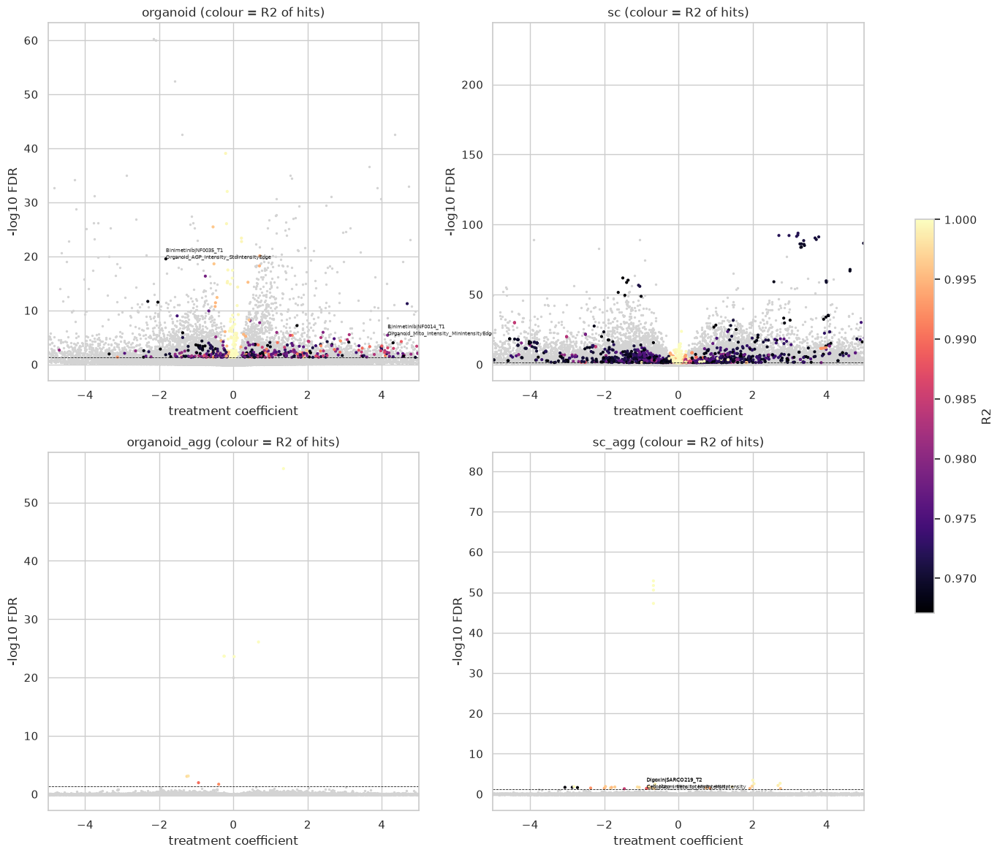

In [ ]:
# volcano plots with the top hits per profile labeled
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
for ax, p in zip(axes.flat, profiles):
    d = trt[p].copy()
    d["neglog_fdr"] = -np.log10(d["pvalue_fdr"].clip(lower=1e-300))
    non_hit = d.loc[~d["hit"]]
    non_hit = non_hit.sample(min(len(non_hit), 60000), random_state=0)
    ax.scatter(
        non_hit["coefficient"],
        non_hit["neglog_fdr"],
        s=2,
        c="lightgrey",
        rasterized=True,
    )
    hits = d.loc[d["hit"]]
    sc = ax.scatter(
        hits["coefficient"],
        hits["neglog_fdr"],
        s=4,
        c=hits["rsquared"],
        cmap="magma",
        rasterized=True,
    )
    top = hits.nlargest(8, "term_pct_of_total_var")
    for _, r in top.iterrows():
        ax.annotate(
            f"{r['drug']}|{r['patient']}\n{r['feature']}",
            (r["coefficient"], r["neglog_fdr"]),
            fontsize=5,
        )
    ax.axhline(-np.log10(FDR_MAX), color="k", ls="--", lw=0.6)
    ax.set_xlim(-5, 5)
    ax.set_title(f"{p} (colour = R2 of hits)")
    ax.set_xlabel("treatment coefficient")
    ax.set_ylabel("-log10 FDR")
plt.colorbar(sc, ax=axes, label="R2", shrink=0.5)
savefig(fig, "4_volcano_by_profile")

## 5. Variance partitioning

*For each model the variance is split into treatment, the three count
covariates, a shared/unattributed part (collinear covariates -- type II SS
do not add up to the explained variance) and the residual. Which piece
dominates?*

In [ ]:
partition_rows = []
for p in profiles:
    w = wide_pct[p].reindex(columns=term_order)  # terms a profile lacks stay NaN
    meta = trt[p].set_index(model_keys)
    explained = meta["explained_pct"].reindex(w.index)
    resid = meta["residual_pct"].reindex(w.index)
    row = {t: w[t].mean() for t in term_order}
    row["shared/unattributed"] = (explained - w.sum(axis=1)).mean()
    row["residual"] = resid.mean()
    row["profile"] = p
    partition_rows.append(row)
partition = pd.DataFrame(partition_rows).set_index("profile")
partition.reset_index().to_parquet(
    results_path / "variance_partition_mean.parquet", index=False
)
save_plot_data("5_variance_partition_by_profile", partition=partition)
partition

In [ ]:
# treatment variance share by patient and drug (organoid & sc)
save_plot_data(
    "5_treatment_variance_share_heatmap",
    share=pd.concat(
        [
            trt[p]
            .groupby(["patient", "treatment"])["term_pct_of_total_var"]
            .median()
            .rename("median_pct_var")
            .reset_index()
            .assign(profile=p)
            for p in main_profiles
        ]
    ),
)
# same plot but max instead of median
fig, axes = plt.subplots(1, 2, figsize=(22, 7))
for ax, p in zip(axes, main_profiles):
    m = (
        trt[p]
        .groupby(["patient", "treatment"])["term_pct_of_total_var"]
        .median()
        .unstack("treatment")
        .reindex(index=all_patients, columns=all_treatments)
    )
    sns.heatmap(m, ax=ax, cmap="rocket_r", cbar_kws={"label": "median treatment % var"})
    ax.set_title(f"{p}: how much does treatment explain?")
plt.tight_layout()
savefig(fig, "5_treatment_variance_share_heatmap")

## 6. Hit landscape

*Which patients, drugs, MOAs, doses and tumor types produce the most hits?
The hit rate is hits / models tested so unbalanced designs do not mislead.*

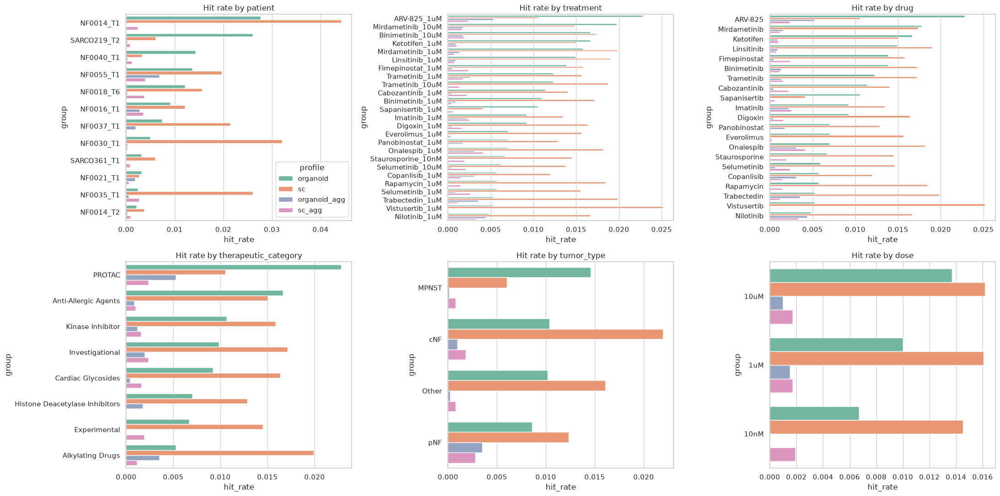

In [ ]:
def hit_rate(df, by):
    return (
        df.groupby(by)["hit"].agg(hit_rate="mean", hits="sum", n="size").reset_index()
    )


landscape = []
for p in profiles:
    for by in [
        "patient",
        "treatment",
        "drug",
        "therapeutic_category",
        "tumor_type",
        "dose",
    ]:
        r = hit_rate(trt[p], by)
        r["level"] = by
        r["profile"] = p
        landscape.append(r.rename(columns={by: "group"}))
landscape = pd.concat(landscape)
landscape.to_parquet(results_path / "hit_rate_landscape.parquet", index=False)

fig, axes = plt.subplots(2, 3, figsize=(22, 11))
for ax, by in zip(
    axes.flat,
    ["patient", "treatment", "drug", "therapeutic_category", "tumor_type", "dose"],
):
    sub = landscape.loc[landscape["level"] == by]
    order = (
        sub.loc[sub["profile"] == "organoid"]
        .sort_values("hit_rate", ascending=False)["group"]
        .tolist()
    )
    order += [g for g in sub["group"].unique() if g not in order]
    sns.barplot(
        data=sub,
        y="group",
        x="hit_rate",
        hue="profile",
        order=order,
        palette=profile_palette,
        ax=ax,
    )
    ax.set_title(f"Hit rate by {by}")
    if by != "patient":
        ax.legend_.remove()
plt.tight_layout()
savefig(fig, "6_hit_rate_by_group")

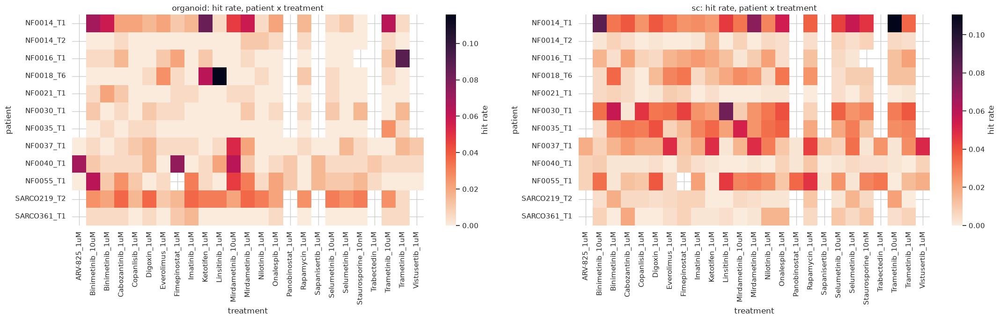

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(22, 7))
for ax, p in zip(axes, main_profiles):
    m = (
        trt[p]
        .groupby(["patient", "treatment"])["hit"]
        .mean()
        .unstack("treatment")
        .reindex(index=all_patients, columns=all_treatments)
    )
    sns.heatmap(m, ax=ax, cmap="rocket_r", cbar_kws={"label": "hit rate"})
    ax.set_title(f"{p}: hit rate, patient x treatment")
plt.tight_layout()
savefig(fig, "6_hit_rate_patient_by_treatment")

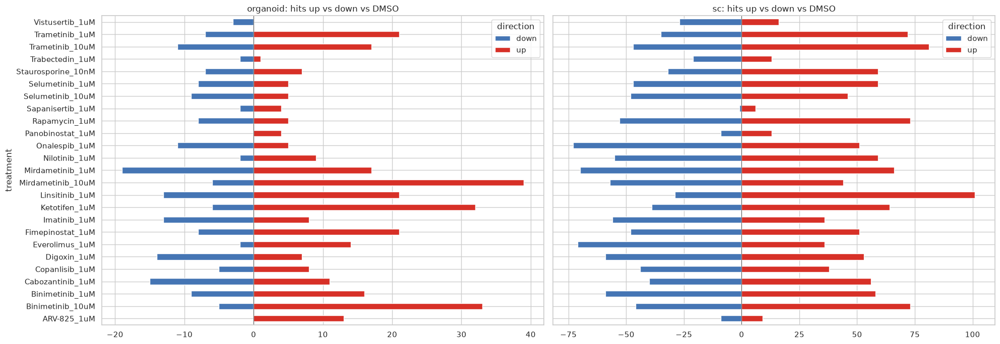

In [ ]:
# direction of hits: is a drug mostly increasing or decreasing features?
fig, axes = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
for ax, p in zip(axes, main_profiles):
    h = trt[p].loc[trt[p]["hit"]]
    direction = (
        h.assign(direction=np.where(h["coefficient"] > 0, "up", "down"))
        .groupby(["treatment", "direction"])
        .size()
        .unstack(fill_value=0)
        .reindex(all_treatments, fill_value=0)
    )
    direction["down"] = -direction.get("down", 0)
    direction[["down", "up"]].plot.barh(
        stacked=True, ax=ax, color=["#4575b4", "#d73027"]
    )
    ax.set_title(f"{p}: hits up vs down vs DMSO")
    ax.axvline(0, color="k", lw=0.5)
plt.tight_layout()
savefig(fig, "6_hit_direction_by_treatment")

## 7. Feature space enrichment

*Which parts of the morphology feature space respond? Fisher exact test of
hit vs non-hit for every compartment / channel / feature type.*

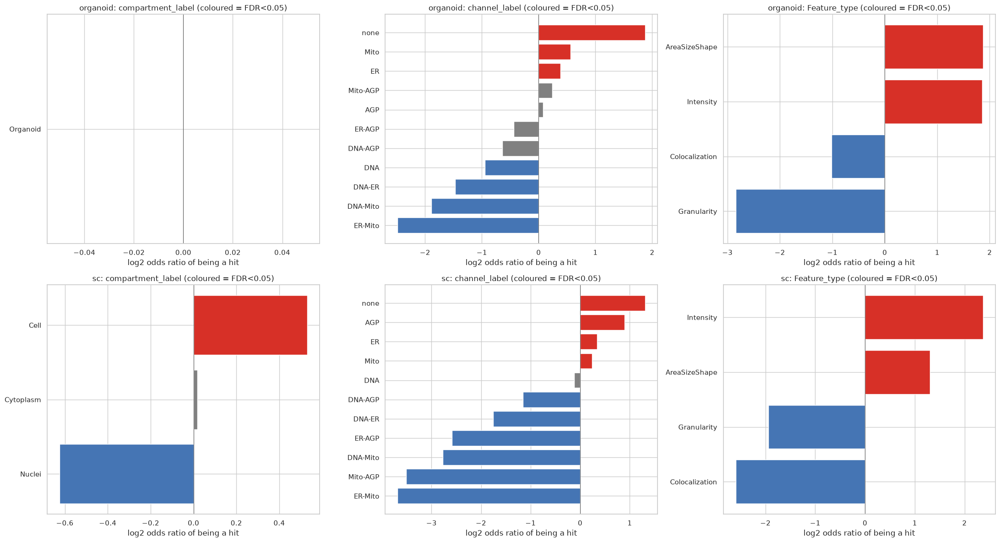

In [ ]:
def enrichment(df, col):
    df = df.assign(_lvl=df[col].astype(str))
    tot, tot_hit = len(df), int(df["hit"].sum())
    rows = []
    for lvl, g in df.groupby("_lvl"):
        a = int(g["hit"].sum())
        b = len(g) - a
        c = tot_hit - a
        d = (tot - tot_hit) - b
        odds, pval = fisher_exact([[a, b], [c, d]])
        rows.append(
            {
                "level": lvl,
                "n": len(g),
                "hits": a,
                "hit_rate": a / len(g),
                "odds_ratio": odds,
                "pvalue": pval,
            }
        )
    out = pd.DataFrame(rows)
    out["fdr"] = multipletests(out["pvalue"], method="fdr_bh")[1]
    out["log2_or"] = np.log2(out["odds_ratio"].replace(0, np.nan))
    out["family"] = col
    return out


enr = pd.concat(
    [
        enrichment(trt[p], col).assign(profile=p)
        for p in main_profiles
        for col in ["compartment_label", "channel_label", "Feature_type", "Measurement"]
    ]
)
enr.to_parquet(results_path / "feature_family_enrichment.parquet", index=False)

fig, axes = plt.subplots(2, 3, figsize=(22, 12))
for i, p in enumerate(main_profiles):
    for j, fam in enumerate(["compartment_label", "channel_label", "Feature_type"]):
        sub = enr.loc[(enr["profile"] == p) & (enr["family"] == fam)].sort_values(
            "log2_or"
        )
        colors = np.where(
            sub["fdr"] < 0.05,
            np.where(sub["log2_or"] > 0, "#d73027", "#4575b4"),
            "grey",
        )
        axes[i, j].barh(sub["level"], sub["log2_or"], color=colors)
        axes[i, j].axvline(0, color="k", lw=0.5)
        axes[i, j].set_title(f"{p}: {fam} (coloured = FDR<0.05)")
        axes[i, j].set_xlabel("log2 odds ratio of being a hit")
plt.tight_layout()
savefig(fig, "7_feature_family_enrichment")

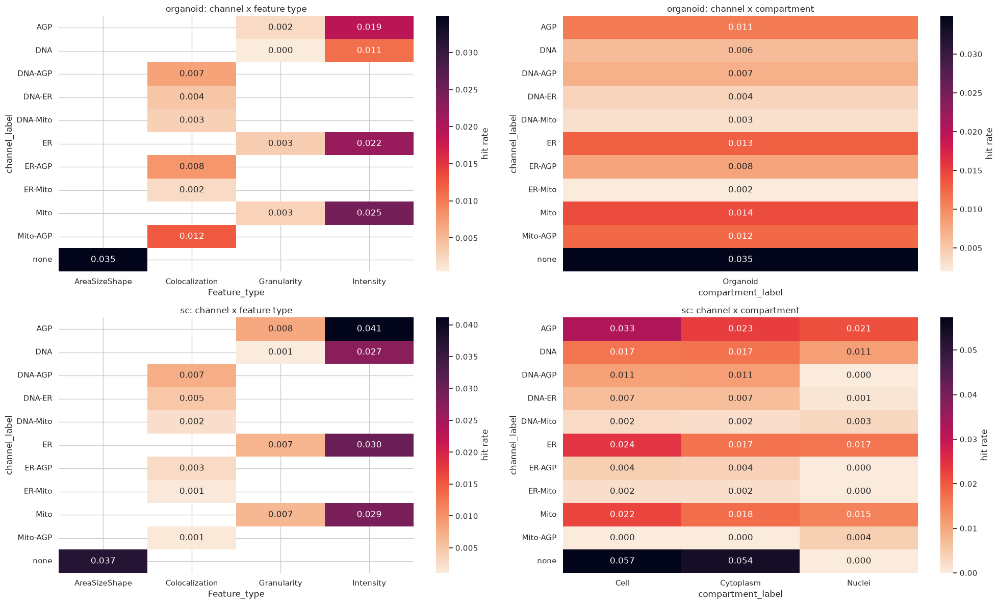

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
for i, p in enumerate(main_profiles):
    m = trt[p].pivot_table(
        index="channel_label", columns="Feature_type", values="hit", aggfunc="mean"
    )
    sns.heatmap(
        m,
        ax=axes[i, 0],
        cmap="rocket_r",
        annot=True,
        fmt=".3f",
        cbar_kws={"label": "hit rate"},
    )
    axes[i, 0].set_title(f"{p}: channel x feature type")
    m = trt[p].pivot_table(
        index="channel_label", columns="compartment_label", values="hit", aggfunc="mean"
    )
    sns.heatmap(
        m,
        ax=axes[i, 1],
        cmap="rocket_r",
        annot=True,
        fmt=".3f",
        cbar_kws={"label": "hit rate"},
    )
    axes[i, 1].set_title(f"{p}: channel x compartment")
plt.tight_layout()
savefig(fig, "7_channel_by_feature_type_heatmaps")

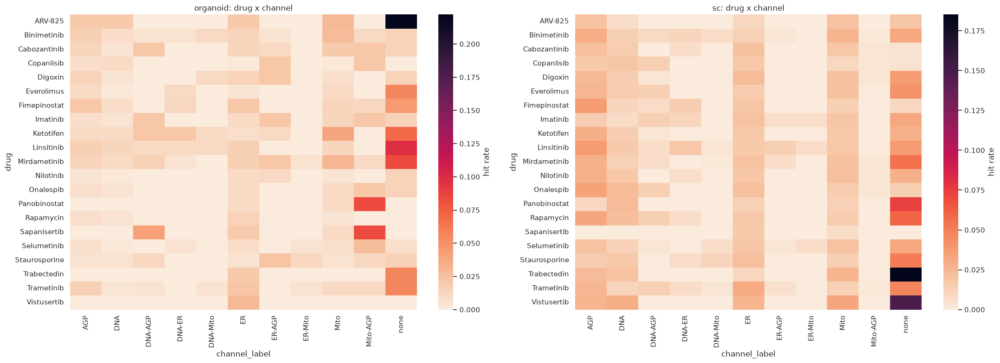

In [ ]:
# which drugs "own" which channels? MOA x channel hit rate
fig, axes = plt.subplots(1, 2, figsize=(22, 8))
for ax, p in zip(axes, main_profiles):
    m = trt[p].pivot_table(
        index="drug", columns="channel_label", values="hit", aggfunc="mean"
    )
    sns.heatmap(m, ax=ax, cmap="rocket_r", cbar_kws={"label": "hit rate"})
    ax.set_title(f"{p}: drug x channel")
plt.tight_layout()
savefig(fig, "7_drug_by_channel_hit_rate")

## 8. Dose response

*For drugs tested at more than one dose: do the doses agree in direction?
Does effect size grow with dose (a hallmark of a real pharmacological
effect)?*

In [ ]:
dose_pairs = []
for p in profiles:
    d = trt[p]
    multi = d.groupby("drug")["dose"].nunique()
    multi = multi[multi > 1].index
    d = d.loc[d["drug"].isin(multi)]
    wide = d.pivot_table(
        index=["patient", "drug", "feature"], columns="dose", values="coefficient"
    )
    for drug, sub in wide.groupby(level="drug"):
        sub = sub.dropna(axis=1, how="all").dropna()
        doses = list(sub.columns)
        if len(doses) < 2:
            continue
        lo, hi = doses[0], doses[-1]
        rho = spearmanr(sub[lo], sub[hi])[0]
        agree = (np.sign(sub[lo]) == np.sign(sub[hi])).mean()
        dose_pairs.append(
            {
                "profile": p,
                "drug": drug,
                "dose_a": lo,
                "dose_b": hi,
                "n": len(sub),
                "spearman": rho,
                "sign_agreement": agree,
            }
        )
dose_pairs = pd.DataFrame(dose_pairs)
dose_pairs.to_parquet(results_path / "dose_concordance.parquet", index=False)
dose_pairs

,profile,drug,dose_a,dose_b,n,spearman,sign_agreement
0,organoid,Binimetinib,10uM,1uM,2280,0.409139,0.656140
1,organoid,Mirdametinib,10uM,1uM,2280,0.055057,0.521491
2,organoid,Selumetinib,10uM,1uM,2280,0.562555,0.728509
3,organoid,Trametinib,10uM,1uM,2280,0.350103,0.629386
4,sc,Binimetinib,10uM,1uM,6840,0.396935,0.646930
5,sc,Mirdametinib,10uM,1uM,6840,0.128900,0.550439
6,sc,Selumetinib,10uM,1uM,6840,0.470308,0.673977
7,sc,Trametinib,10uM,1uM,6840,0.317521,0.610380
8,organoid_agg,Binimetinib,10uM,1uM,2280,0.407556,0.689912
9,organoid_agg,Mirdametinib,10uM,1uM,2280,0.055511,0.552632


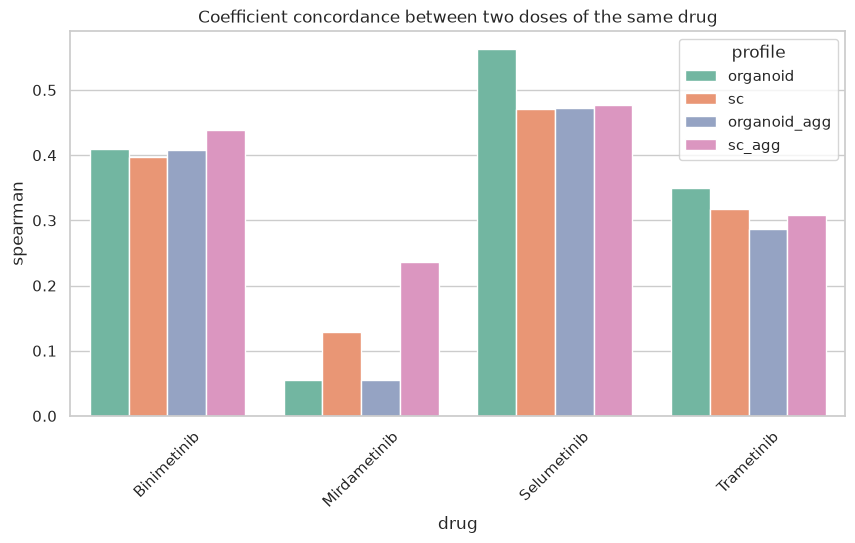

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(
    data=dose_pairs,
    x="drug",
    y="spearman",
    hue="profile",
    palette=profile_palette,
    ax=ax,
)
ax.set_title("Coefficient concordance between two doses of the same drug")
ax.tick_params(axis="x", rotation=45)
savefig(fig, "8_dose_concordance")

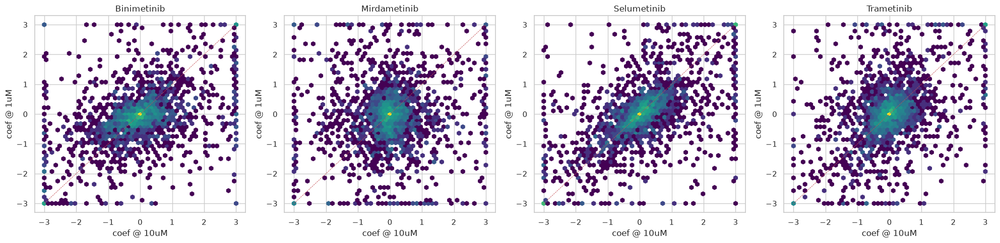

In [ ]:
# scatter of low vs high dose for each multi-dose drug (organoid)
p = "organoid"
d = trt[p]
multi = d.groupby("drug")["dose"].nunique()
multi = list(multi[multi > 1].index)
fig, axes = plt.subplots(
    1, max(len(multi), 1), figsize=(5 * max(len(multi), 1), 5), squeeze=False
)
for ax, drug in zip(axes[0], multi):
    sub = (
        d.loc[d["drug"] == drug]
        .pivot_table(index=["patient", "feature"], columns="dose", values="coefficient")
        .dropna()
    )
    a, b = sub.columns[0], sub.columns[-1]
    ax.hexbin(
        sub[a].clip(-3, 3), sub[b].clip(-3, 3), gridsize=50, bins="log", cmap="viridis"
    )
    ax.plot([-3, 3], [-3, 3], "r--", lw=0.6)
    ax.set_xlabel(f"coef @ {a}")
    ax.set_ylabel(f"coef @ {b}")
    ax.set_title(drug)
plt.tight_layout()
savefig(fig, "8_dose_scatter_organoid")

In [ ]:
# does |effect| grow with dose? (units of the smaller dose that are hits)
grow_rows = []
for p in profiles:
    d = trt[p]
    multi = d.groupby("drug")["dose"].nunique()
    for drug in multi[multi > 1].index:
        sub = d.loc[d["drug"] == drug].pivot_table(
            index=["patient", "feature"], columns="dose", values="coefficient"
        )
        hits = d.loc[(d["drug"] == drug) & d["hit"]].set_index(["patient", "feature"])
        # dose ordering by numeric value inside the label (1uM < 10uM)
        cols = sorted(
            sub.columns,
            key=lambda s: float("".join(c for c in s if c.isdigit() or c == ".") or 0),
        )
        if len(cols) < 2:
            continue
        lo, hi = cols[0], cols[-1]
        lo_hit_idx = hits.loc[hits["dose"] == lo].index.unique()
        s = sub.reindex(lo_hit_idx).dropna(subset=[lo, hi])
        grow_rows.append(
            {
                "profile": p,
                "drug": drug,
                "low": lo,
                "high": hi,
                "n_low_dose_hits": len(s),
                "frac_grow_with_dose": (s[hi].abs() > s[lo].abs()).mean()
                if len(s)
                else np.nan,
                "frac_same_sign": (np.sign(s[hi]) == np.sign(s[lo])).mean()
                if len(s)
                else np.nan,
            }
        )
dose_growth = pd.DataFrame(grow_rows)
dose_growth.to_parquet(results_path / "dose_growth.parquet", index=False)
dose_growth

,profile,drug,low,high,n_low_dose_hits,frac_grow_with_dose,frac_same_sign
0,organoid,Binimetinib,1uM,10uM,25,0.160000,0.920000
1,organoid,Mirdametinib,1uM,10uM,36,0.083333,0.416667
2,organoid,Selumetinib,1uM,10uM,13,0.461538,0.846154
3,organoid,Trametinib,1uM,10uM,28,0.071429,0.821429
4,sc,Binimetinib,1uM,10uM,117,0.282051,0.726496
5,sc,Mirdametinib,1uM,10uM,136,0.227941,0.588235
6,sc,Selumetinib,1uM,10uM,106,0.311321,0.867925
7,sc,Trametinib,1uM,10uM,107,0.271028,0.700935
8,organoid_agg,Binimetinib,1uM,10uM,2,0.000000,0.500000
9,organoid_agg,Mirdametinib,1uM,10uM,3,0.000000,0.000000


## 9. Cross-patient reproducibility

*A needle should be found in more than one patient, in the same direction.
For every (treatment, feature): in how many patients is it a hit, and do
those hits agree in sign?*

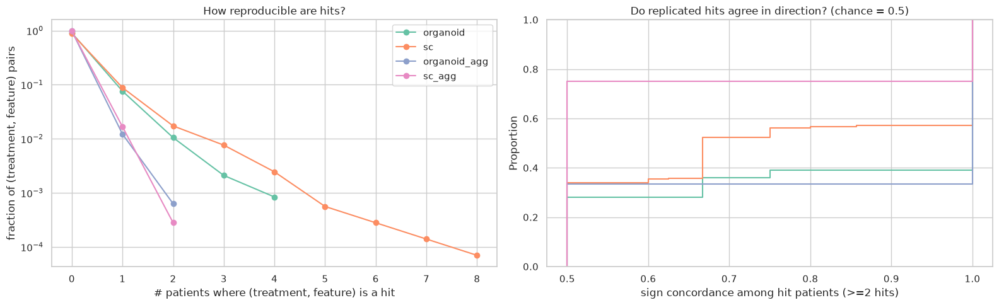

In [ ]:
def consensus_table(df):
    d = df.assign(
        pos_hit=df["hit"] & (df["coefficient"] > 0),
        neg_hit=df["hit"] & (df["coefficient"] < 0),
        abs_coef=df["coefficient"].abs(),
    )
    g = d.groupby(
        ["treatment", "drug", "therapeutic_category", "feature"], dropna=False
    )
    out = g.agg(
        n_patients_tested=("patient", "nunique"),
        n_patients_hit=("hit", "sum"),
        n_pos=("pos_hit", "sum"),
        n_neg=("neg_hit", "sum"),
        mean_coef=("coefficient", "mean"),
        mean_abs_coef=("abs_coef", "mean"),
        median_treatment_pct=("term_pct_of_total_var", "median"),
    ).reset_index()
    out["sign_concordance"] = out[["n_pos", "n_neg"]].max(axis=1) / out[
        "n_patients_hit"
    ].replace(0, np.nan)
    return out


consensus = {p: consensus_table(trt[p]) for p in profiles}
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
for p in profiles:
    c = consensus[p]
    counts = c["n_patients_hit"].value_counts(normalize=True).sort_index()
    axes[0].plot(
        counts.index, counts.values, marker="o", label=p, color=profile_palette[p]
    )
    conc = c.loc[c["n_patients_hit"] >= 2, "sign_concordance"]
    sns.ecdfplot(conc, ax=axes[1], label=p, color=profile_palette[p])
axes[0].set_yscale("log")
axes[0].set_xlabel("# patients where (treatment, feature) is a hit")
axes[0].set_ylabel("fraction of (treatment, feature) pairs")
axes[0].set_title("How reproducible are hits?")
axes[1].set_xlabel("sign concordance among hit patients (>=2 hits)")
axes[1].set_title("Do replicated hits agree in direction? (chance = 0.5)")
axes[0].legend()
plt.tight_layout()
savefig(fig, "9_patients_per_hit_and_concordance")

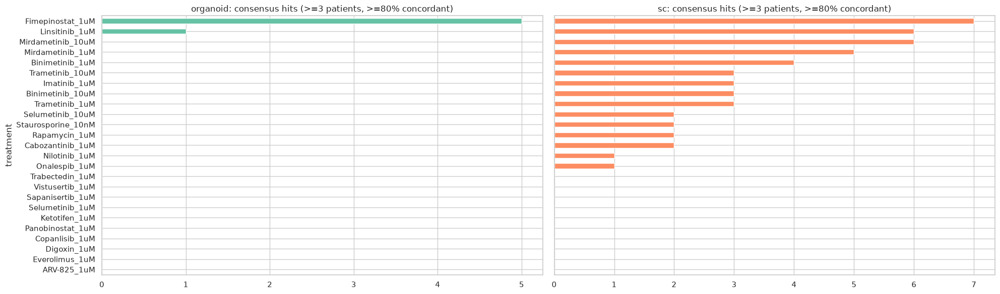

In [ ]:
# consensus hits per treatment: >=3 patients, >=80% same sign
fig, axes = plt.subplots(1, 2, figsize=(20, 6), sharey=True)
consensus_counts = []
for ax, p in zip(axes, main_profiles):
    c = consensus[p]
    cons = c.loc[(c["n_patients_hit"] >= 3) & (c["sign_concordance"] >= 0.8)]
    cnt = (
        cons.groupby("treatment")
        .size()
        .reindex(all_treatments, fill_value=0)
        .sort_values()
    )
    cnt.plot.barh(ax=ax, color=profile_palette[p])
    ax.set_title(f"{p}: consensus hits (>=3 patients, >=80% concordant)")
    consensus_counts.append(cnt.rename(p))
pd.concat(consensus_counts, axis=1).reset_index().to_parquet(
    results_path / "consensus_hit_counts.parquet", index=False
)
plt.tight_layout()
savefig(fig, "9_consensus_hits_per_treatment")

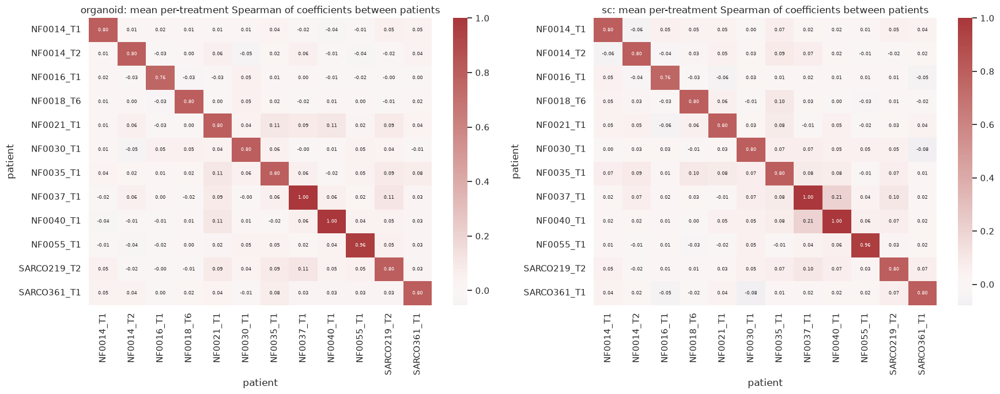

In [ ]:
# patient x patient agreement of the full treatment signature
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, p in zip(axes, main_profiles):
    mats = []
    for trtm, g in trt[p].groupby("treatment"):
        w = g.pivot(index="feature", columns="patient", values="coefficient").reindex(
            columns=all_patients
        )
        mats.append(w.corr(method="spearman"))
    mean_corr = sum(m.fillna(0) for m in mats) / len(mats)
    sns.heatmap(
        mean_corr,
        ax=ax,
        cmap="vlag",
        center=0,
        annot=True,
        fmt=".2f",
        annot_kws={"size": 6},
    )
    ax.set_title(f"{p}: mean per-treatment Spearman of coefficients between patients")
plt.tight_layout()
savefig(fig, "9_patient_patient_agreement")

## 10. Treatment similarity

*Do drugs with the same MOA give similar morphological signatures? And
which is stronger: the patient effect or the drug effect?*

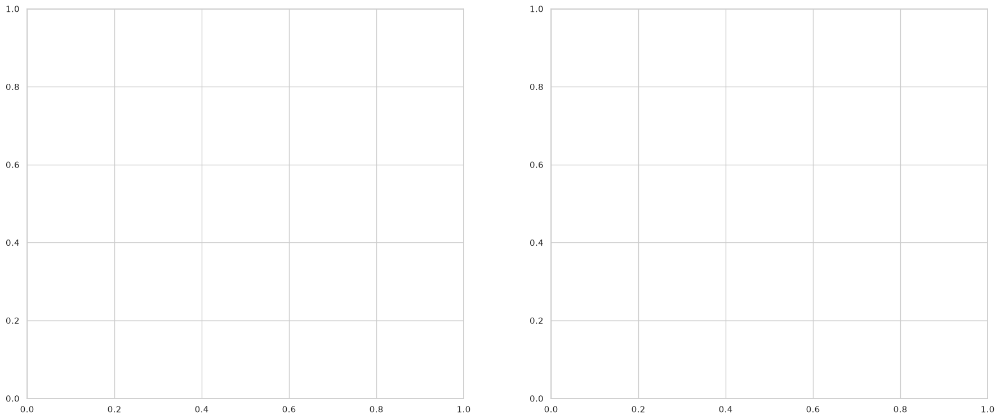

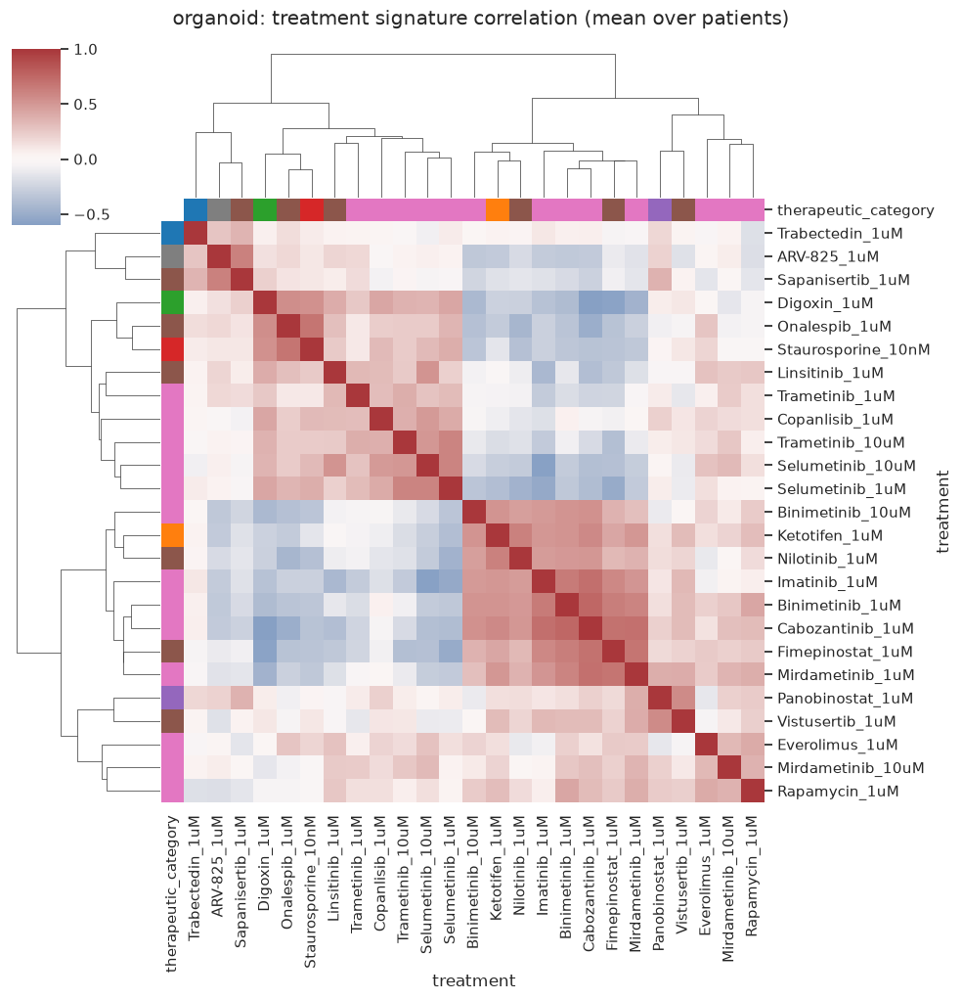

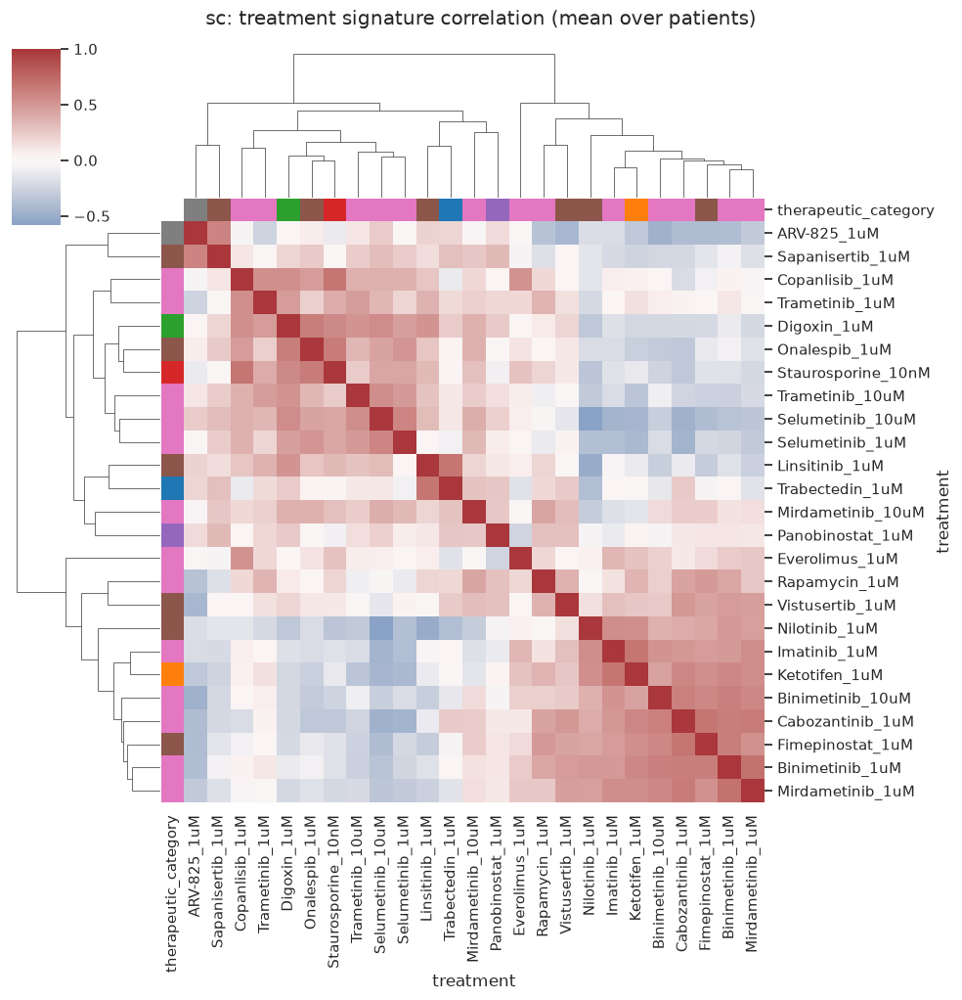

In [ ]:
sig_matrix = {}
for p in main_profiles:
    sig_matrix[p] = trt[p].pivot_table(
        index="feature", columns=["patient", "treatment"], values="coefficient"
    )

fig, axes = plt.subplots(1, 2, figsize=(22, 9))
for ax, p in zip(axes, main_profiles):
    mean_sig = trt[p].pivot_table(
        index="feature", columns="treatment", values="coefficient", aggfunc="mean"
    )
    corr = mean_sig.corr()
    moa = (
        trt[p]
        .drop_duplicates("treatment")
        .set_index("treatment")["therapeutic_category"]
        .reindex(corr.index)
    )
    cg = sns.clustermap(
        corr,
        cmap="vlag",
        center=0,
        figsize=(10, 10),
        row_colors=moa.map(moa_palette),
        col_colors=moa.map(moa_palette),
    )
    cg.fig.suptitle(
        f"{p}: treatment signature correlation (mean over patients)", y=1.02
    )
    savefig(cg.figure, f"10_treatment_signature_clustermap_{p}")
plt.close(fig)

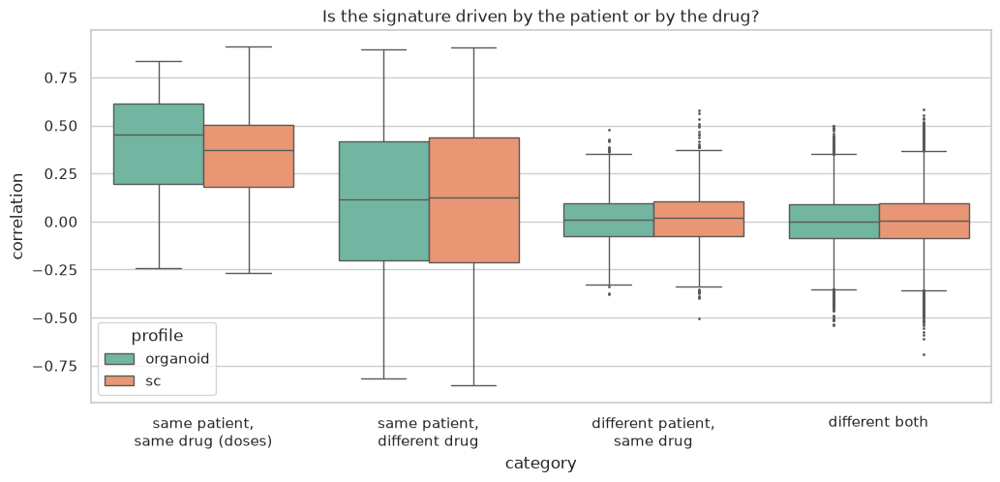

In [ ]:
# patient vs drug effect: correlate every (patient, treatment) signature
pair_rows = []
for p in main_profiles:
    m = sig_matrix[p].dropna(axis=0, how="any")
    if m.shape[0] < 10:
        m = sig_matrix[p].fillna(0)
    corr = m.corr()
    idx = corr.index
    pats = idx.get_level_values("patient")
    trts = idx.get_level_values("treatment")
    drugs = trts.str.rsplit("_", n=1).str[0]
    iu = np.triu_indices(len(idx), 1)
    c = corr.values[iu]
    same_p = pats.values[iu[0]] == pats.values[iu[1]]
    same_d = drugs.values[iu[0]] == drugs.values[iu[1]]
    cat = np.where(
        same_p & ~same_d,
        "same patient,\ndifferent drug",
        np.where(
            ~same_p & same_d,
            "different patient,\nsame drug",
            np.where(
                ~same_p & ~same_d, "different both", "same patient,\nsame drug (doses)"
            ),
        ),
    )
    pair_rows.append(pd.DataFrame({"profile": p, "category": cat, "correlation": c}))
pairs = pd.concat(pair_rows)
pairs.to_parquet(results_path / "signature_pair_correlations.parquet", index=False)
fig, ax = plt.subplots(figsize=(12, 5))
sns.boxplot(
    data=pairs,
    x="category",
    y="correlation",
    hue="profile",
    palette=profile_palette,
    ax=ax,
    fliersize=1,
)
ax.set_title("Is the signature driven by the patient or by the drug?")
savefig(fig, "10_patient_vs_drug_signature")

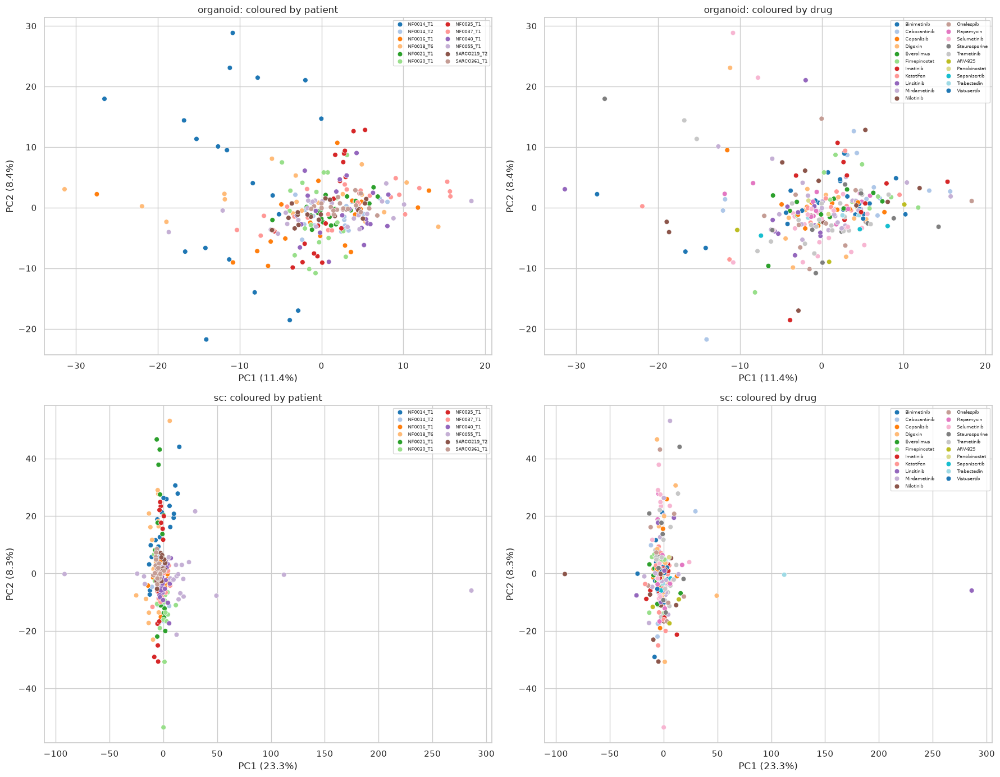

In [ ]:
# PCA (SVD) of all patient x treatment signatures
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
for i, p in enumerate(main_profiles):
    m = sig_matrix[p].fillna(0).T
    x = m.values - m.values.mean(axis=0)
    u, s, vt = np.linalg.svd(x, full_matrices=False)
    pcs = u[:, :2] * s[:2]
    var = (s**2 / (s**2).sum())[:2] * 100
    meta = pd.DataFrame(m.index.tolist(), columns=["patient", "treatment"])
    meta["drug"] = meta["treatment"].str.rsplit("_", n=1).str[0]
    meta["tumor_type"] = meta["patient"].map(tumor_type_dict)
    meta["PC1"], meta["PC2"] = pcs[:, 0], pcs[:, 1]
    meta.assign(profile=p).to_parquet(
        results_path / f"signature_pca_{p}.parquet", index=False
    )
    sns.scatterplot(
        data=meta, x="PC1", y="PC2", hue="patient", ax=axes[i, 0], s=40, palette="tab20"
    )
    axes[i, 0].set_title(f"{p}: coloured by patient")
    axes[i, 0].legend(fontsize=6, ncol=2)
    sns.scatterplot(
        data=meta, x="PC1", y="PC2", hue="drug", ax=axes[i, 1], s=40, palette="tab20"
    )
    axes[i, 1].set_title(f"{p}: coloured by drug")
    axes[i, 1].legend(fontsize=6, ncol=2)
    for ax in axes[i]:
        ax.set_xlabel(f"PC1 ({var[0]:.1f}%)")
        ax.set_ylabel(f"PC2 ({var[1]:.1f}%)")
plt.tight_layout()
savefig(fig, "10_signature_pca")

## 11. Organoid vs single cell

*Organoid and single-cell features share (Channel, Feature type,
Measurement) but not a compartment. Averaging the single-cell coefficient
over its compartments gives a like-for-like comparison. Do the two scales
agree on direction, on which patient x treatment responds, and on hit rate?*

46,805 shared (patient, treatment, feature) tuples


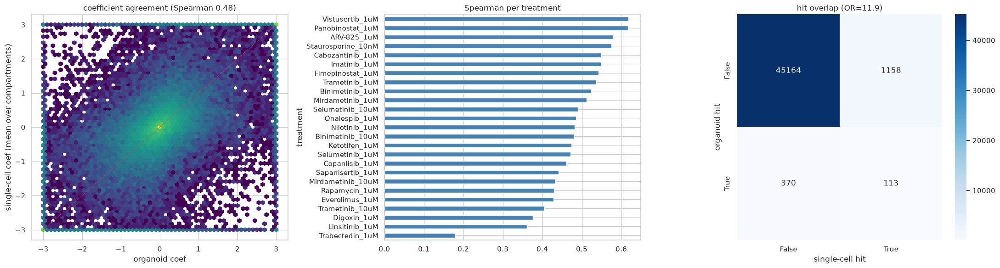

In [ ]:
shared = [
    "patient",
    "treatment",
    "drug",
    "therapeutic_category",
    "channel_label",
    "Feature_type",
    "Measurement",
]
org_c = (
    trt["organoid"]
    .groupby(shared, dropna=False)
    .agg(coef_org=("coefficient", "mean"), hit_org=("hit", "any"))
    .reset_index()
)
sc_c = (
    trt["sc"]
    .groupby(shared, dropna=False)
    .agg(coef_sc=("coefficient", "mean"), hit_sc=("hit", "any"))
    .reset_index()
)
os_merge = org_c.merge(sc_c, on=shared, how="inner")
print(f"{len(os_merge):,} shared (patient, treatment, feature) tuples")

fig, axes = plt.subplots(1, 3, figsize=(22, 6))
axes[0].hexbin(
    os_merge["coef_org"].clip(-3, 3),
    os_merge["coef_sc"].clip(-3, 3),
    gridsize=60,
    bins="log",
    cmap="viridis",
)
axes[0].plot([-3, 3], [-3, 3], "r--", lw=0.6)
rho = spearmanr(os_merge["coef_org"], os_merge["coef_sc"])[0]
axes[0].set_title(f"coefficient agreement (Spearman {rho:.2f})")
axes[0].set_xlabel("organoid coef")
axes[0].set_ylabel("single-cell coef (mean over compartments)")
per_trt = (
    os_merge.groupby("treatment")
    .apply(lambda g: spearmanr(g["coef_org"], g["coef_sc"])[0])
    .sort_values()
)
per_trt.plot.barh(ax=axes[1], color="steelblue")
axes[1].set_title("Spearman per treatment")
cont = pd.crosstab(os_merge["hit_org"], os_merge["hit_sc"])
sns.heatmap(cont, annot=True, fmt="d", cmap="Blues", ax=axes[2])
odds = fisher_exact(cont.values)[0] if cont.shape == (2, 2) else np.nan
axes[2].set_title(f"hit overlap (OR={odds:.1f})")
axes[2].set_ylabel("organoid hit")
axes[2].set_xlabel("single-cell hit")
plt.tight_layout()
savefig(fig, "11_organoid_vs_sc_agreement")
per_trt.rename("spearman").reset_index().to_parquet(
    results_path / "organoid_vs_sc_per_treatment.parquet", index=False
)

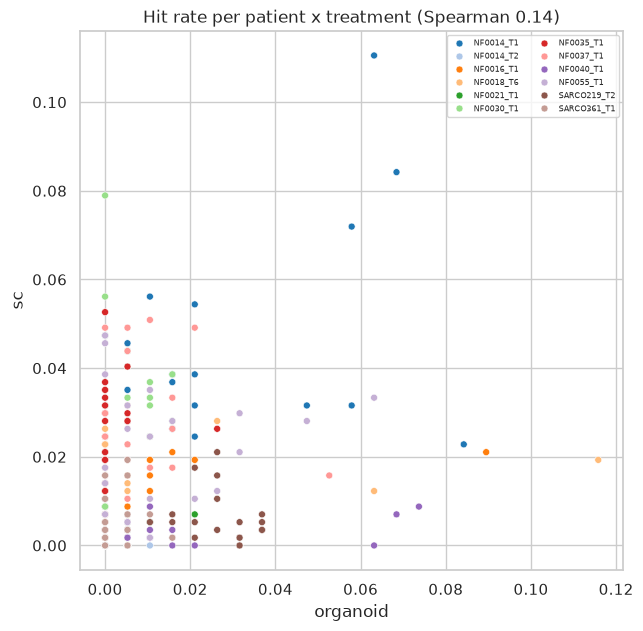

In [ ]:
# does the same patient x treatment respond at both scales?
rate = (
    trt["organoid"]
    .groupby(["patient", "treatment"])["hit"]
    .mean()
    .rename("organoid")
    .to_frame()
    .join(
        trt["sc"].groupby(["patient", "treatment"])["hit"].mean().rename("sc"),
        how="inner",
    )
    .reset_index()
)
fig, ax = plt.subplots(figsize=(7, 7))
sns.scatterplot(
    data=rate, x="organoid", y="sc", hue="patient", ax=ax, palette="tab20", s=25
)
r = spearmanr(rate["organoid"], rate["sc"])[0]
ax.set_title(f"Hit rate per patient x treatment (Spearman {r:.2f})")
ax.legend(fontsize=6, ncol=2)
savefig(fig, "11_hit_rate_organoid_vs_sc")

## 12. Aggregated vs non-aggregated profiles

*`*_agg` profiles have far fewer rows per model. Do their coefficients and
hits agree with the full-resolution fits?*

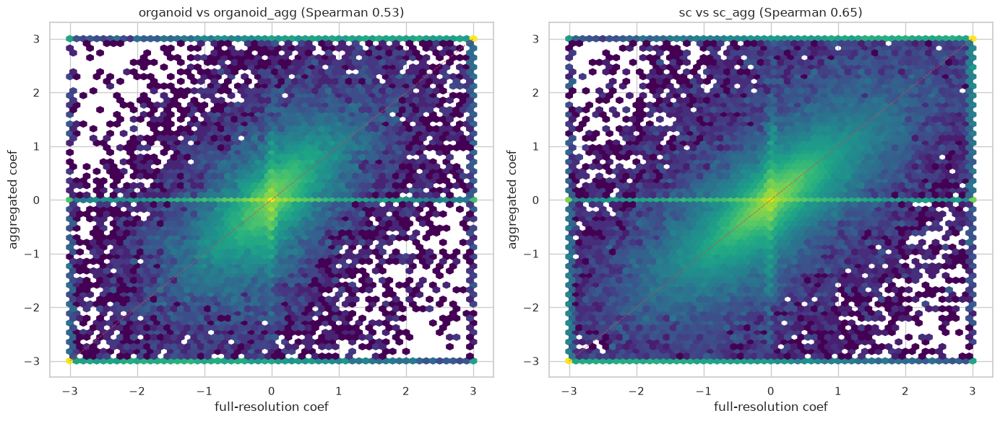

,pair,n_models,spearman_coef,hits_full,hits_agg,hits_both,jaccard_hits,sign_agree_when_full_hit
0,organoid vs organoid_agg,48070,0.533551,508,64,0,0.000000,0.820866
1,sc vs sc_agg,144210,0.648582,2308,247,6,0.002354,0.798527


In [ ]:
agg_pairs = [("organoid", "organoid_agg"), ("sc", "sc_agg")]
agg_rows = []
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for ax, (a, b) in zip(axes, agg_pairs):
    m = trt[a][model_keys + ["coefficient", "hit", "sig", "rsquared"]].merge(
        trt[b][model_keys + ["coefficient", "hit", "sig", "rsquared"]],
        on=model_keys,
        suffixes=("_full", "_agg"),
    )
    ax.hexbin(
        m["coefficient_full"].clip(-3, 3),
        m["coefficient_agg"].clip(-3, 3),
        gridsize=60,
        bins="log",
        cmap="viridis",
    )
    ax.plot([-3, 3], [-3, 3], "r--", lw=0.6)
    rho = spearmanr(m["coefficient_full"], m["coefficient_agg"])[0]
    ax.set_title(f"{a} vs {b} (Spearman {rho:.2f})")
    ax.set_xlabel("full-resolution coef")
    ax.set_ylabel("aggregated coef")
    both = (m["hit_full"] & m["hit_agg"]).sum()
    agg_rows.append(
        {
            "pair": f"{a} vs {b}",
            "n_models": len(m),
            "spearman_coef": rho,
            "hits_full": int(m["hit_full"].sum()),
            "hits_agg": int(m["hit_agg"].sum()),
            "hits_both": int(both),
            "jaccard_hits": both / max((m["hit_full"] | m["hit_agg"]).sum(), 1),
            "sign_agree_when_full_hit": (
                np.sign(m.loc[m["hit_full"], "coefficient_full"])
                == np.sign(m.loc[m["hit_full"], "coefficient_agg"])
            ).mean(),
        }
    )
plt.tight_layout()
savefig(fig, "12_full_vs_agg_coefficients")
agg_concordance = pd.DataFrame(agg_rows)
agg_concordance.to_parquet(
    results_path / "full_vs_agg_concordance.parquet", index=False
)
agg_concordance

## 13. Which technical covariates matter?

*The models include well position / distance-from-center / depth covariates on
top of the cell and organoid counts. Which covariate terms explain variance and
reach significance?*

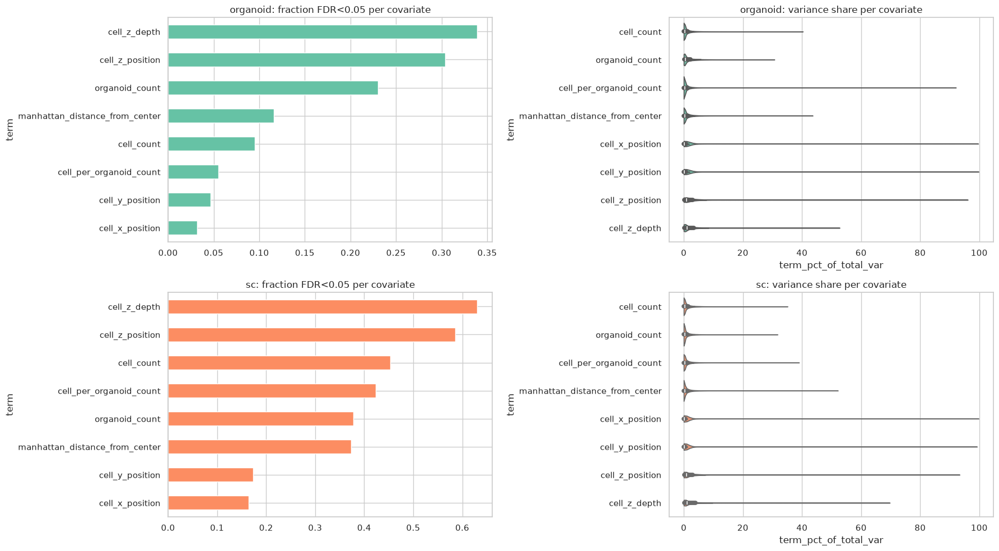

In [ ]:
fig, axes = plt.subplots(len(main_profiles), 2, figsize=(18, 5 * len(main_profiles)))
for i, p in enumerate(main_profiles):
    d = lm[p].loc[lm[p]["term"] != "treatment"]
    fr = d.groupby("term")["sig"].mean().reindex(covariate_terms).sort_values()
    fr.plot.barh(ax=axes[i, 0], color=profile_palette[p])
    axes[i, 0].set_title(f"{p}: fraction FDR<0.05 per covariate")
    sns.violinplot(
        data=d,
        y="term",
        x="term_pct_of_total_var",
        order=covariate_terms,
        ax=axes[i, 1],
        cut=0,
        color=profile_palette[p],
    )
    axes[i, 1].set_title(f"{p}: variance share per covariate")
plt.tight_layout()
savefig(fig, "13_technical_covariates")

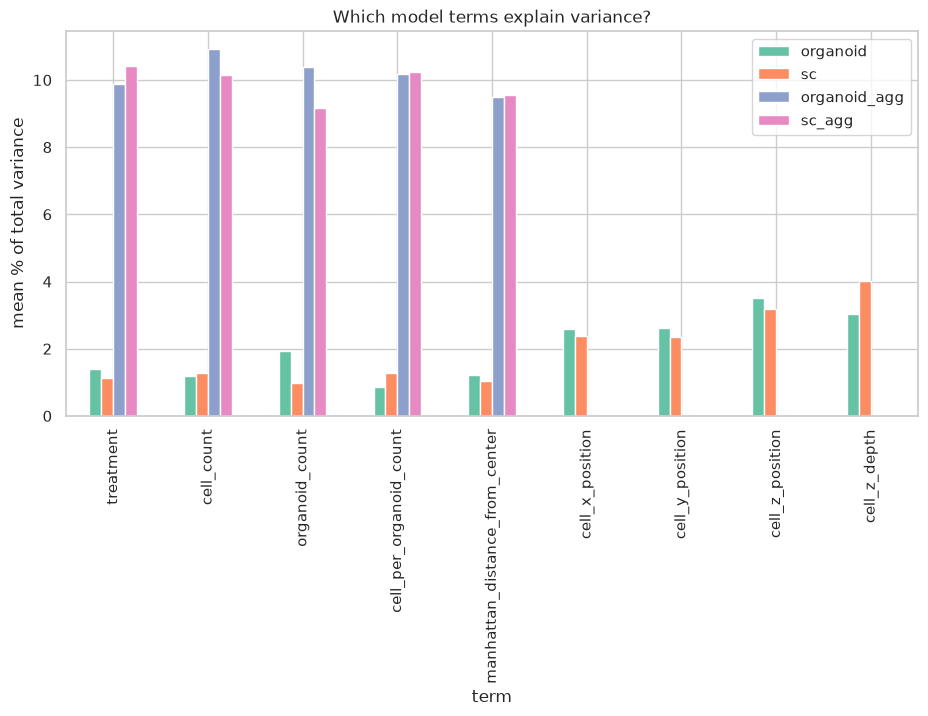

In [ ]:
# mean variance share of every term (treatment + covariates)
fig, ax = plt.subplots(figsize=(11, 5))
tv = pd.concat(
    [lm[p].groupby("term")["term_pct_of_total_var"].mean().rename(p) for p in profiles],
    axis=1,
).reindex(term_order)
tv.reset_index().to_parquet(results_path / "term_variance_share.parquet", index=False)
tv.plot.bar(ax=ax, color=[profile_palette[p] for p in profiles])
ax.set_ylabel("mean % of total variance")
ax.set_title("Which model terms explain variance?")
savefig(fig, "13_technical_term_variance")

## 14. Are hits just a change in a covariate?

*If a drug kills organoids/cells the count covariates absorb variance, and
position covariates can absorb plate effects. A hit where treatment explains
less variance than any covariate term is suspect.*

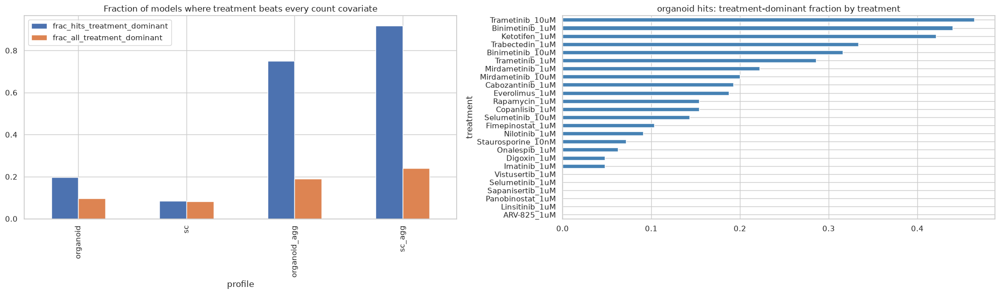

,profile,hits,frac_hits_treatment_dominant,frac_all_treatment_dominant
0,organoid,508,0.196850,0.096297
1,sc,2308,0.084489,0.083136
2,organoid_agg,64,0.750000,0.190847
3,sc_agg,247,0.919028,0.239685


In [ ]:
count_rows = []
for p in profiles:
    h = trt[p].loc[trt[p]["hit"]]
    count_rows.append(
        {
            "profile": p,
            "hits": len(h),
            "frac_hits_treatment_dominant": h["covariate_safe"].mean(),
            "frac_all_treatment_dominant": trt[p]["covariate_safe"].mean(),
        }
    )
count_df = pd.DataFrame(count_rows)
count_df.to_parquet(results_path / "count_confounding.parquet", index=False)
fig, axes = plt.subplots(1, 2, figsize=(20, 6))
count_df.set_index("profile")[
    ["frac_hits_treatment_dominant", "frac_all_treatment_dominant"]
].plot.bar(ax=axes[0])
axes[0].set_title("Fraction of models where treatment beats every count covariate")
m = (
    trt["organoid"]
    .loc[trt["organoid"]["hit"]]
    .groupby("treatment")["covariate_safe"]
    .mean()
    .sort_values()
)
m.plot.barh(ax=axes[1], color="steelblue")
axes[1].set_title("organoid hits: treatment-dominant fraction by treatment")
plt.tight_layout()
savefig(fig, "14_count_confounding")
count_df

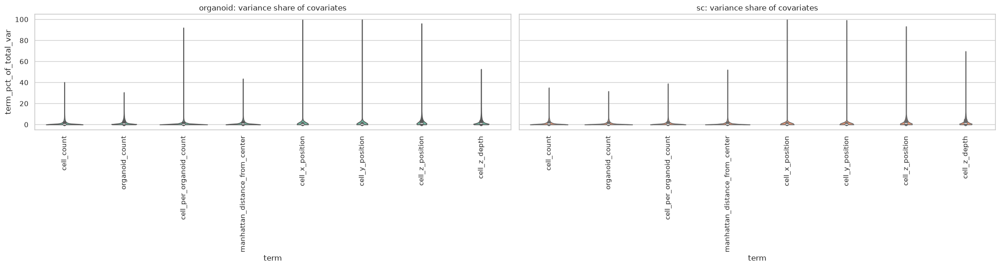

In [ ]:
# how much variance do the covariate terms themselves explain?
fig, axes = plt.subplots(1, 2, figsize=(22, 6), sharey=True)
for ax, p in zip(axes, main_profiles):
    d = lm[p].loc[lm[p]["term"].isin(covariate_terms)]
    sns.violinplot(
        data=d,
        x="term",
        y="term_pct_of_total_var",
        order=covariate_terms,
        ax=ax,
        cut=0,
        color=profile_palette[p],
    )
    ax.tick_params(axis="x", rotation=90)
    ax.set_title(f"{p}: variance share of covariates")
plt.tight_layout()
savefig(fig, "14_count_covariate_variance_share")

## 15. Sensitivity of the hit definition

*How many hits do you get as the FDR / R2 / effect thresholds move?*

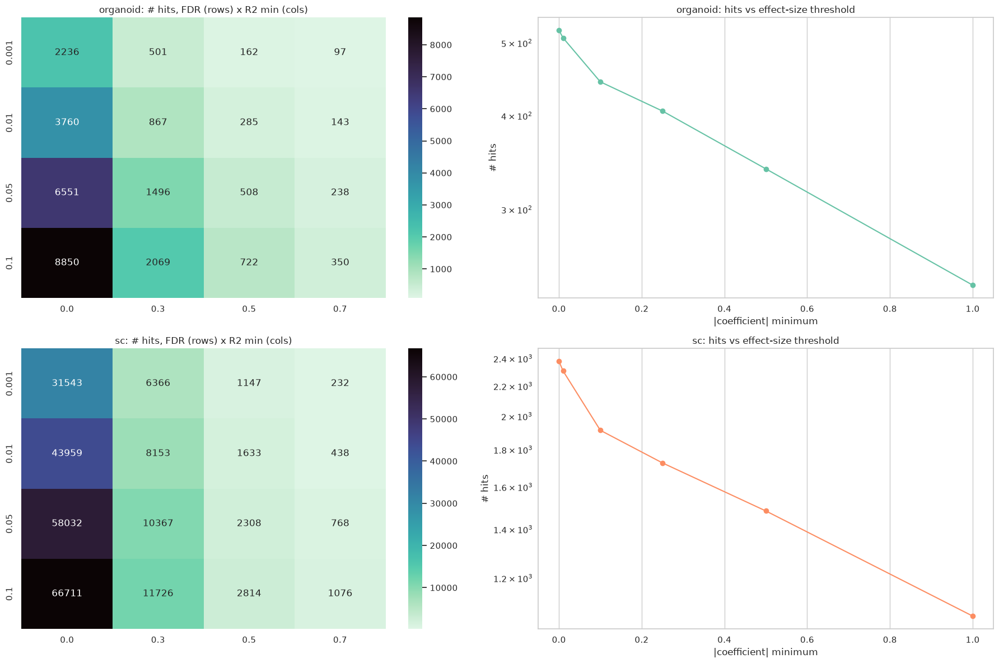

In [ ]:
fdrs = [0.001, 0.01, 0.05, 0.1]
r2s = [0.0, 0.3, 0.5, 0.7]
coefs = [0.0, 0.01, 0.1, 0.25, 0.5, 1.0]
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
sens_rows = []
for i, p in enumerate(main_profiles):
    d = trt[p]
    grid = pd.DataFrame(
        [
            [
                (
                    (d["pvalue_fdr"] < f)
                    & (d["rsquared"] > r)
                    & (d["rsquared_adj"] > 0)
                    & (d["coefficient"].abs() > COEF_MIN)
                ).sum()
                for r in r2s
            ]
            for f in fdrs
        ],
        index=fdrs,
        columns=r2s,
    )
    sns.heatmap(grid, annot=True, fmt="d", cmap="mako_r", ax=axes[i, 0])
    axes[i, 0].set_title(f"{p}: # hits, FDR (rows) x R2 min (cols)")
    curve = [
        (
            (d["pvalue_fdr"] < FDR_MAX)
            & (d["rsquared"] > R2_MIN)
            & (d["rsquared_adj"] > 0)
            & (d["coefficient"].abs() > c)
        ).sum()
        for c in coefs
    ]
    axes[i, 1].plot(coefs, curve, marker="o", color=profile_palette[p])
    axes[i, 1].set_yscale("log")
    axes[i, 1].set_xlabel("|coefficient| minimum")
    axes[i, 1].set_ylabel("# hits")
    axes[i, 1].set_title(f"{p}: hits vs effect-size threshold")
    for c, n in zip(coefs, curve):
        sens_rows.append({"profile": p, "coef_min": c, "n_hits": int(n)})
plt.tight_layout()
savefig(fig, "15_threshold_sensitivity")
pd.DataFrame(sens_rows).to_parquet(
    results_path / "threshold_sensitivity_coef.parquet", index=False
)

## 16. Tumor-type-specific responses

*Do cNF, pNF, MPNST and "Other" tumors respond to different drugs and
different parts of feature space?*

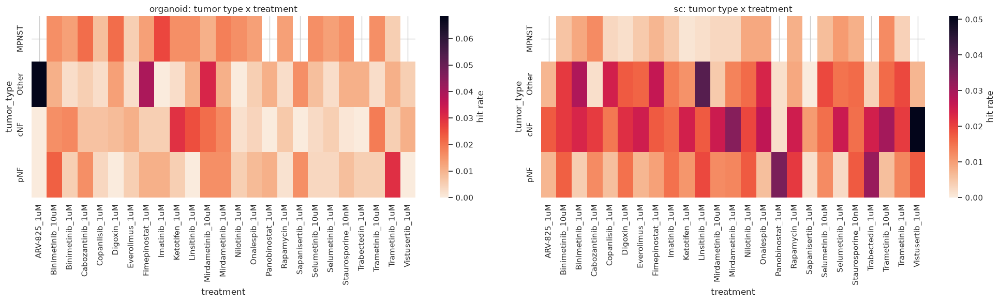

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(20, 6))
for ax, p in zip(axes, main_profiles):
    m = trt[p].pivot_table(
        index="tumor_type", columns="treatment", values="hit", aggfunc="mean"
    )
    sns.heatmap(m, ax=ax, cmap="rocket_r", cbar_kws={"label": "hit rate"})
    ax.set_title(f"{p}: tumor type x treatment")
plt.tight_layout()
savefig(fig, "16_tumor_type_by_treatment")

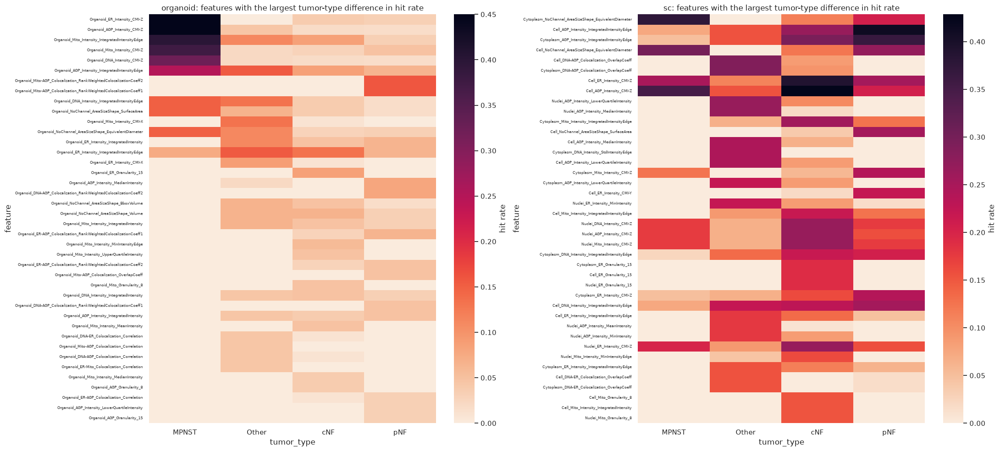

In [ ]:
# features that discriminate tumor types: hit rate per tumor type, keep the most variable
tt_rows = []
fig, axes = plt.subplots(1, 2, figsize=(22, 10))
for ax, p in zip(axes, main_profiles):
    m = trt[p].pivot_table(
        index="feature", columns="tumor_type", values="hit", aggfunc="mean"
    )
    m["range"] = m.max(axis=1) - m.min(axis=1)
    top = m.sort_values("range", ascending=False).head(40)
    tt_rows.append(top.assign(profile=p).reset_index())
    sns.heatmap(
        top.drop(columns="range"),
        ax=ax,
        cmap="rocket_r",
        cbar_kws={"label": "hit rate"},
        yticklabels=True,
    )
    ax.tick_params(axis="y", labelsize=6)
    ax.set_title(f"{p}: features with the largest tumor-type difference in hit rate")
plt.tight_layout()
savefig(fig, "16_tumor_type_discriminating_features")
pd.concat(tt_rows).to_parquet(
    results_path / "tumor_type_discriminating_features.parquet", index=False
)

## 17. Feature modules: are the hit features redundant?

*Hundreds of morphology features are highly correlated. Clustering hit
features by their coefficient profile across patient x treatment groups
shows how many independent "modules" of biology sit in the hits.*

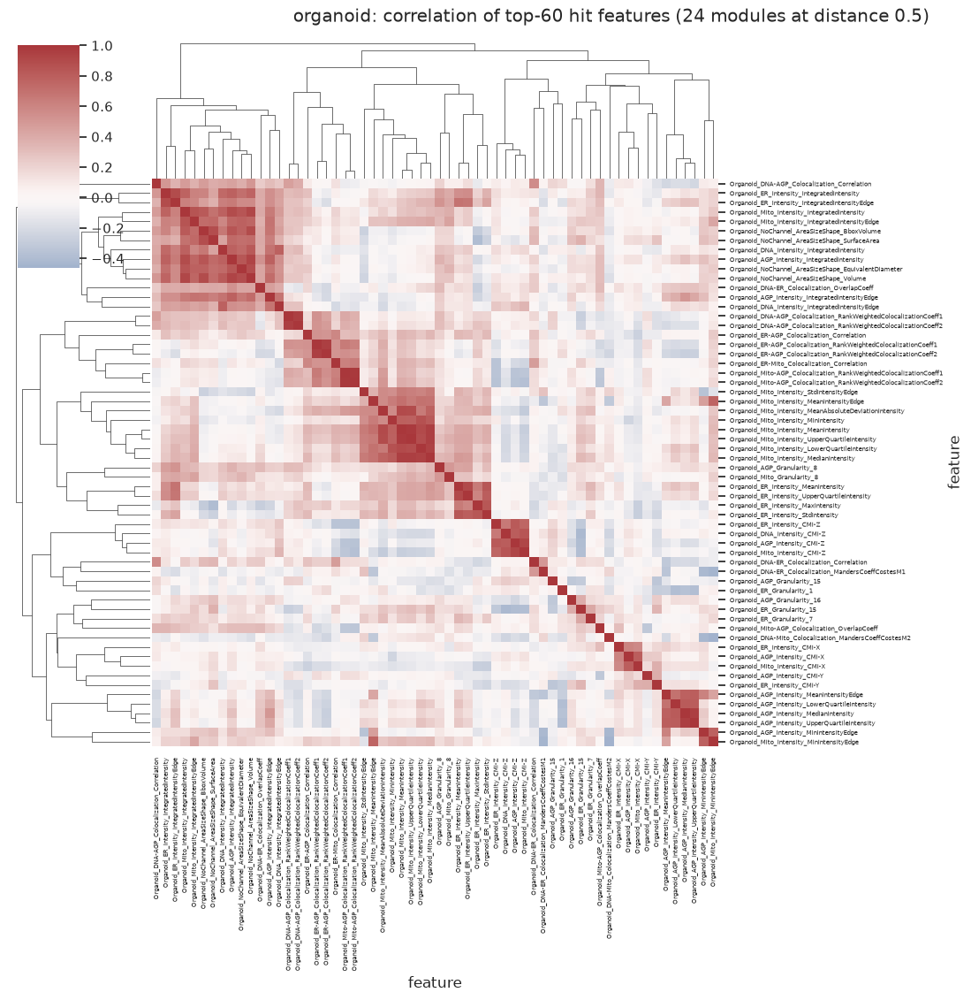

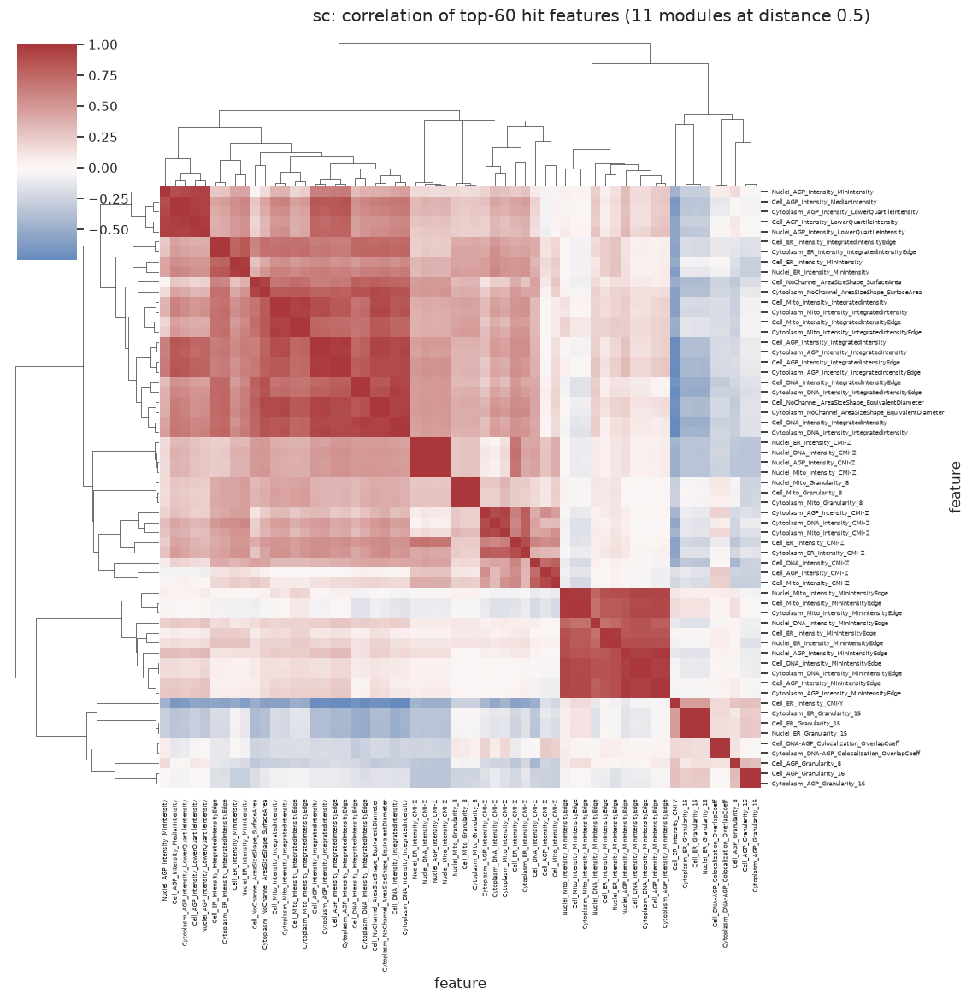

In [ ]:
module_tables = []
for p in main_profiles:
    hit_feats = trt[p].loc[trt[p]["hit"]].groupby("feature").size().nlargest(60).index
    m = (
        trt[p]
        .loc[trt[p]["feature"].isin(hit_feats)]
        .pivot_table(
            index="feature", columns=["patient", "treatment"], values="coefficient"
        )
        .fillna(0)
    )
    corr = m.T.corr()
    link = linkage(m.values, method="average", metric="correlation")
    clusters = fcluster(link, t=0.5, criterion="distance")
    module_tables.append(
        pd.DataFrame({"profile": p, "feature": m.index, "module": clusters})
    )
    cg = sns.clustermap(
        corr,
        cmap="vlag",
        center=0,
        figsize=(14, 14),
        xticklabels=True,
        yticklabels=True,
    )
    cg.ax_heatmap.tick_params(labelsize=5)
    cg.fig.suptitle(
        f"{p}: correlation of top-60 hit features ({clusters.max()} modules at distance 0.5)",
        y=1.01,
    )
    savefig(cg.figure, f"17_feature_module_clustermap_{p}")
pd.concat(module_tables).to_parquet(
    results_path / "feature_modules.parquet", index=False
)

## 18. The needles

Each hit row is scored on independent lines of evidence:

* **technical-robust** -- still a hit when spatial covariates are added
* **count-safe** -- treatment explains more variance than any count term
  (reported, but *not* in the score: counts may be part of the phenotype, see 19)
* **agg-supported** -- significant, same sign in the aggregated profile
* **dose-consistent** -- same sign at another dose of the same drug

Rows are then summarized per (treatment, feature):

`needle_score = n_patients_hit * sign_concordance * mean_robustness * mean_|coef|`

(robustness = mean of technical-robust, agg-supported, dose-consistent). This score
favours *replicated* effects; sections 20-21 rank the other kinds of interesting.

In [ ]:
def build_needles(p):
    d = trt[p].copy()
    agg_key = {"organoid": "organoid_agg", "sc": "sc_agg"}.get(p)
    # agg-supported
    if agg_key:
        a = trt[agg_key][model_keys + ["sig", "coefficient"]].rename(
            columns={"sig": "agg_sig", "coefficient": "agg_coef"}
        )
        d = d.merge(a, on=model_keys, how="left")
        supported = d["agg_sig"].fillna(False).astype(bool) & (
            np.sign(d["agg_coef"]) == np.sign(d["coefficient"])
        )
        d["agg_supported"] = supported.astype(float).where(d["agg_sig"].notna())
    else:
        d["agg_supported"] = np.nan
    # dose-consistent
    sgn = (
        d.assign(sgn=np.sign(d["coefficient"]))
        .groupby(["patient", "drug", "feature"])["sgn"]
        .agg(["nunique", "size"])
    )
    sgn["dose_consistent"] = np.where(
        sgn["size"] > 1, (sgn["nunique"] == 1).astype(float), np.nan
    )
    d = d.merge(
        sgn[["dose_consistent"]].reset_index(),
        on=["patient", "drug", "feature"],
        how="left",
    )
    ev = d[["agg_supported", "dose_consistent"]].astype(float)
    d["robustness"] = ev.mean(axis=1)
    hits = d.loc[d["hit"]].copy()
    hits["abs_coef"] = hits["coefficient"].abs()
    return d, hits


needle_rows, all_needles = {}, {}
for p in main_profiles:
    d, hits = build_needles(p)
    needle_rows[p] = hits
    cons = consensus[p].copy()
    rob = (
        hits.groupby(["treatment", "feature"])["robustness"]
        .mean()
        .rename("mean_robustness")
        .reset_index()
    )
    cons = cons.merge(rob, on=["treatment", "feature"], how="left")
    cons["needle_score"] = (
        cons["n_patients_hit"]
        * cons["sign_concordance"].fillna(0)
        * cons["mean_robustness"].fillna(0)
        * cons["mean_abs_coef"]
    )
    cons = cons.sort_values("needle_score", ascending=False)
    cons["profile"] = p
    all_needles[p] = cons
    cons.to_parquet(results_path / f"needles_{p}.parquet", index=False)
    hits.to_parquet(results_path / f"hit_rows_with_evidence_{p}.parquet", index=False)
    print(f"{p}: {(cons['needle_score'] > 0).sum():,} scored needles")
all_needles["organoid"].head(25)

organoid: 146 scored needles
sc: 526 scored needles


,treatment,drug,therapeutic_category,feature,n_patients_tested,n_patients_hit,n_pos,n_neg,mean_coef,mean_abs_coef,median_treatment_pct,sign_concordance,mean_robustness,needle_score,profile
354,Binimetinib_10uM,Binimetinib,Kinase Inhibitor,Organoid_Mito_Granularity_8,12,1,1,0,0.964801,2.480820,1.057755,1.00,0.500000,1.240410,organoid
2444,Mirdametinib_1uM,Mirdametinib,Kinase Inhibitor,Organoid_Mito_Granularity_8,12,1,1,0,1.149657,2.393333,1.354738,1.00,0.500000,1.196667,organoid
535,Binimetinib_1uM,Binimetinib,Kinase Inhibitor,Organoid_Mito_Granularity_14,12,1,1,0,0.664029,2.197943,2.570328,1.00,0.500000,1.098972,organoid
394,Binimetinib_1uM,Binimetinib,Kinase Inhibitor,Organoid_AGP_Granularity_8,12,1,1,0,0.585210,2.143777,1.305179,1.00,0.500000,1.071888,organoid
3724,Selumetinib_1uM,Selumetinib,Kinase Inhibitor,Organoid_ER_Granularity_15,12,1,0,1,-0.588854,1.934645,1.634735,1.00,0.500000,0.967323,organoid
3534,Selumetinib_10uM,Selumetinib,Kinase Inhibitor,Organoid_ER_Granularity_15,12,1,0,1,-0.896904,1.921774,0.995528,1.00,0.500000,0.960887,organoid
544,Binimetinib_1uM,Binimetinib,Kinase Inhibitor,Organoid_Mito_Granularity_8,12,1,1,0,0.437964,1.607569,0.639616,1.00,0.500000,0.803785,organoid
4517,Trametinib_1uM,Trametinib,Kinase Inhibitor,Organoid_Mito-AGP_Colocalization_OverlapCoeff,12,1,1,0,0.607499,1.574880,0.842673,1.00,0.500000,0.787440,organoid
2259,Mirdametinib_10uM,Mirdametinib,Kinase Inhibitor,Organoid_Mito_Intensity_IntegratedIntensity,12,3,3,0,0.620693,0.772656,0.552081,1.00,0.333333,0.772656,organoid
3467,Selumetinib_10uM,Selumetinib,Kinase Inhibitor,Organoid_DNA-ER_Colocalization_OverlapCoeff,12,1,1,0,-0.065261,1.513201,0.457980,1.00,0.500000,0.756601,organoid


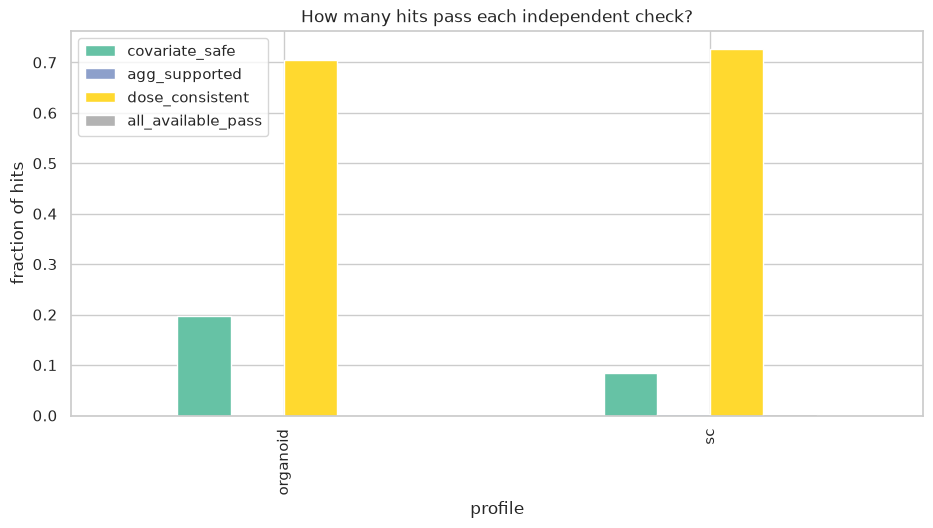

,covariate_safe,agg_supported,dose_consistent,all_available_pass
profile,,,,
organoid,0.196850,0.0000,0.704846,0.0000
sc,0.084489,0.0026,0.726872,0.0026


In [ ]:
# evidence overview: what fraction of hits pass each line of evidence?
ev_rows = []
for p in main_profiles:
    h = needle_rows[p]
    ev_rows.append(
        {
            "profile": p,
            "covariate_safe": h["covariate_safe"].astype(float).mean(),
            "agg_supported": h["agg_supported"].astype(float).mean(),
            "dose_consistent": h["dose_consistent"].astype(float).mean(),
            "all_available_pass": (h["robustness"] == 1).mean(),
        }
    )
ev = pd.DataFrame(ev_rows).set_index("profile")
ev.reset_index().to_parquet(results_path / "evidence_pass_rates.parquet", index=False)
ax = ev.plot.bar(figsize=(11, 5), colormap="Set2")
ax.set_ylabel("fraction of hits")
ax.set_title("How many hits pass each independent check?")
savefig(ax.figure, "18_evidence_pass_rates")
ev

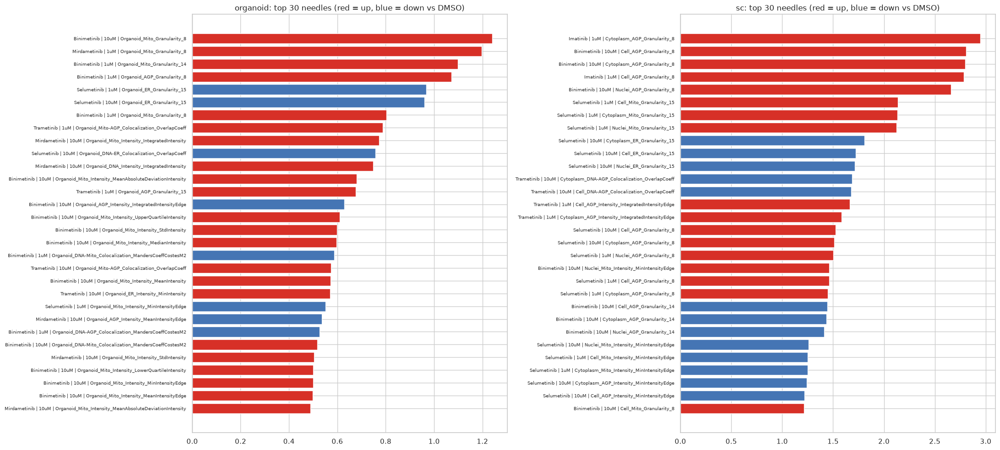

In [ ]:
# top needles overall
fig, axes = plt.subplots(1, 2, figsize=(22, 10))
for ax, p in zip(axes, main_profiles):
    top = all_needles[p].head(30).copy()
    top["label"] = (
        top["drug"]
        + " | "
        + top["treatment"].str.rsplit("_", n=1).str[-1]
        + " | "
        + top["feature"]
    )
    ax.barh(
        top["label"][::-1],
        top["needle_score"][::-1],
        color=np.where(top["mean_coef"][::-1] > 0, "#d73027", "#4575b4"),
    )
    ax.set_title(f"{p}: top 30 needles (red = up, blue = down vs DMSO)")
    ax.tick_params(axis="y", labelsize=7)
plt.tight_layout()
savefig(fig, "18_top_needles")

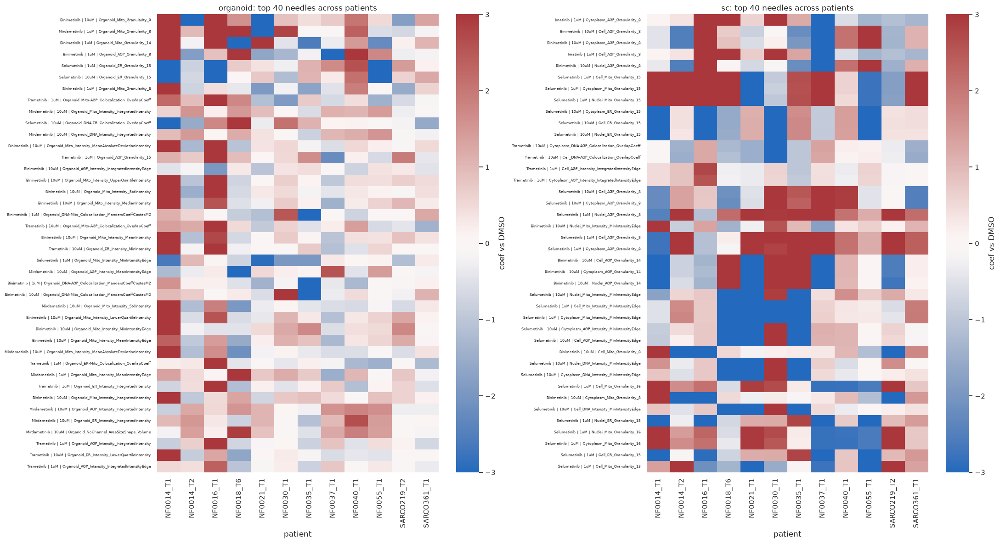

In [ ]:
# the top needles across every patient: is the effect visible everywhere?
fig, axes = plt.subplots(1, 2, figsize=(22, 12))
for ax, p in zip(axes, main_profiles):
    top = all_needles[p].head(40)
    keys = list(zip(top["treatment"], top["feature"]))
    d = trt[p].set_index(["treatment", "feature"])
    d = d.loc[d.index.isin(keys)].reset_index()
    d["row"] = (
        d["drug"]
        + " | "
        + d["treatment"].str.rsplit("_", n=1).str[-1]
        + " | "
        + d["feature"]
    )
    m = d.pivot_table(index="row", columns="patient", values="coefficient").reindex(
        columns=all_patients
    )
    order = [
        f"{r['drug']} | {r['treatment'].rsplit('_', 1)[-1]} | {r['feature']}"
        for _, r in top.iterrows()
    ]
    m = m.reindex([o for o in order if o in m.index])
    sns.heatmap(
        m,
        ax=ax,
        cmap="vlag",
        center=0,
        vmin=-3,
        vmax=3,
        yticklabels=True,
        cbar_kws={"label": "coef vs DMSO"},
    )
    ax.tick_params(axis="y", labelsize=6)
    ax.set_ylabel("")
    ax.set_title(f"{p}: top 40 needles across patients")
plt.tight_layout()
savefig(fig, "18_top_needles_across_patients")

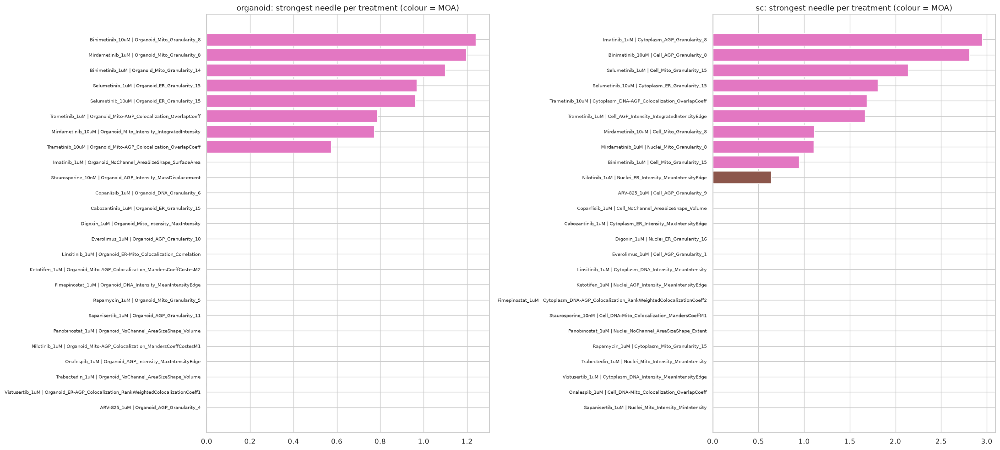

In [ ]:
# the best feature for every treatment
fig, axes = plt.subplots(1, 2, figsize=(22, 10))
best_tables = []
for ax, p in zip(axes, main_profiles):
    best = (
        all_needles[p]
        .sort_values("needle_score", ascending=False)
        .drop_duplicates("treatment")
        .copy()
    )
    best_tables.append(best)
    best["label"] = best["treatment"] + " | " + best["feature"]
    best = best.sort_values("needle_score")
    ax.barh(
        best["label"],
        best["needle_score"],
        color=best["therapeutic_category"].map(moa_palette).fillna("grey"),
    )
    ax.tick_params(axis="y", labelsize=7)
    ax.set_title(f"{p}: strongest needle per treatment (colour = MOA)")
plt.tight_layout()
savefig(fig, "18_best_needle_per_treatment")
pd.concat(best_tables).to_parquet(
    results_path / "best_needle_per_treatment.parquet", index=False
)

In [ ]:
# MOA-level needles: features hit by several drugs of the same MOA
moa_rows = []
for p in main_profiles:
    h = needle_rows[p]
    g = (
        h.groupby(["therapeutic_category", "feature"])
        .agg(
            n_drugs=("drug", "nunique"),
            n_patients=("patient", "nunique"),
            mean_coef=("coefficient", "mean"),
            n_hits=("hit", "size"),
        )
        .reset_index()
    )
    tot_drugs = (
        trt[p].groupby("therapeutic_category")["drug"].nunique().rename("moa_drugs")
    )
    g = g.merge(tot_drugs.reset_index(), on="therapeutic_category")
    g["frac_moa_drugs_hit"] = g["n_drugs"] / g["moa_drugs"]
    g["profile"] = p
    moa_rows.append(g)
moa_needles = pd.concat(moa_rows)
moa_needles.to_parquet(results_path / "moa_needles.parquet", index=False)
moa_needles.loc[(moa_needles["moa_drugs"] > 1)].sort_values(
    ["frac_moa_drugs_hit", "n_patients"], ascending=False
).head(25)

,therapeutic_category,feature,n_drugs,n_patients,mean_coef,n_hits,moa_drugs,frac_moa_drugs_hit,profile
425,Kinase Inhibitor,Cell_ER_Intensity_CMI-Z,9,11,0.008714,43,9,1.000000,sc
395,Kinase Inhibitor,Cell_AGP_Intensity_IntegratedIntensityEdge,9,10,-0.027838,39,9,1.000000,sc
445,Kinase Inhibitor,Cell_Mito_Intensity_CMI-Z,9,10,0.007615,35,9,1.000000,sc
470,Kinase Inhibitor,Cytoplasm_AGP_Intensity_IntegratedIntensityEdge,9,10,-0.061426,39,9,1.000000,sc
288,Investigational,Cell_ER_Intensity_CMI-Z,6,9,0.062226,17,6,1.000000,sc
413,Kinase Inhibitor,Cell_DNA_Intensity_IntegratedIntensityEdge,9,8,0.275922,33,9,1.000000,sc
503,Kinase Inhibitor,Cytoplasm_ER_Intensity_CMI-Z,9,8,0.057707,22,9,1.000000,sc
548,Kinase Inhibitor,Nuclei_AGP_Intensity_CMI-Z,9,8,0.024152,26,9,1.000000,sc
564,Kinase Inhibitor,Nuclei_DNA_Intensity_CMI-Z,9,8,0.082639,24,9,1.000000,sc
573,Kinase Inhibitor,Nuclei_ER_Intensity_CMI-Z,9,8,0.043043,27,9,1.000000,sc


In [ ]:
# patient-private needles: strong, robust hits that occur in exactly one patient.
# these may be patient-specific biology (or noise -- inspect before believing).
private_rows = []
for p in main_profiles:
    c = all_needles[p]
    private = c.loc[(c["n_patients_hit"] == 1) & (c["mean_robustness"] >= 0.75)].copy()
    h = needle_rows[p][["treatment", "feature", "patient", "rsquared", "abs_coef"]]
    private = private.merge(h, on=["treatment", "feature"], how="left")
    private["profile"] = p
    private_rows.append(private.sort_values("abs_coef", ascending=False).head(50))
private_needles = pd.concat(private_rows)
private_needles.to_parquet(
    results_path / "patient_private_needles.parquet", index=False
)
private_needles.groupby("profile").head(10)[
    [
        "profile",
        "patient",
        "treatment",
        "feature",
        "mean_coef",
        "rsquared",
        "mean_robustness",
    ]
]

,profile,patient,treatment,feature,mean_coef,rsquared,mean_robustness
2,sc,NF0016_T1,Binimetinib_10uM,Cytoplasm_AGP_Granularity_8,0.387927,0.559060,1.0
1,sc,NF0016_T1,Binimetinib_10uM,Cell_AGP_Granularity_8,0.325689,0.555777,1.0
4,sc,NF0016_T1,Binimetinib_10uM,Nuclei_AGP_Granularity_8,0.259451,0.516619,1.0
0,sc,NF0016_T1,Imatinib_1uM,Cytoplasm_AGP_Granularity_8,0.795302,0.520828,1.0
3,sc,NF0016_T1,Imatinib_1uM,Cell_AGP_Granularity_8,0.630761,0.516809,1.0
5,sc,NF0035_T1,Nilotinib_1uM,Nuclei_ER_Intensity_MeanIntensityEdge,0.144866,0.523177,1.0


In [ ]:
# summary: a compact story of the haystack
summary = []
for p in main_profiles:
    c = all_needles[p]
    summary.append(
        {
            "profile": p,
            "models": len(trt[p]),
            "hits": int(trt[p]["hit"].sum()),
            "(treatment,feature) pairs with >=1 hit": int(
                (c["n_patients_hit"] >= 1).sum()
            ),
            "... hit in >=2 patients": int((c["n_patients_hit"] >= 2).sum()),
            "... >=3 patients & >=80% concordant": int(
                ((c["n_patients_hit"] >= 3) & (c["sign_concordance"] >= 0.8)).sum()
            ),
            "... and mean robustness >= 0.75": int(
                (
                    (c["n_patients_hit"] >= 3)
                    & (c["sign_concordance"] >= 0.8)
                    & (c["mean_robustness"] >= 0.75)
                ).sum()
            ),
        }
    )
summary = pd.DataFrame(summary)
summary.to_parquet(results_path / "haystack_summary.parquet", index=False)
summary.T

,0,1
profile,organoid,sc
models,48070,144210
hits,508,2308
"(treatment,feature) pairs with >=1 hit",426,1667
... hit in >=2 patients,64,406
... >=3 patients & >=80% concordant,6,50
... and mean robustness >= 0.75,0,0


## 19. Counts, both ways

Whether a count change is a nuisance or a phenotype is undecided, so both
views are shown. **Adjusted view**: hits where treatment beats every count
covariate (`covariate_safe`). **Count-linked view**: hits where a count term
explains as much or more variance. A treatment that kills organoids will
show up in the second group and may be biologically the most interesting.
(The effect of treatment *on* the counts is not in the saved results; that
needs a separate model of well-level counts.)

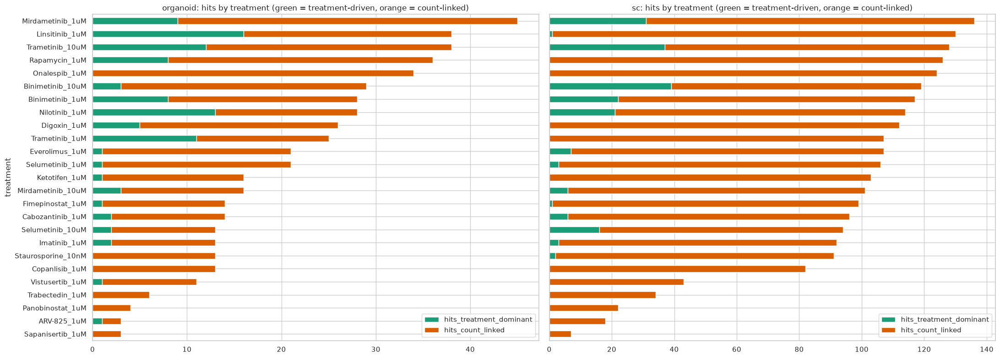

In [ ]:
count_view = []
fig, axes = plt.subplots(1, 2, figsize=(22, 8), sharey=True)
for ax, p in zip(axes, main_profiles):
    d = trt[p]
    h = d.loc[d["hit"]]
    tab = pd.DataFrame(
        {
            "hits": h.groupby("treatment").size(),
            "hits_treatment_dominant": h.groupby("treatment")["covariate_safe"].sum(),
            "median_treatment_share_pct": d.groupby("treatment")[
                "term_pct_of_total_var"
            ].median(),
            "median_covariate_share_pct": d.groupby("treatment")[
                "covariate_max_pct"
            ].median(),
        }
    ).reindex(all_treatments)
    tab[["hits", "hits_treatment_dominant"]] = tab[
        ["hits", "hits_treatment_dominant"]
    ].fillna(0)
    tab["hits_count_linked"] = tab["hits"] - tab["hits_treatment_dominant"]
    tab["profile"] = p
    count_view.append(tab.reset_index())
    tab.sort_values("hits")[["hits_treatment_dominant", "hits_count_linked"]].plot.barh(
        stacked=True, ax=ax, color=["#1b9e77", "#d95f02"]
    )
    ax.set_title(
        f"{p}: hits by treatment (green = treatment-driven, orange = count-linked)"
    )
plt.tight_layout()
savefig(fig, "19_hits_treatment_vs_count_linked")
count_view = pd.concat(count_view)
count_view.to_parquet(results_path / "count_view_by_treatment.parquet", index=False)

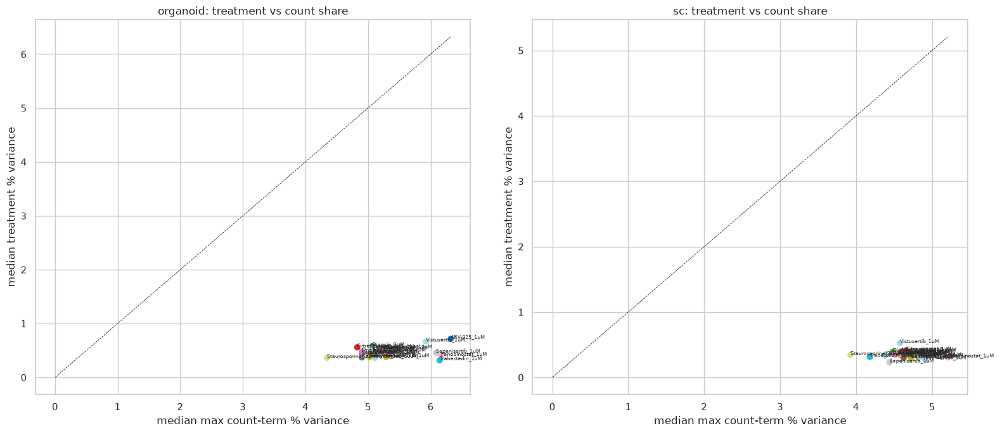

In [ ]:
# treatment vs count share of variance, per (patient, treatment) -- points above
# the diagonal are treatments whose count effect exceeds their morphology effect
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, p in zip(axes, main_profiles):
    pt = (
        trt[p]
        .groupby(["treatment", "drug"])
        .agg(
            treatment_share=("term_pct_of_total_var", "median"),
            covariate_share=("covariate_max_pct", "median"),
        )
        .reset_index()
    )
    ax.scatter(
        pt["covariate_share"],
        pt["treatment_share"],
        c=pt["drug"].astype("category").cat.codes,
        cmap="tab20",
    )
    lim = max(pt["covariate_share"].max(), pt["treatment_share"].max())
    ax.plot([0, lim], [0, lim], "k--", lw=0.6)
    for _, r in pt.iterrows():
        ax.annotate(
            r["treatment"], (r["covariate_share"], r["treatment_share"]), fontsize=6
        )
    ax.set_xlabel("median max count-term % variance")
    ax.set_ylabel("median treatment % variance")
    ax.set_title(f"{p}: treatment vs count share")
plt.tight_layout()
savefig(fig, "19_treatment_vs_covariate_share")

In [ ]:
# features whose hits are mostly count-linked (candidate "object number" readouts)
feat_count = []
for p in main_profiles:
    h = trt[p].loc[trt[p]["hit"]]
    fc = (
        h.groupby("feature")["covariate_safe"]
        .agg(n_hits="size", frac_treatment_driven="mean")
        .reset_index()
    )
    feat_count.append(fc.assign(profile=p))
feat_count = pd.concat(feat_count)
feat_count.to_parquet(results_path / "feature_count_linkage.parquet", index=False)
feat_count.loc[feat_count["n_hits"] >= 3].sort_values("frac_treatment_driven").head(15)

,feature,n_hits,frac_treatment_driven,profile
5,Organoid_AGP_Intensity_CMI-Z,23,0.0,organoid
13,Organoid_AGP_Intensity_MinIntensityEdge,4,0.0,organoid
33,Organoid_DNA_Intensity_IntegratedIntensity,9,0.0,organoid
34,Organoid_DNA_Intensity_IntegratedIntensityEdge,17,0.0,organoid
32,Organoid_DNA_Intensity_CMI-Z,17,0.0,organoid
24,Organoid_DNA-ER_Colocalization_OverlapCoeff,3,0.0,organoid
21,Organoid_DNA-AGP_Colocalization_RankWeightedCo...,5,0.0,organoid
20,Organoid_DNA-AGP_Colocalization_RankWeightedCo...,3,0.0,organoid
54,Organoid_ER_Intensity_IntegratedIntensityEdge,28,0.0,organoid
53,Organoid_ER_Intensity_IntegratedIntensity,14,0.0,organoid


## 20. Tumor-type specificity

*For each (treatment, feature): does the coefficient differ between
tumor types (Kruskal-Wallis on per-patient coefficients)? Which tumor type
is the outlier, and is the hit confined to it?* With 2-5 patients per tumor
type the tests are underpowered, so the effect (`delta`) and the hit-based
specificity flag matter more than the p-value.

In [ ]:
def tumor_type_specificity(df):
    rows = []
    for (trtm, feat), g in df.groupby(["treatment", "feature"]):
        tt = g["tumor_type"].to_numpy(dtype=object)
        coef = g["coefficient"].to_numpy()
        hit = g["hit"].to_numpy()
        types = np.unique(tt)
        if len(types) < 2:
            continue
        try:
            pval = kruskal(*[coef[tt == t] for t in types])[1]
        except ValueError:  # every coefficient identical
            pval = np.nan
        best, best_delta = None, 0.0
        for t in types:
            delta = coef[tt == t].mean() - coef[tt != t].mean()
            if abs(delta) >= abs(best_delta):
                best, best_delta = t, delta
        inside, outside = tt == best, tt != best
        rows.append(
            {
                "treatment": trtm,
                "feature": feat,
                "drug": g["drug"].iloc[0],
                "therapeutic_category": g["therapeutic_category"].iloc[0],
                "best_tumor_type": best,
                "n_patients_in_type": int(inside.sum()),
                "delta": best_delta,
                "mean_coef_in_type": coef[inside].mean(),
                "hit_frac_in_type": hit[inside].mean(),
                "hit_frac_elsewhere": hit[outside].mean(),
                "kruskal_p": pval,
            }
        )
    out = pd.DataFrame(rows)
    ok = out["kruskal_p"].notna()
    out["kruskal_fdr"] = np.nan
    out.loc[ok, "kruskal_fdr"] = multipletests(
        out.loc[ok, "kruskal_p"], method="fdr_bh"
    )[1]
    out["tumor_type_specific"] = (
        (out["n_patients_in_type"] >= 2)
        & (out["hit_frac_in_type"] >= 0.5)
        & (out["hit_frac_elsewhere"] == 0)
    )
    return out


tumor_specific = {p: tumor_type_specificity(trt[p]) for p in main_profiles}
for p, t in tumor_specific.items():
    t.to_parquet(results_path / f"tumor_type_specific_{p}.parquet", index=False)
    print(
        f"{p}: {int(t['tumor_type_specific'].sum())} tumor-type-specific pairs; {(t['kruskal_fdr'] < 0.05).sum()} with Kruskal FDR<0.05"
    )

organoid: 50 tumor-type-specific pairs; 0 with Kruskal FDR<0.05
sc: 102 tumor-type-specific pairs; 0 with Kruskal FDR<0.05


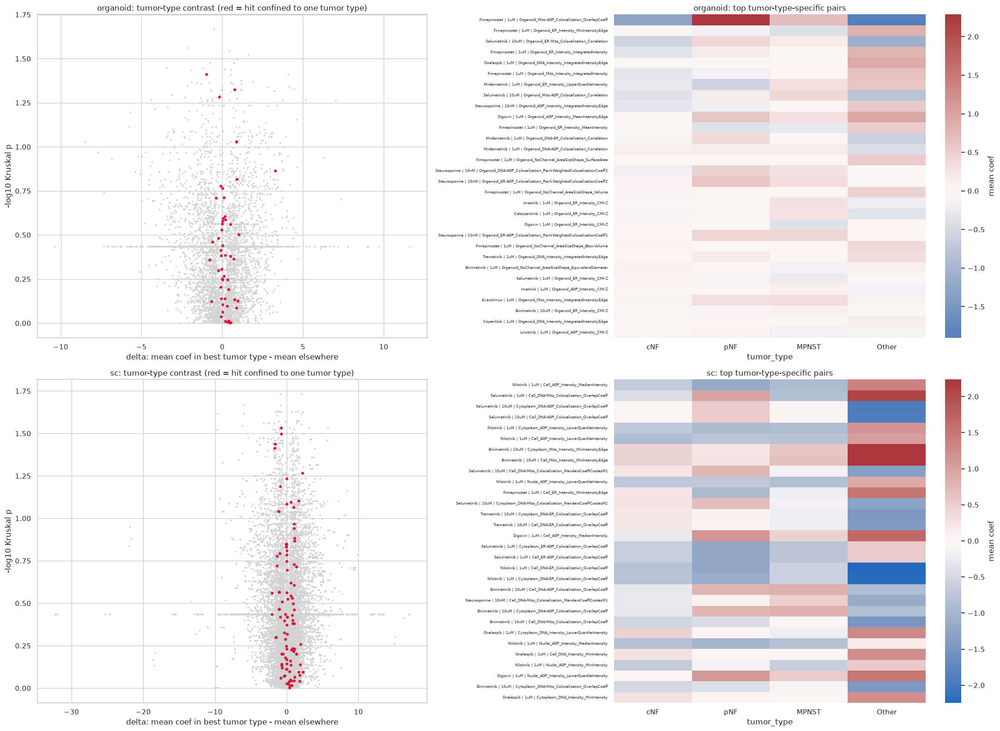

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(22, 16))
for i, p in enumerate(main_profiles):
    t = tumor_specific[p]
    axes[i, 0].scatter(
        t["delta"],
        -np.log10(t["kruskal_p"].clip(lower=1e-12)),
        s=3,
        c="lightgrey",
        rasterized=True,
    )
    sp = t.loc[t["tumor_type_specific"]]
    axes[i, 0].scatter(
        sp["delta"], -np.log10(sp["kruskal_p"].clip(lower=1e-12)), s=12, c="crimson"
    )
    axes[i, 0].set_xlabel("delta: mean coef in best tumor type - mean elsewhere")
    axes[i, 0].set_ylabel("-log10 Kruskal p")
    axes[i, 0].set_title(
        f"{p}: tumor-type contrast (red = hit confined to one tumor type)"
    )
    top = sp.reindex(sp["delta"].abs().sort_values(ascending=False).index).head(30)
    if len(top):
        d = trt[p].set_index(["treatment", "feature"])
        rows = []
        for _, r in top.iterrows():
            g = d.loc[(r["treatment"], r["feature"])]
            m = g.groupby("tumor_type")["coefficient"].mean()
            m.name = (
                f"{r['drug']} | {r['treatment'].rsplit('_', 1)[-1]} | {r['feature']}"
            )
            rows.append(m)
        heat = pd.DataFrame(rows).reindex(columns=["cNF", "pNF", "MPNST", "Other"])
        sns.heatmap(
            heat,
            ax=axes[i, 1],
            cmap="vlag",
            center=0,
            yticklabels=True,
            cbar_kws={"label": "mean coef"},
        )
        axes[i, 1].tick_params(axis="y", labelsize=6)
    axes[i, 1].set_title(f"{p}: top tumor-type-specific pairs")
plt.tight_layout()
savefig(fig, "20_tumor_type_specificity")

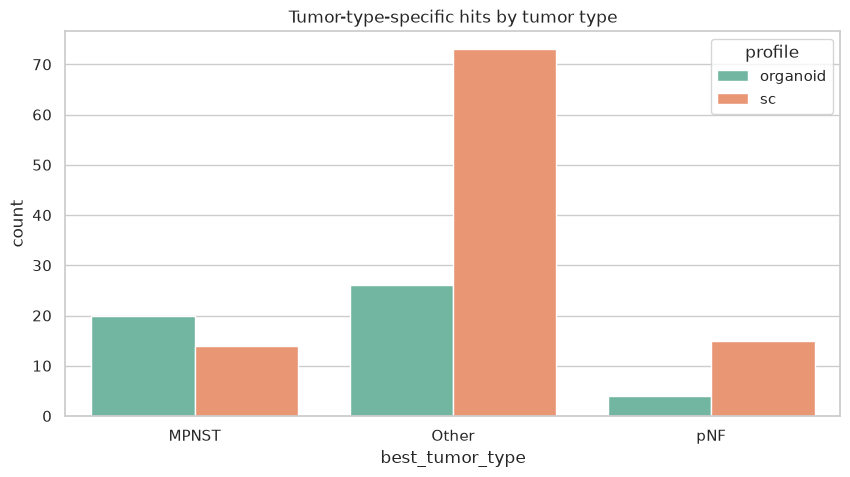

,profile,best_tumor_type,therapeutic_category,n
17,sc,Other,Kinase Inhibitor,40
16,sc,Other,Investigational,24
7,organoid,Other,Investigational,12
4,organoid,MPNST,Kinase Inhibitor,12
8,organoid,Other,Kinase Inhibitor,11
12,sc,MPNST,Kinase Inhibitor,9
19,sc,pNF,Investigational,7
18,sc,pNF,Experimental,6
11,sc,MPNST,Investigational,5
14,sc,Other,Cardiac Glycosides,5


In [ ]:
# which tumor type owns the specific hits, and for which MOA?
ts_all = pd.concat(
    [
        t.loc[t["tumor_type_specific"]].assign(profile=p)
        for p, t in tumor_specific.items()
    ]
)
fig, ax = plt.subplots(figsize=(10, 5))
sns.countplot(
    data=ts_all, x="best_tumor_type", hue="profile", palette=profile_palette, ax=ax
)
ax.set_title("Tumor-type-specific hits by tumor type")
savefig(fig, "20_tumor_type_specific_counts")
ts_all.groupby(["profile", "best_tumor_type", "therapeutic_category"]).size().rename(
    "n"
).reset_index().sort_values("n", ascending=False).head(15)

## 21. Four kinds of "interesting" and the readout shortlist

Each (treatment, feature) pair is flagged separately for each definition:

* **replicated** -- hit in >=3 patients, >=80% same sign
* **tumor-type-specific** -- hit confined to one tumor type (section 20)
* **dose-dependent** -- among patients with a hit at either dose, >=2 patients and >=75% show the same sign with a larger |effect| at the higher dose
* **MOA-consistent** -- feature is hit by >=50% of the (>=2) drugs of that MOA

The shortlist keeps pairs passing at least one and records which. Count
behaviour and technical robustness are carried as columns rather than filters.

In [ ]:
def dose_value(label):
    num = float("".join(c for c in label if c.isdigit() or c == "."))
    return num * (1000 if "uM" in label else 1)


dose_dep = {}
for p in main_profiles:
    d = trt[p]
    multi = d.groupby("drug")["dose"].nunique()
    d = d.loc[d["drug"].isin(multi[multi > 1].index)].assign(
        hit_i=lambda x: x["hit"].astype(int)
    )
    idx = ["patient", "drug", "feature"]
    coefw = d.pivot_table(index=idx, columns="dose", values="coefficient")
    hitw = d.pivot_table(index=idx, columns="dose", values="hit_i", aggfunc="max")
    cols = sorted(coefw.columns, key=dose_value)
    lo, hi = cols[0], cols[-1]
    t = pd.DataFrame(
        {"lo": coefw[lo], "hi": coefw[hi], "any_hit": hitw.max(axis=1) > 0}
    ).dropna(subset=["lo", "hi"])
    t["grows"] = (np.sign(t["lo"]) == np.sign(t["hi"])) & (
        t["hi"].abs() > t["lo"].abs()
    )
    g = (
        t.loc[t["any_hit"]]
        .groupby(level=["drug", "feature"])["grows"]
        .agg(n_patients_hit_any="size", n_grow="sum")
        .reset_index()
    )
    g["frac_grow"] = g["n_grow"] / g["n_patients_hit_any"]
    g["dose_dependent"] = (g["n_patients_hit_any"] >= 2) & (g["frac_grow"] >= 0.75)
    dose_dep[p] = g
    g.to_parquet(results_path / f"dose_dependent_{p}.parquet", index=False)
    print(f"{p}: {int(g['dose_dependent'].sum())} dose-dependent (drug, feature) pairs")

organoid: 3 dose-dependent (drug, feature) pairs
sc: 8 dose-dependent (drug, feature) pairs


In [ ]:
shortlists = []
for p in main_profiles:
    base = all_needles[p].loc[all_needles[p]["n_patients_hit"] >= 1].copy()
    base["replicated"] = (base["n_patients_hit"] >= 3) & (
        base["sign_concordance"] >= 0.8
    )
    ts = tumor_specific[p][
        ["treatment", "feature", "best_tumor_type", "tumor_type_specific"]
    ]
    base = base.merge(ts, on=["treatment", "feature"], how="left")
    dd = dose_dep[p][["drug", "feature", "dose_dependent"]]
    base = base.merge(dd, on=["drug", "feature"], how="left")
    mo = moa_needles.loc[
        (moa_needles["profile"] == p) & (moa_needles["moa_drugs"] > 1)
    ].copy()
    mo["moa_consistent"] = (mo["n_drugs"] >= 2) & (mo["frac_moa_drugs_hit"] >= 0.5)
    base = base.merge(
        mo[["therapeutic_category", "feature", "moa_consistent"]],
        on=["therapeutic_category", "feature"],
        how="left",
    )
    crit = ["replicated", "tumor_type_specific", "dose_dependent", "moa_consistent"]
    for c in crit:
        base[c] = base[c].fillna(False).astype(bool)
    base["n_criteria"] = base[crit].sum(axis=1)
    h = needle_rows[p]
    cs = (
        h.groupby(["treatment", "feature"])
        .agg(frac_covariate_safe=("covariate_safe", "mean"))
        .reset_index()
    )
    base = base.merge(cs, on=["treatment", "feature"], how="left")
    base["profile"] = p
    shortlists.append(
        base.loc[base["n_criteria"] >= 1].sort_values(
            ["n_criteria", "needle_score"], ascending=False
        )
    )
shortlist = pd.concat(shortlists)
shortlist.to_parquet(results_path / "readout_shortlist.parquet", index=False)
crit = ["replicated", "tumor_type_specific", "dose_dependent", "moa_consistent"]
print(
    shortlist.groupby("profile")[crit + ["n_criteria"]].agg(
        {**{c: "sum" for c in crit}, "n_criteria": "size"}
    )
)

          replicated  tumor_type_specific  dose_dependent  moa_consistent  n_criteria
profile                                                                              
organoid           6                   50               4             159         192
sc                50                  102              15            1057        1103


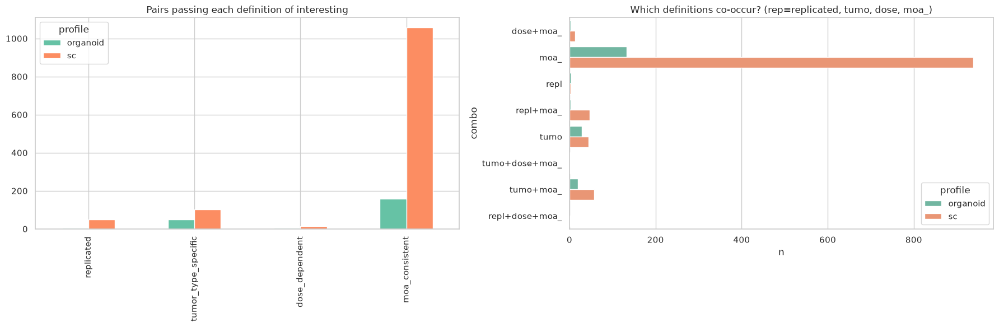

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
counts = shortlist.groupby("profile")[crit].sum().T
counts.plot.bar(ax=axes[0], color=[profile_palette["organoid"], profile_palette["sc"]])
axes[0].set_title("Pairs passing each definition of interesting")
combo = (
    shortlist.assign(
        combo=shortlist[crit].apply(
            lambda r: "+".join(c[:4] for c in crit if r[c]), axis=1
        )
    )
    .groupby(["profile", "combo"])
    .size()
    .rename("n")
    .reset_index()
)
sns.barplot(
    data=combo, y="combo", x="n", hue="profile", palette=profile_palette, ax=axes[1]
)
axes[1].set_title("Which definitions co-occur? (rep=replicated, tumo, dose, moa_)")
plt.tight_layout()
savefig(fig, "21_definitions_of_interesting")

In [ ]:
# the strongest candidates, ranked by how many definitions they pass
shortlist.sort_values(["n_criteria", "needle_score"], ascending=False).head(20)[
    ["profile", "treatment", "feature", "n_criteria"]
    + crit
    + ["n_patients_hit", "best_tumor_type", "frac_covariate_safe"]
]

,profile,treatment,feature,n_criteria,replicated,tumor_type_specific,dose_dependent,moa_consistent,n_patients_hit,best_tumor_type,frac_covariate_safe
297,sc,Binimetinib_10uM,Cell_NoChannel_AreaSizeShape_EquivalentDiameter,3,True,False,True,True,3,pNF,0.0
376,sc,Trametinib_1uM,Nuclei_ER_Intensity_MinIntensity,3,False,True,True,True,1,Other,0.0
123,organoid,Selumetinib_1uM,Organoid_ER_Intensity_CMI-Z,3,False,True,True,True,1,MPNST,0.0
11,sc,Trametinib_10uM,Cytoplasm_DNA-AGP_Colocalization_OverlapCoeff,2,True,False,False,True,3,Other,0.0
12,sc,Trametinib_10uM,Cell_DNA-AGP_Colocalization_OverlapCoeff,2,True,False,False,True,3,Other,0.0
13,sc,Trametinib_1uM,Cell_AGP_Intensity_IntegratedIntensityEdge,2,True,False,False,True,7,pNF,0.0
14,sc,Trametinib_1uM,Cytoplasm_AGP_Intensity_IntegratedIntensityEdge,2,True,False,False,True,7,pNF,0.0
69,sc,Binimetinib_10uM,Cell_AGP_Intensity_IntegratedIntensityEdge,2,True,False,False,True,4,pNF,0.0
78,sc,Selumetinib_10uM,Cell_AGP_Intensity_IntegratedIntensityEdge,2,True,False,False,True,3,Other,0.0
100,sc,Binimetinib_10uM,Cell_Mito_Intensity_MinIntensityEdge,2,False,True,False,True,1,Other,1.0


## 22. Is MOA consistency more than chance?

*Mean treatment signatures are correlated between all pairs of drugs. Is the
average correlation between different drugs of the same MOA higher than
between drugs of different MOAs? Tested by permuting MOA labels over drugs.*

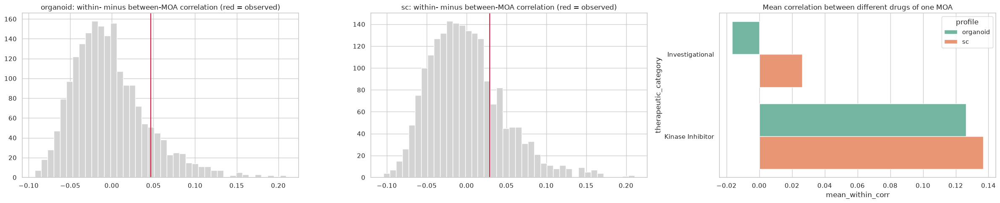

,profile,observed_within_minus_between,perm_mean,p_value
0,organoid,0.046664,-0.002029,0.135432
1,sc,0.028933,-0.000137,0.227886


In [ ]:
moa_test_rows, moa_within_rows, perm_store = [], [], {}
for p in main_profiles:
    mean_sig = trt[p].pivot_table(
        index="feature", columns="treatment", values="coefficient", aggfunc="mean"
    )
    corr = mean_sig.corr()
    meta = (
        trt[p]
        .drop_duplicates("treatment")
        .set_index("treatment")[["drug", "therapeutic_category"]]
        .reindex(corr.index)
    )
    iu = np.triu_indices(len(corr), 1)
    c = corr.values[iu]
    drug_arr = meta["drug"].to_numpy(dtype=object)
    diff_drug = drug_arr[iu[0]] != drug_arr[iu[1]]

    def contrast(moa_arr):
        same = moa_arr[iu[0]] == moa_arr[iu[1]]
        return np.nanmean(c[diff_drug & same]) - np.nanmean(c[diff_drug & ~same])

    moa_arr = meta["therapeutic_category"].to_numpy(dtype=object)
    obs = contrast(moa_arr)
    moa_by_drug = meta.drop_duplicates("drug").set_index("drug")["therapeutic_category"]
    perms = []
    for _ in range(2000):
        shuffled = pd.Series(
            RNG.permutation(moa_by_drug.to_numpy(dtype=object)), index=moa_by_drug.index
        )
        perms.append(contrast(meta["drug"].map(shuffled).to_numpy(dtype=object)))
    perms = np.array(perms)
    perm_store[p] = (obs, perms)
    moa_test_rows.append(
        {
            "profile": p,
            "observed_within_minus_between": obs,
            "perm_mean": perms.mean(),
            "p_value": (1 + (perms >= obs).sum()) / (1 + len(perms)),
        }
    )
    same = moa_arr[iu[0]] == moa_arr[iu[1]]
    for moa in np.unique(moa_arr[iu[0]][same]):
        sel = diff_drug & same & (moa_arr[iu[0]] == moa)
        if sel.sum():
            moa_within_rows.append(
                {
                    "profile": p,
                    "therapeutic_category": moa,
                    "n_pairs": int(sel.sum()),
                    "mean_within_corr": np.nanmean(c[sel]),
                }
            )
moa_test = pd.DataFrame(moa_test_rows)
moa_within = pd.DataFrame(moa_within_rows)
moa_test.to_parquet(results_path / "moa_consistency_test.parquet", index=False)
moa_within.to_parquet(results_path / "moa_within_correlation.parquet", index=False)

fig, axes = plt.subplots(1, 3, figsize=(24, 5))
for ax, p in zip(axes[:2], main_profiles):
    obs, perms = perm_store[p]
    ax.hist(perms, bins=40, color="lightgrey")
    ax.axvline(obs, color="crimson")
    ax.set_title(f"{p}: within- minus between-MOA correlation (red = observed)")
sns.barplot(
    data=moa_within,
    y="therapeutic_category",
    x="mean_within_corr",
    hue="profile",
    palette=profile_palette,
    ax=axes[2],
)
axes[2].set_title("Mean correlation between different drugs of one MOA")
plt.tight_layout()
savefig(fig, "22_moa_consistency_test")
moa_test

## 23. Thirty questions the models can answer

Each question is answered numerically from the saved fit statistics and the
tables built above. The answers are collected in `qa_answers.parquet`.

In [ ]:
qa = []


def answer(n, question, text):
    qa.append({"n": n, "question": question, "answer": text})
    print(f"Q{n}. {question}\n    -> {text}\n")

**Q1. How big is the haystack, and what fraction of models are hits?**

Q1. How big is the haystack, and what fraction of models are hits?
    -> organoid: 48,070 models, 508 hits (1.06%); sc: 144,210 models, 2,308 hits (1.60%)



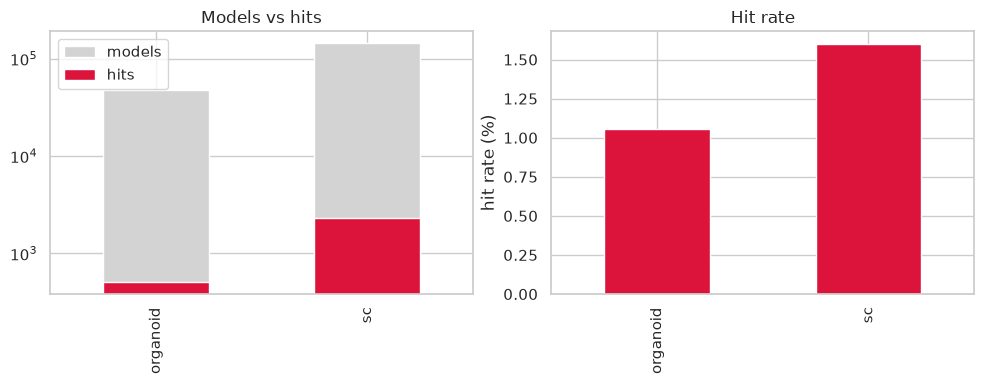

In [ ]:
Q = "How big is the haystack, and what fraction of models are hits?"
r = {p: (len(trt[p]), int(trt[p]["hit"].sum())) for p in main_profiles}
answer(
    1,
    Q,
    "; ".join(
        f"{p}: {n:,} models, {h:,} hits ({h / n:.2%})" for p, (n, h) in r.items()
    ),
)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
pd.Series({p: len(trt[p]) for p in main_profiles}).plot.bar(
    ax=axes[0], color="lightgrey", label="models"
)
pd.Series({p: int(trt[p]["hit"].sum()) for p in main_profiles}).plot.bar(
    ax=axes[0], color="crimson", label="hits"
)
axes[0].set_yscale("log")
axes[0].legend()
axes[0].set_title("Models vs hits")
pd.Series({p: trt[p]["hit"].mean() * 100 for p in main_profiles}).plot.bar(
    ax=axes[1], color="crimson"
)
axes[1].set_ylabel("hit rate (%)")
axes[1].set_title("Hit rate")
plt.tight_layout()
savefig(fig, "23_q01_haystack_size")

**Q2. Which patient has the highest organoid hit rate?**

Q2. Which patient has the highest organoid hit rate?
    -> NF0014_T1 (2.76%); next: SARCO219_T2 (2.61%), NF0040_T1 (1.43%), NF0055_T1 (1.36%)



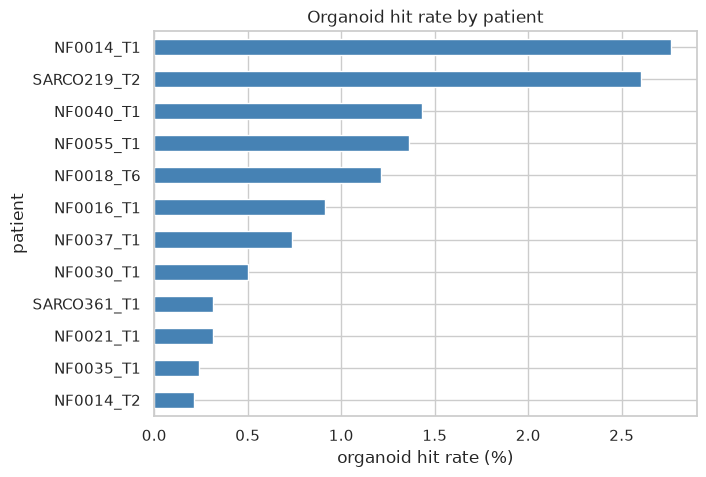

In [ ]:
Q = "Which patient has the highest organoid hit rate?"
r = trt["organoid"].groupby("patient")["hit"].mean().sort_values(ascending=False)
answer(
    2,
    Q,
    f"{r.index[0]} ({r.iloc[0]:.2%}); next: "
    + ", ".join(f"{k} ({v:.2%})" for k, v in r.iloc[1:4].items()),
)
r = trt["organoid"].groupby("patient")["hit"].mean().sort_values() * 100
fig, ax = plt.subplots(figsize=(7, 5))
r.plot.barh(ax=ax, color="steelblue")
ax.set_xlabel("organoid hit rate (%)")
ax.set_title("Organoid hit rate by patient")
savefig(fig, "23_q02_organoid_hit_rate_by_patient")

**Q3. Which patient has the lowest organoid hit rate (least responsive or noisiest)?**

Q3. Which patient has the lowest organoid hit rate (least responsive or noisiest)?
    -> NF0014_T1 (276.32%); median across patients 82.55%



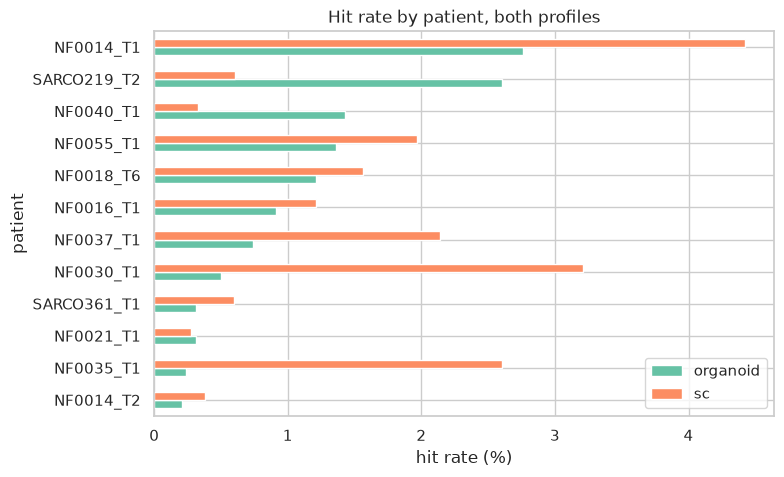

In [ ]:
Q = "Which patient has the lowest organoid hit rate (least responsive or noisiest)?"
answer(
    3, Q, f"{r.index[-1]} ({r.iloc[-1]:.2%}); median across patients {r.median():.2%}"
)
rr = pd.DataFrame(
    {p: trt[p].groupby("patient")["hit"].mean() * 100 for p in main_profiles}
).sort_values("organoid")
fig, ax = plt.subplots(figsize=(8, 5))
rr.plot.barh(ax=ax, color=[profile_palette[p] for p in main_profiles])
ax.set_xlabel("hit rate (%)")
ax.set_title("Hit rate by patient, both profiles")
savefig(fig, "23_q03_hit_rate_by_patient_both")

**Q4. Which treatment produces the most organoid hits?**

Q4. Which treatment produces the most organoid hits?
    -> Mirdametinib_10uM (45), Ketotifen_1uM (38), Binimetinib_10uM (38), Mirdametinib_1uM (36), Linsitinib_1uM (34)



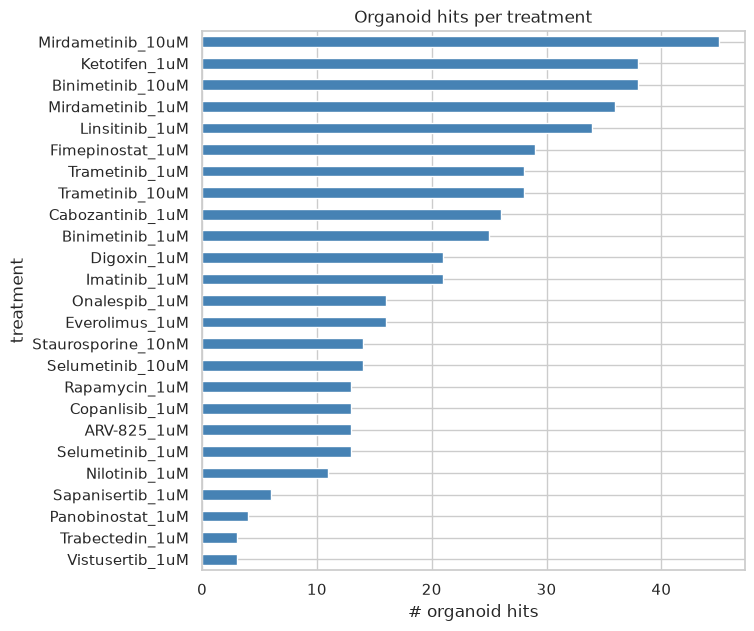

In [ ]:
Q = "Which treatment produces the most organoid hits?"
r = trt["organoid"].groupby("treatment")["hit"].sum().sort_values(ascending=False)
answer(4, Q, ", ".join(f"{k} ({int(v)})" for k, v in r.head(5).items()))
r = trt["organoid"].groupby("treatment")["hit"].sum().sort_values()
fig, ax = plt.subplots(figsize=(7, 7))
r.plot.barh(ax=ax, color="steelblue")
ax.set_xlabel("# organoid hits")
ax.set_title("Organoid hits per treatment")
savefig(fig, "23_q04_organoid_hits_per_treatment")

**Q5. Which treatment produces the most single-cell hits?**

Q5. Which treatment produces the most single-cell hits?
    -> Mirdametinib_1uM (136), Linsitinib_1uM (130), Trametinib_10uM (128), Rapamycin_1uM (126), Onalespib_1uM (124)



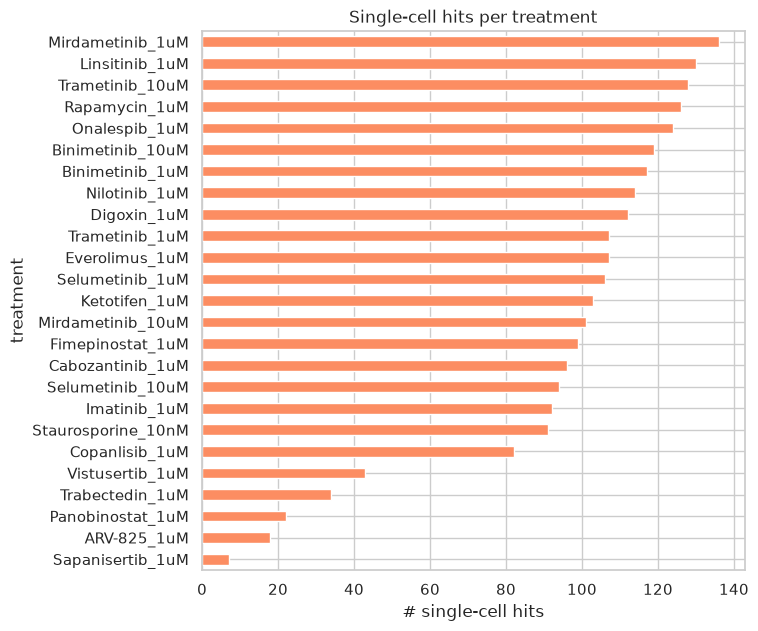

In [ ]:
Q = "Which treatment produces the most single-cell hits?"
r = trt["sc"].groupby("treatment")["hit"].sum().sort_values(ascending=False)
answer(5, Q, ", ".join(f"{k} ({int(v)})" for k, v in r.head(5).items()))
r = trt["sc"].groupby("treatment")["hit"].sum().sort_values()
fig, ax = plt.subplots(figsize=(7, 7))
r.plot.barh(ax=ax, color=profile_palette["sc"])
ax.set_xlabel("# single-cell hits")
ax.set_title("Single-cell hits per treatment")
savefig(fig, "23_q05_sc_hits_per_treatment")

**Q6. Which drugs have no organoid hits at all?**

Q6. Which drugs have no organoid hits at all?
    -> none



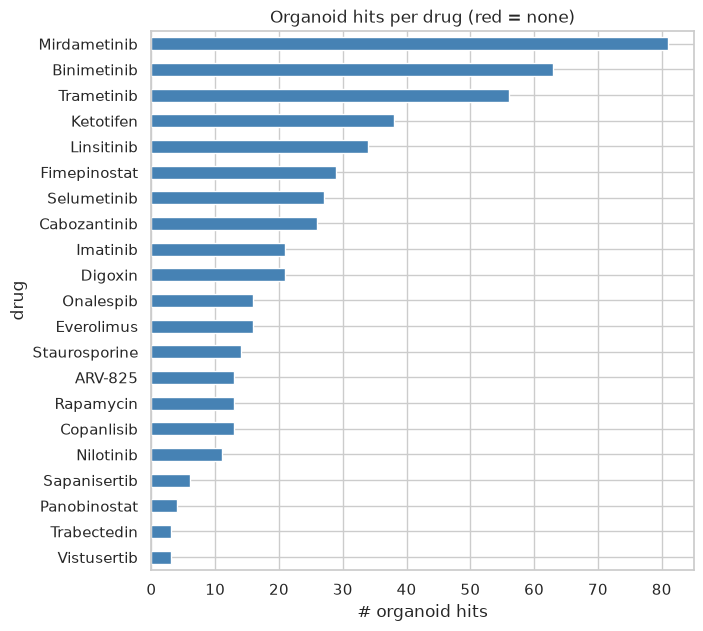

In [ ]:
Q = "Which drugs have no organoid hits at all?"
r = trt["organoid"].groupby("drug")["hit"].sum()
answer(6, Q, ", ".join(r[r == 0].index) or "none")
r = trt["organoid"].groupby("drug")["hit"].sum().sort_values()
fig, ax = plt.subplots(figsize=(7, 7))
r.plot.barh(ax=ax, color=np.where(r == 0, "crimson", "steelblue"))
ax.set_xlabel("# organoid hits")
ax.set_title("Organoid hits per drug (red = none)")
savefig(fig, "23_q06_organoid_hits_per_drug")

**Q7. Which mechanism of action (therapeutic category) has the highest organoid hit rate?**

Q7. Which mechanism of action (therapeutic category) has the highest organoid hit rate?
    -> PROTAC (2.28%), Anti-Allergic Agents (1.67%), Kinase Inhibitor (1.07%), Investigational (0.98%)



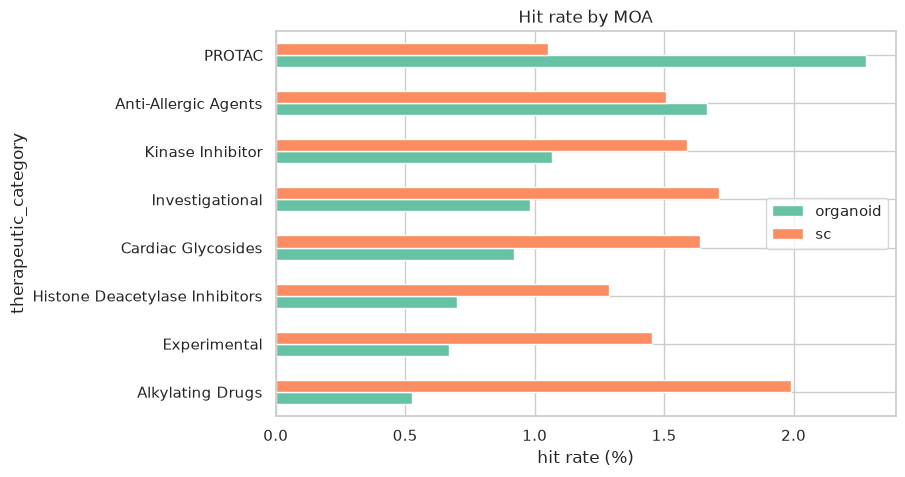

In [ ]:
Q = "Which mechanism of action (therapeutic category) has the highest organoid hit rate?"
r = (
    trt["organoid"]
    .groupby("therapeutic_category")["hit"]
    .mean()
    .sort_values(ascending=False)
)
answer(7, Q, ", ".join(f"{k} ({v:.2%})" for k, v in r.head(4).items()))
r = pd.DataFrame(
    {
        p: trt[p].groupby("therapeutic_category")["hit"].mean() * 100
        for p in main_profiles
    }
).sort_values("organoid")
fig, ax = plt.subplots(figsize=(8, 5))
r.plot.barh(ax=ax, color=[profile_palette[p] for p in main_profiles])
ax.set_xlabel("hit rate (%)")
ax.set_title("Hit rate by MOA")
savefig(fig, "23_q07_hit_rate_by_moa")

**Q8. Which channel is most enriched for organoid hits?**

Q8. Which channel is most enriched for organoid hits?
    -> none (log2 OR 1.87, FDR 4.6e-13), Mito (log2 OR 0.56, FDR 0.00066), ER (log2 OR 0.38, FDR 0.027)



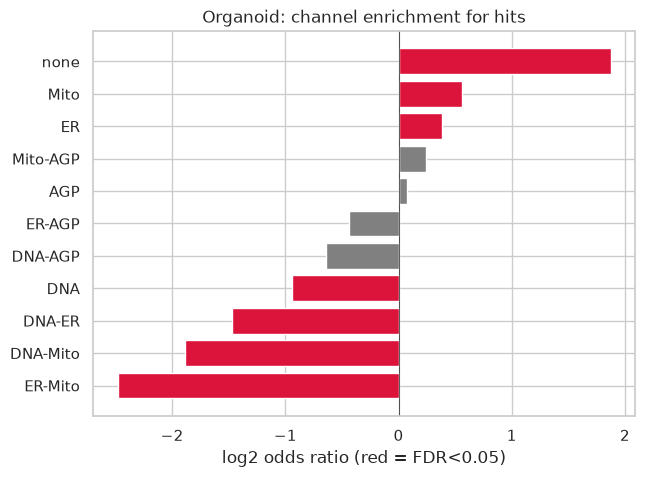

In [ ]:
Q = "Which channel is most enriched for organoid hits?"
e = (
    enr[(enr["profile"] == "organoid") & (enr["family"] == "channel_label")]
    .dropna(subset=["log2_or"])
    .sort_values("log2_or", ascending=False)
)
answer(
    8,
    Q,
    ", ".join(
        f"{r['level']} (log2 OR {r['log2_or']:.2f}, FDR {r['fdr']:.2g})"
        for _, r in e.head(3).iterrows()
    ),
)
e = (
    enr[(enr["profile"] == "organoid") & (enr["family"] == "channel_label")]
    .dropna(subset=["log2_or"])
    .sort_values("log2_or")
)
fig, ax = plt.subplots(figsize=(7, 5))
ax.barh(e["level"], e["log2_or"], color=np.where(e["fdr"] < 0.05, "crimson", "grey"))
ax.axvline(0, color="k", lw=0.5)
ax.set_xlabel("log2 odds ratio (red = FDR<0.05)")
ax.set_title("Organoid: channel enrichment for hits")
savefig(fig, "23_q08_organoid_channel_enrichment")

**Q9. Which feature type (Granularity / Intensity / Colocalization / AreaSizeShape) is most enriched for hits, in organoid and single cell?**

Q9. Which feature type (Granularity / Intensity / Colocalization / AreaSizeShape) is most enriched for hits, in organoid and single cell?
    -> organoid: AreaSizeShape (log2 OR 1.87, FDR 5.6e-14); sc: Intensity (log2 OR 2.37, FDR 1.9e-299)



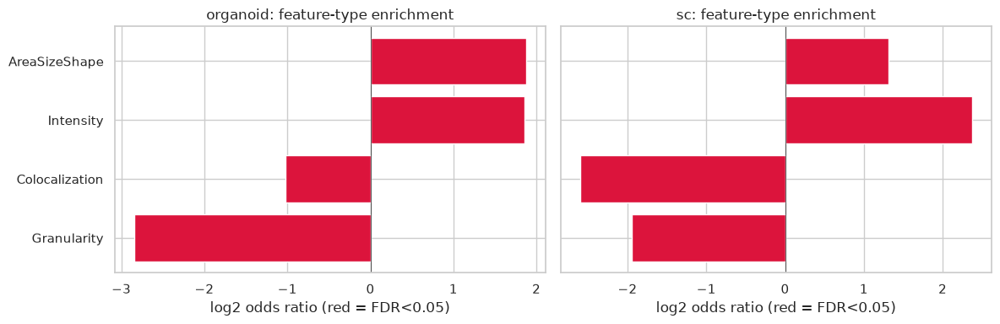

In [ ]:
Q = "Which feature type (Granularity / Intensity / Colocalization / AreaSizeShape) is most enriched for hits, in organoid and single cell?"
parts = []
for p in main_profiles:
    e = (
        enr[(enr["profile"] == p) & (enr["family"] == "Feature_type")]
        .dropna(subset=["log2_or"])
        .sort_values("log2_or", ascending=False)
        .iloc[0]
    )
    parts.append(f"{p}: {e['level']} (log2 OR {e['log2_or']:.2f}, FDR {e['fdr']:.2g})")
answer(9, Q, "; ".join(parts))
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
for ax, p in zip(axes, main_profiles):
    e = (
        enr[(enr["profile"] == p) & (enr["family"] == "Feature_type")]
        .dropna(subset=["log2_or"])
        .sort_values("log2_or")
    )
    ax.barh(
        e["level"], e["log2_or"], color=np.where(e["fdr"] < 0.05, "crimson", "grey")
    )
    ax.axvline(0, color="k", lw=0.5)
    ax.set_title(f"{p}: feature-type enrichment")
    ax.set_xlabel("log2 odds ratio (red = FDR<0.05)")
plt.tight_layout()
savefig(fig, "23_q09_feature_type_enrichment")

**Q10. Which cell compartment is most enriched for single-cell hits?**

Q10. Which cell compartment is most enriched for single-cell hits?
    -> Cell (log2 OR 0.53, FDR 2.8e-17), Cytoplasm (log2 OR 0.02, FDR 0.77), Nuclei (log2 OR -0.62, FDR 1.3e-19)



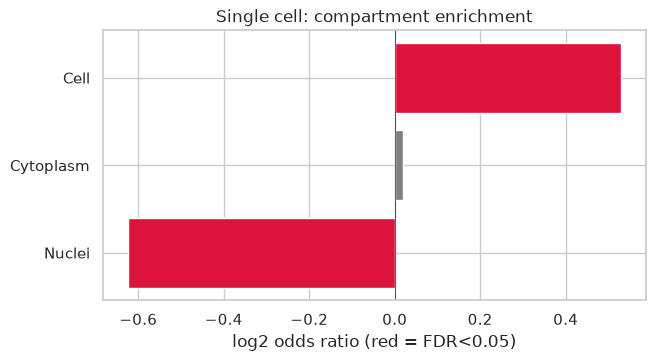

In [ ]:
Q = "Which cell compartment is most enriched for single-cell hits?"
e = (
    enr[(enr["profile"] == "sc") & (enr["family"] == "compartment_label")]
    .dropna(subset=["log2_or"])
    .sort_values("log2_or", ascending=False)
)
answer(
    10,
    Q,
    ", ".join(
        f"{r['level']} (log2 OR {r['log2_or']:.2f}, FDR {r['fdr']:.2g})"
        for _, r in e.iterrows()
    ),
)
e = (
    enr[(enr["profile"] == "sc") & (enr["family"] == "compartment_label")]
    .dropna(subset=["log2_or"])
    .sort_values("log2_or")
)
fig, ax = plt.subplots(figsize=(7, 3.5))
ax.barh(e["level"], e["log2_or"], color=np.where(e["fdr"] < 0.05, "crimson", "grey"))
ax.axvline(0, color="k", lw=0.5)
ax.set_xlabel("log2 odds ratio (red = FDR<0.05)")
ax.set_title("Single cell: compartment enrichment")
savefig(fig, "23_q10_sc_compartment_enrichment")

**Q11. Do treatments mostly increase or decrease features relative to DMSO?**

Q11. Do treatments mostly increase or decrease features relative to DMSO?
    -> organoid: 64% of hits are increases; sc: 53% of hits are increases



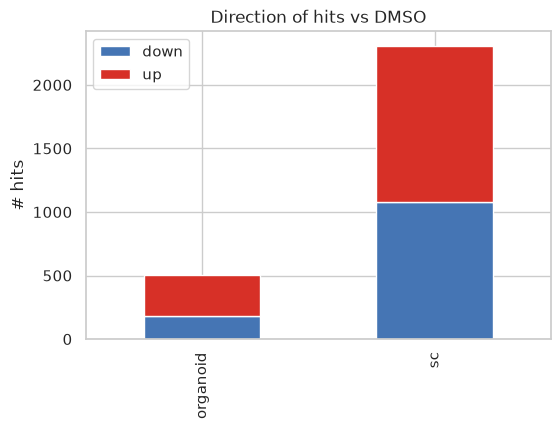

In [ ]:
Q = "Do treatments mostly increase or decrease features relative to DMSO?"
r = {p: (trt[p].loc[trt[p]["hit"], "coefficient"] > 0).mean() for p in main_profiles}
answer(11, Q, "; ".join(f"{p}: {v:.0%} of hits are increases" for p, v in r.items()))
r = pd.DataFrame(
    {
        p: {
            "up": int((trt[p].loc[trt[p]["hit"], "coefficient"] > 0).sum()),
            "down": int((trt[p].loc[trt[p]["hit"], "coefficient"] < 0).sum()),
        }
        for p in main_profiles
    }
).T
fig, ax = plt.subplots(figsize=(6, 4))
r[["down", "up"]].plot.bar(stacked=True, ax=ax, color=["#4575b4", "#d73027"])
ax.set_ylabel("# hits")
ax.set_title("Direction of hits vs DMSO")
savefig(fig, "23_q11_hit_direction")

**Q12. How good are the models: median R2 and the fraction above the R2 threshold?**

Q12. How good are the models: median R2 and the fraction above the R2 threshold?
    -> organoid: median R2 0.184, 14.6% above 0.5; sc: median R2 0.155, 8.9% above 0.5



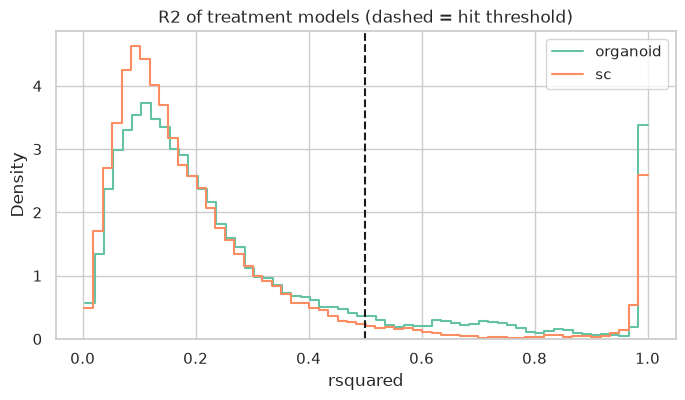

In [ ]:
Q = "How good are the models: median R2 and the fraction above the R2 threshold?"
answer(
    12,
    Q,
    "; ".join(
        f"{p}: median R2 {trt[p]['rsquared'].median():.3f}, {(trt[p]['rsquared'] > R2_MIN).mean():.1%} above {R2_MIN}"
        for p in main_profiles
    ),
)
fig, ax = plt.subplots(figsize=(8, 4))
for p in main_profiles:
    sns.histplot(
        trt[p]["rsquared"],
        bins=60,
        stat="density",
        element="step",
        fill=False,
        ax=ax,
        label=p,
        color=profile_palette[p],
    )
ax.axvline(R2_MIN, color="k", ls="--")
ax.set_title("R2 of treatment models (dashed = hit threshold)")
ax.legend()
savefig(fig, "23_q12_r2_distribution")

**Q13. How often is a model no better than the mean (adjusted R2 <= 0)?**

Q13. How often is a model no better than the mean (adjusted R2 <= 0)?
    -> organoid: 4.9%; sc: 0.1%



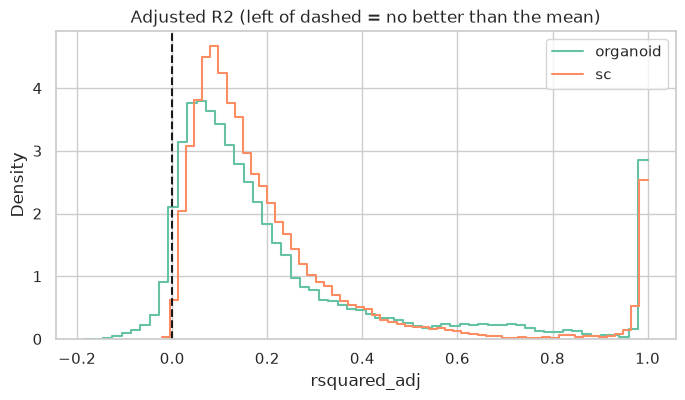

In [ ]:
Q = "How often is a model no better than the mean (adjusted R2 <= 0)?"
answer(
    13,
    Q,
    "; ".join(
        f"{p}: {(trt[p]['rsquared_adj'] <= 0).mean():.1%}" for p in main_profiles
    ),
)
fig, ax = plt.subplots(figsize=(8, 4))
for p in main_profiles:
    sns.histplot(
        trt[p]["rsquared_adj"].clip(-1, 1),
        bins=60,
        stat="density",
        element="step",
        fill=False,
        ax=ax,
        label=p,
        color=profile_palette[p],
    )
ax.axvline(0, color="k", ls="--")
ax.set_title("Adjusted R2 (left of dashed = no better than the mean)")
ax.legend()
savefig(fig, "23_q13_adjusted_r2")

**Q14. On average how much variance does treatment explain, and how much stays in the residual?**

Q14. On average how much variance does treatment explain, and how much stays in the residual?
    -> organoid: treatment 1.4%, residual 72.6%; sc: treatment 1.1%, residual 77.1%



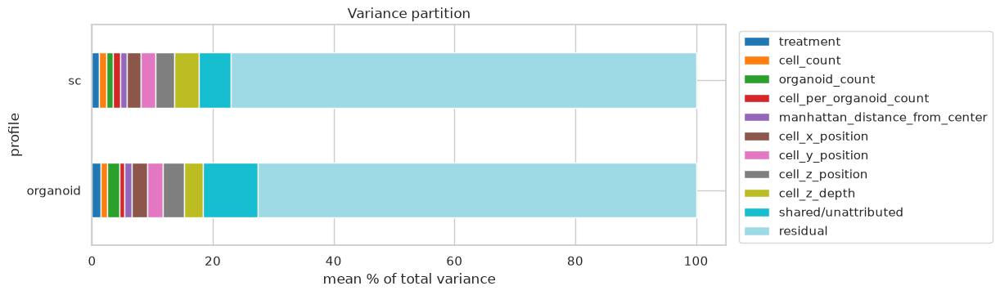

In [ ]:
Q = "On average how much variance does treatment explain, and how much stays in the residual?"
answer(
    14,
    Q,
    "; ".join(
        f"{p}: treatment {partition.loc[p, 'treatment']:.1f}%, residual {partition.loc[p, 'residual']:.1f}%"
        for p in main_profiles
    ),
)
fig, ax = plt.subplots(figsize=(10, 3.5))
partition.loc[main_profiles].plot.barh(stacked=True, ax=ax, colormap="tab20")
ax.set_xlabel("mean % of total variance")
ax.legend(bbox_to_anchor=(1.01, 1))
ax.set_title("Variance partition")
savefig(fig, "23_q14_variance_partition")

In [ ]:
# Storey pi0: estimated fraction of truly non-null tests per profile and model term
STOREY_LAMBDA = 0.5


def storey_pi0(pvalues, lam=STOREY_LAMBDA):
    """Estimate the null proportion pi0 = #(p > lambda) / (m * (1 - lambda)), capped at 1."""
    pvalues = pvalues.dropna()
    return min(1.0, (pvalues > lam).mean() / (1 - lam))


pi0_rows = []
for p in profiles:
    for term, g in lm[p].groupby("term"):
        pi0 = storey_pi0(g["pvalue"])
        pi0_rows.append(
            {
                "profile": p,
                "term": term,
                "n_tests": g["pvalue"].notna().sum(),
                "pi0": pi0,
                "est_frac_non_null": 1 - pi0,
            }
        )
pi0_df = pd.DataFrame(pi0_rows)
pi0_df.to_parquet(results_path / "storey_pi0.parquet", index=False)
pi0_df.loc[pi0_df["profile"].isin(main_profiles)]

,profile,term,n_tests,pi0,est_frac_non_null
0,organoid,cell_count,47918,0.721483,0.278517
1,organoid,cell_per_organoid_count,47918,0.784089,0.215911
2,organoid,cell_x_position,47918,0.922785,0.077215
3,organoid,cell_y_position,47918,0.890772,0.109228
4,organoid,cell_z_depth,47918,0.469594,0.530406
5,organoid,cell_z_position,47918,0.488585,0.511415
6,organoid,manhattan_distance_from_center,47918,0.677491,0.322509
7,organoid,organoid_count,47918,0.572728,0.427272
8,organoid,treatment,47918,0.637297,0.362703
9,sc,cell_count,144088,0.370565,0.629435


**Q15. What fraction of treatment tests look truly non-null (Storey pi0)?**

Q15. What fraction of treatment tests look truly non-null (Storey pi0)?
    -> organoid: 36.3%; sc: 58.3%



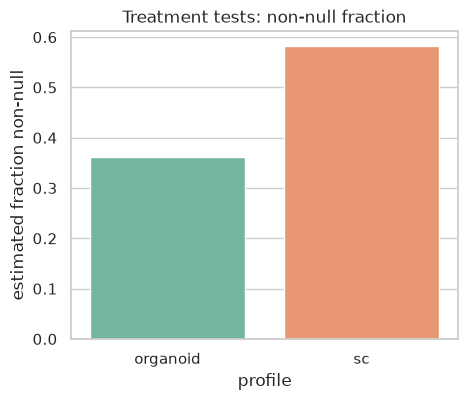

In [ ]:
Q = "What fraction of treatment tests look truly non-null (Storey pi0)?"
r = pi0_df.loc[pi0_df["term"] == "treatment"].set_index("profile")["est_frac_non_null"]
answer(15, Q, "; ".join(f"{p}: {r[p]:.1%}" for p in main_profiles))
r = pi0_df.loc[pi0_df["profile"].isin(main_profiles) & (pi0_df["term"] == "treatment")]
fig, ax = plt.subplots(figsize=(5, 4))
sns.barplot(data=r, x="profile", y="est_frac_non_null", palette=profile_palette, ax=ax)
ax.set_ylabel("estimated fraction non-null")
ax.set_title("Treatment tests: non-null fraction")
savefig(fig, "23_q15_treatment_non_null_fraction")

**Q16. Which model term carries the most non-null signal: treatment or a covariate?**

Q16. Which model term carries the most non-null signal: treatment or a covariate?
    -> sc: cell_z_depth (74.2%); organoid: cell_z_depth (53.0%)



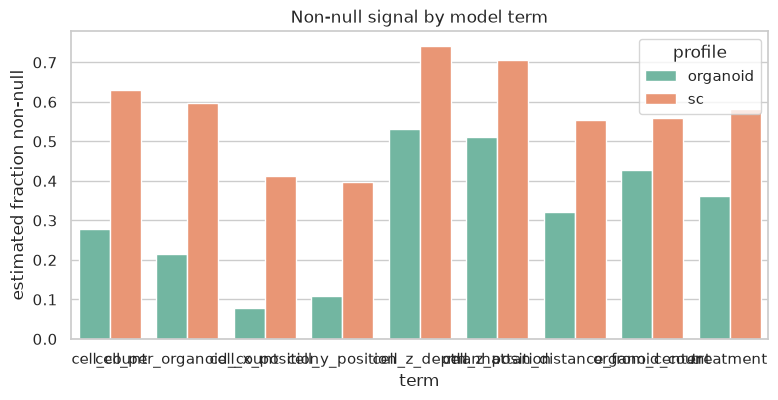

In [ ]:
Q = "Which model term carries the most non-null signal: treatment or a covariate?"
r = (
    pi0_df.loc[pi0_df["profile"].isin(main_profiles)]
    .sort_values("est_frac_non_null", ascending=False)
    .drop_duplicates("profile")
)
answer(
    16,
    Q,
    "; ".join(
        f"{x['profile']}: {x['term']} ({x['est_frac_non_null']:.1%})"
        for _, x in r.iterrows()
    ),
)
r = pi0_df.loc[pi0_df["profile"].isin(main_profiles)]
fig, ax = plt.subplots(figsize=(9, 4))
sns.barplot(
    data=r,
    x="term",
    y="est_frac_non_null",
    hue="profile",
    palette=profile_palette,
    ax=ax,
)
ax.set_ylabel("estimated fraction non-null")
ax.set_title("Non-null signal by model term")
savefig(fig, "23_q16_non_null_by_term")

**Q17. Which feature is hit most often across all organoid treatments and patients?**

Q17. Which feature is hit most often across all organoid treatments and patients?
    -> Organoid_Mito_Intensity_IntegratedIntensityEdge (32), Organoid_AGP_Intensity_IntegratedIntensityEdge (30), Organoid_ER_Intensity_IntegratedIntensityEdge (28), Organoid_ER_Intensity_CMI-Z (24), Organoid_AGP_Intensity_CMI-Z (23)



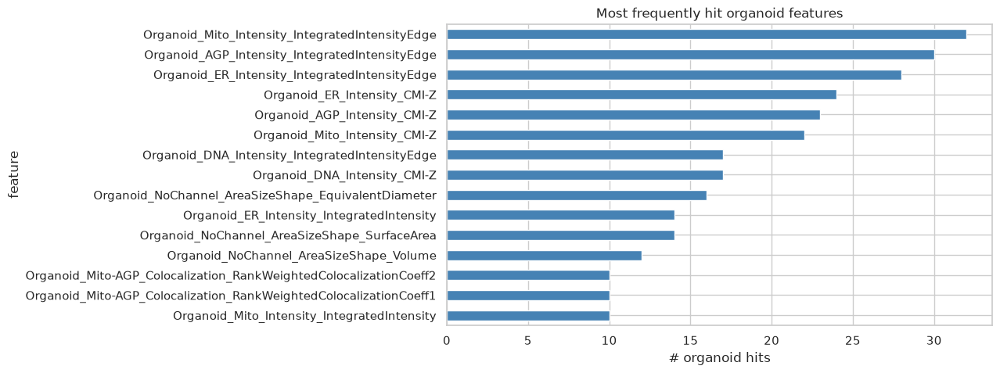

In [ ]:
Q = "Which feature is hit most often across all organoid treatments and patients?"
r = (
    trt["organoid"]
    .loc[trt["organoid"]["hit"]]
    .groupby("feature")
    .size()
    .sort_values(ascending=False)
)
answer(17, Q, ", ".join(f"{k} ({v})" for k, v in r.head(5).items()))
r = (
    trt["organoid"]
    .loc[trt["organoid"]["hit"]]
    .groupby("feature")
    .size()
    .sort_values()
    .tail(15)
)
fig, ax = plt.subplots(figsize=(9, 5))
r.plot.barh(ax=ax, color="steelblue")
ax.set_xlabel("# organoid hits")
ax.set_title("Most frequently hit organoid features")
savefig(fig, "23_q17_most_hit_features")

**Q18. Which single (treatment, feature) pair is a hit in the most patients?**

Q18. Which single (treatment, feature) pair is a hit in the most patients?
    -> organoid: Mirdametinib_10uM / Organoid_NoChannel_AreaSizeShape_Volume (4 of 12 patients); sc: Digoxin_1uM / Cell_AGP_Intensity_CMI-Z (8 of 12 patients)



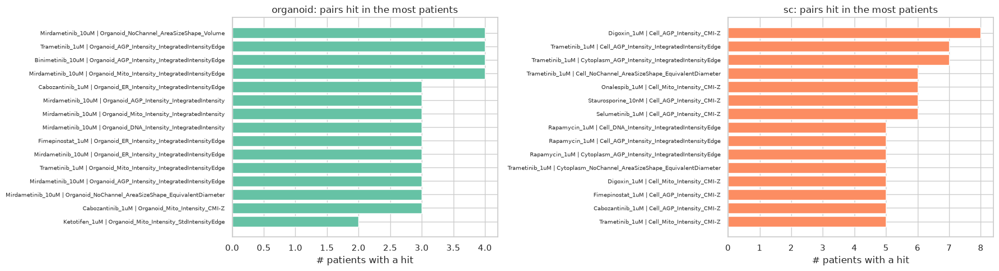

In [ ]:
Q = "Which single (treatment, feature) pair is a hit in the most patients?"
parts = []
for p in main_profiles:
    x = (
        consensus[p]
        .sort_values(["n_patients_hit", "mean_abs_coef"], ascending=False)
        .iloc[0]
    )
    parts.append(
        f"{p}: {x['treatment']} / {x['feature']} ({int(x['n_patients_hit'])} of {int(x['n_patients_tested'])} patients)"
    )
answer(18, Q, "; ".join(parts))
fig, axes = plt.subplots(1, 2, figsize=(18, 5))
for ax, p in zip(axes, main_profiles):
    x = consensus[p].sort_values(["n_patients_hit", "mean_abs_coef"]).tail(15)
    ax.barh(
        x["treatment"] + " | " + x["feature"],
        x["n_patients_hit"],
        color=profile_palette[p],
    )
    ax.tick_params(axis="y", labelsize=7)
    ax.set_xlabel("# patients with a hit")
    ax.set_title(f"{p}: pairs hit in the most patients")
plt.tight_layout()
savefig(fig, "23_q18_pairs_by_patients_hit")

**Q19. How many (treatment, feature) pairs replicate (>=3 patients, >=80% same sign)?**

Q19. How many (treatment, feature) pairs replicate (>=3 patients, >=80% same sign)?
    -> organoid: 6; sc: 50



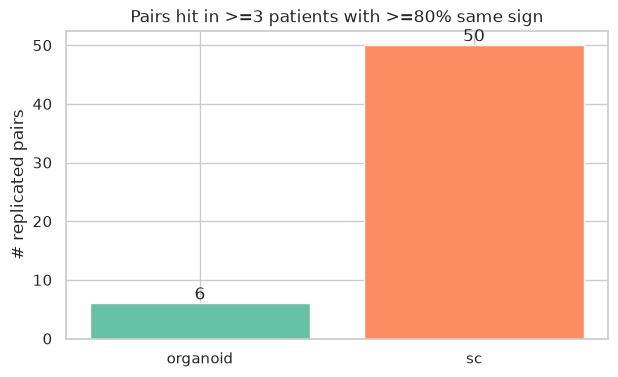

In [ ]:
Q = "How many (treatment, feature) pairs replicate (>=3 patients, >=80% same sign)?"
answer(
    19,
    Q,
    "; ".join(
        f"{p}: {int(((consensus[p]['n_patients_hit'] >= 3) & (consensus[p]['sign_concordance'] >= 0.8)).sum())}"
        for p in main_profiles
    ),
)
fig, ax = plt.subplots(figsize=(7, 4))
for p in main_profiles:
    c = consensus[p]
    rep = (c["n_patients_hit"] >= 3) & (c["sign_concordance"] >= 0.8)
    ax.bar(p, rep.sum(), color=profile_palette[p])
    ax.text(p, rep.sum(), str(int(rep.sum())), ha="center", va="bottom")
ax.set_ylabel("# replicated pairs")
ax.set_title("Pairs hit in >=3 patients with >=80% same sign")
savefig(fig, "23_q19_replicated_pairs")

**Q20. Do the four MEK inhibitors share hit features?**

Q20. Do the four MEK inhibitors share hit features?
    -> organoid: 18 features hit by >=3 of 4 MEK drugs (top: Organoid_AGP_Intensity_CMI-Z, Organoid_AGP_Intensity_IntegratedIntensityEdge, Organoid_Mito_Intensity_CMI-Z); sc: 85 features hit by >=3 of 4 MEK drugs (top: Cell_AGP_Granularity_16, Cell_AGP_Granularity_8, Cell_AGP_Intensity_CMI-Z)



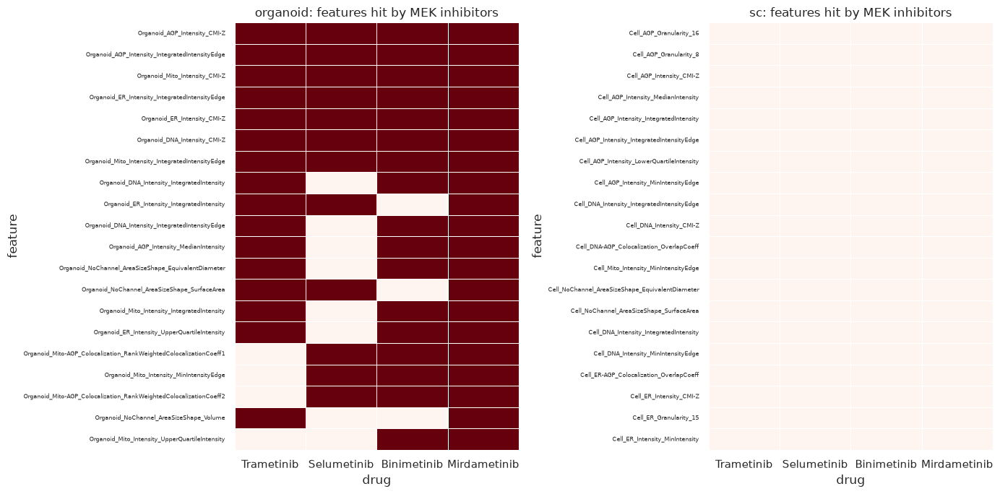

In [ ]:
Q = "Do the four MEK inhibitors share hit features?"
mek = ["Trametinib", "Selumetinib", "Binimetinib", "Mirdametinib"]
parts = []
for p in main_profiles:
    h = trt[p].loc[trt[p]["hit"] & trt[p]["drug"].isin(mek)]
    nd = h.groupby("feature")["drug"].nunique()
    parts.append(
        f"{p}: {int((nd >= 3).sum())} features hit by >=3 of 4 MEK drugs (top: {', '.join(nd.sort_values(ascending=False).head(3).index)})"
    )
answer(20, Q, "; ".join(parts))
mek = ["Trametinib", "Selumetinib", "Binimetinib", "Mirdametinib"]
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
for ax, p in zip(axes, main_profiles):
    h = trt[p].loc[trt[p]["hit"] & trt[p]["drug"].isin(mek)]
    m = (
        h.assign(v=1)
        .pivot_table(index="feature", columns="drug", values="v", aggfunc="max")
        .reindex(columns=mek)
        .fillna(0)
    )
    m = m.loc[m.sum(axis=1).sort_values(ascending=False).index].head(20)
    sns.heatmap(m, ax=ax, cmap="Reds", cbar=False, yticklabels=True, linewidths=0.5)
    ax.tick_params(axis="y", labelsize=6)
    ax.set_title(f"{p}: features hit by MEK inhibitors")
plt.tight_layout()
savefig(fig, "23_q20_mek_shared_features")

**Q21. Do 1 uM and 10 uM of the same drug agree?**

Q21. Do 1 uM and 10 uM of the same drug agree?
    -> organoid: mean Spearman 0.34, sign agreement 63%; sc: mean Spearman 0.33, sign agreement 62%



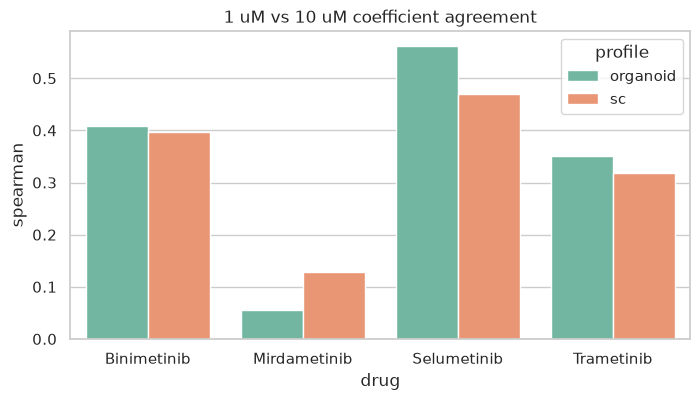

In [ ]:
Q = "Do 1 uM and 10 uM of the same drug agree?"
r = (
    dose_pairs.loc[dose_pairs["profile"].isin(main_profiles)]
    .groupby("profile")[["spearman", "sign_agreement"]]
    .mean()
)
answer(
    21,
    Q,
    "; ".join(
        f"{p}: mean Spearman {r.loc[p, 'spearman']:.2f}, sign agreement {r.loc[p, 'sign_agreement']:.0%}"
        for p in main_profiles
    ),
)
r = dose_pairs.loc[dose_pairs["profile"].isin(main_profiles)]
fig, ax = plt.subplots(figsize=(8, 4))
sns.barplot(
    data=r, x="drug", y="spearman", hue="profile", palette=profile_palette, ax=ax
)
ax.set_title("1 uM vs 10 uM coefficient agreement")
savefig(fig, "23_q21_dose_agreement")

**Q22. Do organoid and single-cell readouts agree?**

Q22. Do organoid and single-cell readouts agree?
    -> coefficient Spearman 0.48; hit overlap odds ratio 11.9 (113 shared of 483 organoid hits)



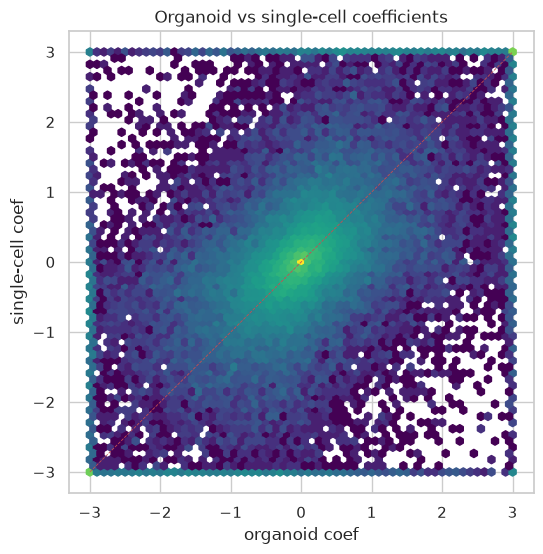

In [ ]:
Q = "Do organoid and single-cell readouts agree?"
rho = spearmanr(os_merge["coef_org"], os_merge["coef_sc"])[0]
cont = pd.crosstab(os_merge["hit_org"], os_merge["hit_sc"])
orr = fisher_exact(cont.values)[0]
answer(
    22,
    Q,
    f"coefficient Spearman {rho:.2f}; hit overlap odds ratio {orr:.1f} ({int(cont.loc[True, True])} shared of {int(cont.loc[True].sum())} organoid hits)",
)
fig, ax = plt.subplots(figsize=(6, 6))
ax.hexbin(
    os_merge["coef_org"].clip(-3, 3),
    os_merge["coef_sc"].clip(-3, 3),
    gridsize=60,
    bins="log",
    cmap="viridis",
)
ax.plot([-3, 3], [-3, 3], "r--", lw=0.6)
ax.set_xlabel("organoid coef")
ax.set_ylabel("single-cell coef")
ax.set_title("Organoid vs single-cell coefficients")
savefig(fig, "23_q22_organoid_vs_sc")

**Q23. Does aggregating profiles change the conclusions?**

Q23. Does aggregating profiles change the conclusions?
    -> organoid vs organoid_agg: coef Spearman 0.53, hit Jaccard 0.000, sign agreement 82%; sc vs sc_agg: coef Spearman 0.65, hit Jaccard 0.002, sign agreement 80%



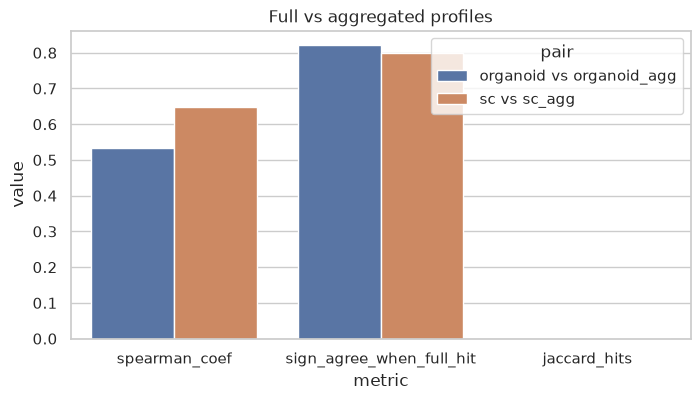

In [ ]:
Q = "Does aggregating profiles change the conclusions?"
answer(
    23,
    Q,
    "; ".join(
        f"{r['pair']}: coef Spearman {r['spearman_coef']:.2f}, hit Jaccard {r['jaccard_hits']:.3f}, sign agreement {r['sign_agree_when_full_hit']:.0%}"
        for _, r in agg_concordance.iterrows()
    ),
)
r = agg_concordance.melt(
    id_vars="pair",
    value_vars=["spearman_coef", "sign_agree_when_full_hit", "jaccard_hits"],
    var_name="metric",
)
fig, ax = plt.subplots(figsize=(8, 4))
sns.barplot(data=r, x="metric", y="value", hue="pair", ax=ax)
ax.set_title("Full vs aggregated profiles")
savefig(fig, "23_q23_full_vs_agg")

**Q25. What fraction of hits are count-linked rather than treatment-driven?**

Q25. What fraction of hits are count-linked rather than treatment-driven?
    -> organoid: 65%; sc: 47%



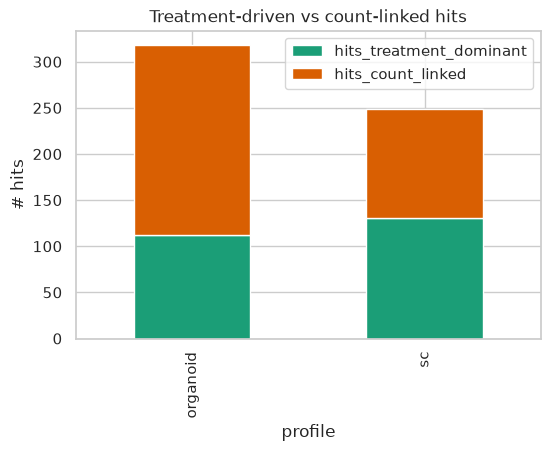

In [ ]:
Q = "What fraction of hits are count-linked rather than treatment-driven?"
r = count_view.groupby("profile")[["hits", "hits_count_linked"]].sum()
answer(
    25,
    Q,
    "; ".join(
        f"{p}: {r.loc[p, 'hits_count_linked'] / r.loc[p, 'hits']:.0%}"
        for p in main_profiles
    ),
)
r = (
    count_view.groupby("profile")[["hits_treatment_dominant", "hits_count_linked"]]
    .sum()
    .loc[main_profiles]
)
fig, ax = plt.subplots(figsize=(6, 4))
r.plot.bar(stacked=True, ax=ax, color=["#1b9e77", "#d95f02"])
ax.set_ylabel("# hits")
ax.set_title("Treatment-driven vs count-linked hits")
savefig(fig, "23_q25_count_linked_hits")

**Q26. Which treatments have the most count-linked hits (candidate viability/toxicity effects)?**

Q26. Which treatments have the most count-linked hits (candidate viability/toxicity effects)?
    -> organoid: Selumetinib_10uM (100% of 6), Selumetinib_1uM (100% of 11), Everolimus_1uM (93% of 15); sc: Mirdametinib_10uM (100% of 17), Everolimus_1uM (100% of 8), Copanlisib_1uM (100% of 7)



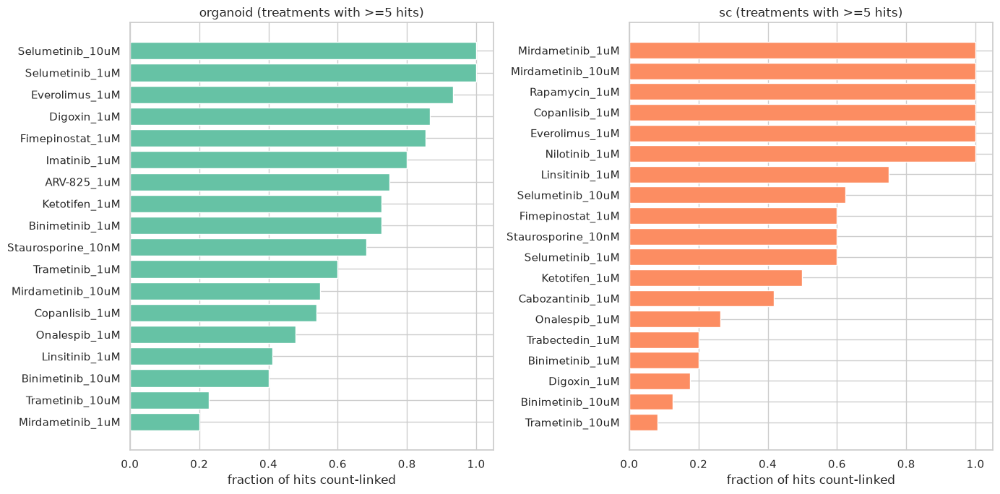

In [ ]:
Q = "Which treatments have the most count-linked hits (candidate viability/toxicity effects)?"
parts = []
for p in main_profiles:
    x = (
        count_view.loc[(count_view["profile"] == p) & (count_view["hits"] >= 5)]
        .assign(f=lambda d: d["hits_count_linked"] / d["hits"])
        .sort_values("f", ascending=False)
        .head(3)
    )
    parts.append(
        f"{p}: "
        + ", ".join(
            f"{r['treatment']} ({r['f']:.0%} of {int(r['hits'])})"
            for _, r in x.iterrows()
        )
    )
answer(26, Q, "; ".join(parts))
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
for ax, p in zip(axes, main_profiles):
    x = (
        count_view.loc[(count_view["profile"] == p) & (count_view["hits"] >= 5)]
        .assign(f=lambda d: d["hits_count_linked"] / d["hits"])
        .sort_values("f")
    )
    ax.barh(x["treatment"], x["f"], color=profile_palette[p])
    ax.set_xlabel("fraction of hits count-linked")
    ax.set_title(f"{p} (treatments with >=5 hits)")
plt.tight_layout()
savefig(fig, "23_q26_count_linked_by_treatment")

**Q27. Which tumor type has the highest and lowest hit rate?**

Q27. Which tumor type has the highest and lowest hit rate?
    -> organoid: highest Other (1.09%), lowest MPNST (0.01%); sc: highest cNF (0.28%), lowest MPNST (0.00%)



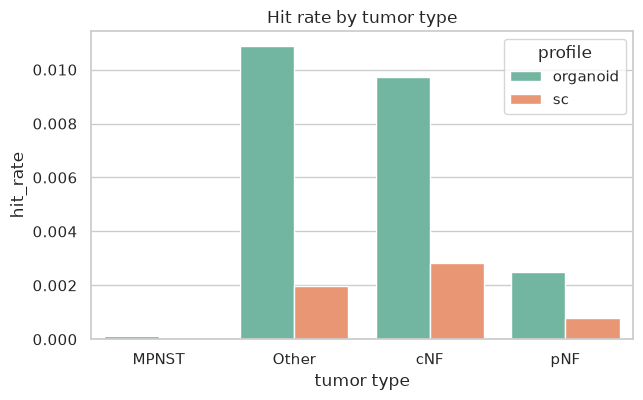

In [ ]:
Q = "Which tumor type has the highest and lowest hit rate?"
parts = []
for p in main_profiles:
    r = landscape.loc[
        (landscape["profile"] == p) & (landscape["level"] == "tumor_type")
    ].sort_values("hit_rate", ascending=False)
    parts.append(
        f"{p}: highest {r.iloc[0]['group']} ({r.iloc[0]['hit_rate']:.2%}), lowest {r.iloc[-1]['group']} ({r.iloc[-1]['hit_rate']:.2%})"
    )
answer(27, Q, "; ".join(parts))
r = landscape.loc[
    landscape["profile"].isin(main_profiles) & (landscape["level"] == "tumor_type")
]
fig, ax = plt.subplots(figsize=(7, 4))
sns.barplot(
    data=r, x="group", y="hit_rate", hue="profile", palette=profile_palette, ax=ax
)
ax.set_xlabel("tumor type")
ax.set_title("Hit rate by tumor type")
savefig(fig, "23_q27_hit_rate_by_tumor_type")

**Q28. How many tumor-type-specific effects are there, and which tumor type owns them?**

Q28. How many tumor-type-specific effects are there, and which tumor type owns them?
    -> organoid: 10 (Other: 9, pNF: 1); sc: 13 (Other: 13)



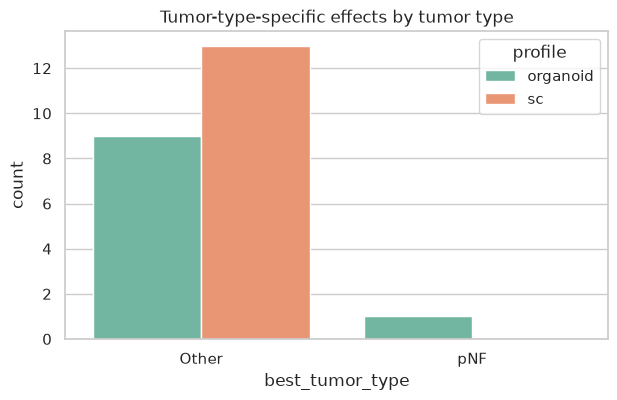

In [ ]:
Q = "How many tumor-type-specific effects are there, and which tumor type owns them?"
parts = []
for p in main_profiles:
    x = ts_all.loc[ts_all["profile"] == p]["best_tumor_type"].value_counts()
    parts.append(
        f"{p}: {int(x.sum())} (" + ", ".join(f"{k}: {v}" for k, v in x.items()) + ")"
    )
answer(28, Q, "; ".join(parts))
fig, ax = plt.subplots(figsize=(7, 4))
sns.countplot(
    data=ts_all, x="best_tumor_type", hue="profile", palette=profile_palette, ax=ax
)
ax.set_title("Tumor-type-specific effects by tumor type")
savefig(fig, "23_q28_tumor_type_specific")

**Q29. Is a treatment signature driven more by the patient or by the drug?**

Q29. Is a treatment signature driven more by the patient or by the drug?
    -> organoid: different both r=0.00, different patient, same drug r=0.02, same patient, different drug r=0.20, same patient, same drug (doses) r=0.27; sc: different both r=0.01, different patient, same drug r=0.01, same patient, different drug r=0.21, same patient, same drug (doses) r=0.32



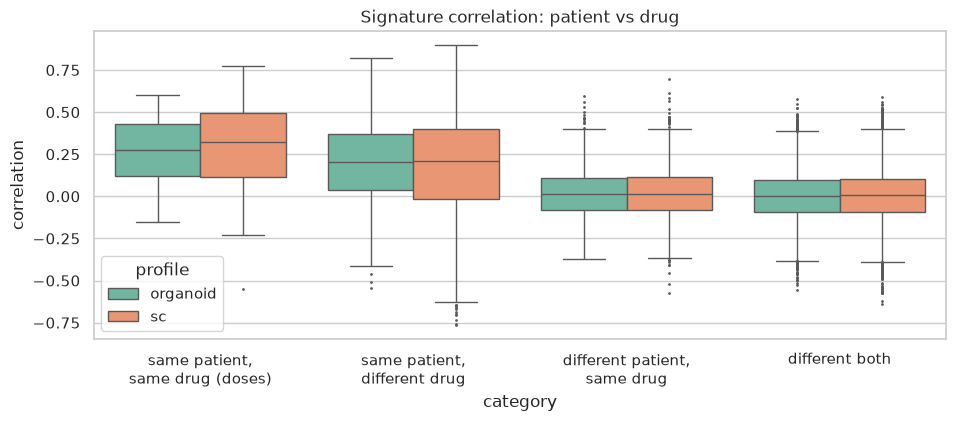

In [ ]:
Q = "Is a treatment signature driven more by the patient or by the drug?"
r = (
    pairs.assign(category=pairs["category"].str.replace("\n", " ", regex=False))
    .groupby(["profile", "category"])["correlation"]
    .median()
    .unstack()
)
answer(
    29,
    Q,
    "; ".join(
        f"{p}: " + ", ".join(f"{c} r={v:.2f}" for c, v in r.loc[p].items())
        for p in main_profiles
    ),
)
fig, ax = plt.subplots(figsize=(11, 4))
sns.boxplot(
    data=pairs,
    x="category",
    y="correlation",
    hue="profile",
    palette=profile_palette,
    ax=ax,
    fliersize=1,
)
ax.set_title("Signature correlation: patient vs drug")
savefig(fig, "23_q29_patient_vs_drug")

**Q30. Are drugs of the same MOA more alike than chance?**

Q30. Are drugs of the same MOA more alike than chance?
    -> organoid: within-minus-between correlation 0.078, permutation p=0.011; sc: within-minus-between correlation 0.063, permutation p=0.065



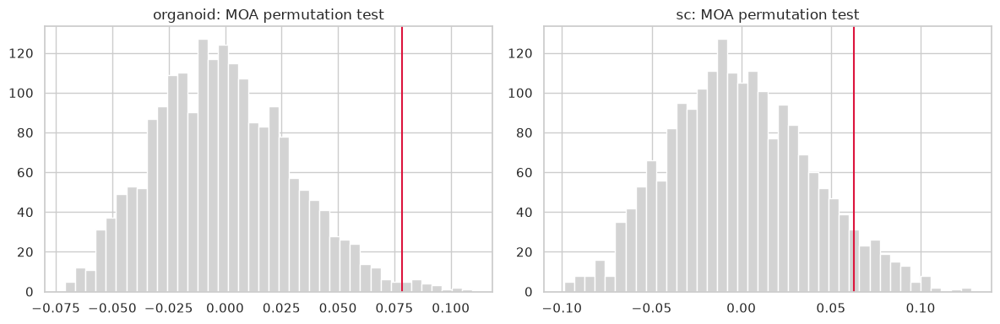

In [ ]:
Q = "Are drugs of the same MOA more alike than chance?"
answer(
    30,
    Q,
    "; ".join(
        f"{r['profile']}: within-minus-between correlation {r['observed_within_minus_between']:.3f}, permutation p={r['p_value']:.3f}"
        for _, r in moa_test.iterrows()
    ),
)
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for ax, p in zip(axes, main_profiles):
    obs, perms = perm_store[p]
    ax.hist(perms, bins=40, color="lightgrey")
    ax.axvline(obs, color="crimson")
    ax.set_title(f"{p}: MOA permutation test")
plt.tight_layout()
savefig(fig, "23_q30_moa_permutation")

In [ ]:
qa_df = pd.DataFrame(qa).sort_values("n")
qa_df.to_parquet(results_path / "qa_answers.parquet", index=False)
print(f"{len(qa_df)} questions answered")
qa_df

30 questions answered


,n,question,answer
0,1,"How big is the haystack, and what fraction of ...","organoid: 48,070 models, 318 hits (0.66%); sc:..."
1,2,Which patient has the highest organoid hit rate?,"NF0014_T1 (2.50%); next: NF0040_T1 (1.54%), NF..."
2,3,Which patient has the lowest organoid hit rate...,NF0014_T1 (250.00%); median across patients 36...
3,4,Which treatment produces the most organoid hits?,"Staurosporine_10nM (44), Fimepinostat_1uM (34)..."
4,5,Which treatment produces the most single-cell ...,"Trametinib_10uM (37), Binimetinib_10uM (24), O..."
5,6,Which drugs have no organoid hits at all?,"Panobinostat, Rapamycin, Vistusertib"
6,7,Which mechanism of action (therapeutic categor...,"Experimental (2.11%), PROTAC (2.11%), Anti-All..."
7,8,Which channel is most enriched for organoid hits?,"none (log2 OR 3.23, FDR 4.5e-39), AGP (log2 OR..."
8,9,Which feature type (Granularity / Intensity / ...,"organoid: AreaSizeShape (log2 OR 3.23, FDR 1.6..."
9,10,Which cell compartment is most enriched for si...,"Cell (log2 OR 0.18, FDR 0.52), Cytoplasm (log2..."


## 24. Every technical variate, explored like treatment

*Sections 4-22 mostly look at the treatment term. The technical model also fits
`cell_count`, `organoid_count`, `cell_per_organoid_count`, well distance, x/y/z position and z depth for
every (patient, treatment, feature). Here each term gets the same treatment: how often it is
significant, how much variance it takes, where it acts (patient, treatment, feature family) and
whether it replicates across patients.*

Covariate coefficients are per-unit slopes and are not comparable across terms, so the effect-size
axis is `term_pct_of_total_var`. A term-level "hit" is `pvalue_fdr < FDR_MAX` in a good model
(`R2 > R2_MIN`, `adj R2 > R2_ADJ_MIN`); the coefficient cut-off is dropped because it is on the treatment scale.

In [ ]:
# term-level call for every term (treatment included), all profiles
for p in profiles:
    lm[p]["term_hit"] = lm[p]["sig"] & lm[p]["good_model"]

term_summary = pd.concat(
    [
        lm[p]
        .groupby("term")
        .agg(
            n_models=("term_hit", "size"),
            frac_sig=("sig", "mean"),
            frac_term_hit=("term_hit", "mean"),
            median_pct_var=("term_pct_of_total_var", "median"),
            mean_pct_var=("term_pct_of_total_var", "mean"),
            frac_positive=("coefficient", lambda s: (s > 0).mean()),
        )
        .reindex(term_order)
        .assign(profile=p)
        .reset_index()
        for p in profiles
    ]
)
term_summary.to_parquet(results_path / "term_summary_all_terms.parquet", index=False)

fig, axes = plt.subplots(1, 3, figsize=(24, 6), sharey=True)
for ax, (col, lab) in zip(
    axes,
    [
        ("frac_term_hit", "fraction of models with a significant term"),
        ("mean_pct_var", "mean % of total variance"),
        ("frac_positive", "fraction of positive coefficients"),
    ],
):
    sns.barplot(
        data=term_summary,
        y="term",
        x=col,
        hue="profile",
        order=term_order,
        palette=profile_palette,
        ax=ax,
    )
    ax.set_title(lab)
    if ax is not axes[0]:
        ax.legend_.remove()
plt.tight_layout()
savefig(fig, "24_term_summary")
term_summary

In [ ]:
# significance vs variance share, one panel per term
fig, axes = plt.subplots(
    len(main_profiles),
    len(term_order),
    figsize=(3.2 * len(term_order), 6.5),
    sharey=True,
    squeeze=False,
)
for i, p in enumerate(main_profiles):
    for j, term in enumerate(term_order):
        d = lm[p].loc[lm[p]["term"] == term]
        d = d.sample(min(len(d), 30000), random_state=0)
        ax.scatter = axes[i, j].scatter(
            d["term_pct_of_total_var"],
            -np.log10(d["pvalue_fdr"].clip(lower=1e-300)),
            s=1,
            c=np.where(d["term_hit"], "#d73027", "lightgrey"),
            rasterized=True,
        )
        axes[i, j].axhline(-np.log10(FDR_MAX), color="k", ls="--", lw=0.5)
        axes[i, j].set_title(f"{p}: {term}", fontsize=7)
        axes[i, j].set_xlabel("% total variance", fontsize=7)
        if j == 0:
            axes[i, j].set_ylabel("-log10 FDR")
plt.tight_layout()
savefig(fig, "24_volcano_all_terms")

In [ ]:
# where does each term act? term hit rate by patient and by treatment
for p in main_profiles:
    fig, axes = plt.subplots(1, 2, figsize=(26, 6))
    by_patient = (
        lm[p]
        .pivot_table(index="term", columns="patient", values="term_hit", aggfunc="mean")
        .reindex(term_order)
    )
    sns.heatmap(
        by_patient,
        ax=axes[0],
        cmap="rocket_r",
        annot=True,
        fmt=".2f",
        cbar_kws={"label": "term hit rate"},
    )
    axes[0].set_title(f"{p}: term x patient")
    by_trt = (
        lm[p]
        .pivot_table(
            index="term",
            columns="treatment",
            values="term_pct_of_total_var",
            aggfunc="median",
        )
        .reindex(term_order)
    )
    sns.heatmap(
        by_trt,
        ax=axes[1],
        cmap="rocket_r",
        cbar_kws={"label": "median % total variance"},
    )
    axes[1].set_title(f"{p}: term x treatment")
    plt.tight_layout()
    savefig(fig, f"24_term_by_patient_and_treatment_{p}")
    by_patient.reset_index().to_parquet(
        results_path / f"term_hit_rate_by_patient_{p}.parquet", index=False
    )

In [ ]:
# which parts of the feature space does each term touch? term x feature family, mean % variance
for p in main_profiles:
    fig, axes = plt.subplots(1, 3, figsize=(26, 6))
    for ax, fam in zip(axes, ["channel_label", "compartment_label", "Feature_type"]):
        m = (
            lm[p]
            .pivot_table(
                index="term",
                columns=fam,
                values="term_pct_of_total_var",
                aggfunc="mean",
            )
            .reindex(term_order)
        )
        sns.heatmap(
            m,
            ax=ax,
            cmap="rocket_r",
            annot=True,
            fmt=".1f",
            cbar_kws={"label": "mean % total variance"},
        )
        ax.set_title(f"{p}: term x {fam}")
        m.reset_index().to_parquet(
            results_path / f"term_by_{fam}_{p}.parquet", index=False
        )
    plt.tight_layout()
    savefig(fig, f"24_term_by_feature_family_{p}")

In [ ]:
# do term effects replicate across patients? patients with a significant term per (treatment, feature)
rep_rows = []
for p in main_profiles:
    n_pat = (
        lm[p]
        .loc[lm[p]["term_hit"]]
        .groupby(["term", "treatment", "feature"])["patient"]
        .nunique()
        .rename("n_patients")
        .reset_index()
    )
    n_pat["profile"] = p
    rep_rows.append(n_pat)
rep = pd.concat(rep_rows)
rep.to_parquet(results_path / "term_patient_replication.parquet", index=False)

fig, axes = plt.subplots(1, len(main_profiles), figsize=(22, 6), sharey=True)
for ax, p in zip(np.atleast_1d(axes), main_profiles):
    x = rep.loc[rep["profile"] == p]
    frac = (
        x.assign(rep3=x["n_patients"] >= 3)
        .groupby("term")["rep3"]
        .mean()
        .reindex(term_order)
    )
    ax.barh(frac.index, frac.values, color=profile_palette[p])
    ax.set_title(
        f"{p}: fraction of (treatment, feature) pairs with the term significant in >=3 patients"
    )
    ax.title.set_fontsize(8)
plt.tight_layout()
savefig(fig, "24_term_patient_replication")

In [ ]:
pdfs.close()